<a href="https://colab.research.google.com/github/sprashanthmohan/DataQuest/blob/master/accident_data_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import pandas as pd
import numpy as np

Accident Frequency by Country:

Analyze the number of accidents in each country to identify which countries have the highest and lowest accident rates.
Time-based Accident Trends:

Determine the distribution of accidents by time of day, day of the week, or month. This can highlight peak times for accidents.

Accident Types Analysis:

Break down the data by the kind of accident (e.g., collision, rollover, pedestrian involved) to see which types are most common.
Injury Severity Analysis:

Examine the severity of injuries (e.g., minor, serious, fatal) in relation to the types of accidents and other factors like light conditions and road surface.
Impact of Light Conditions:

Assess how different light conditions (daylight, dusk, night) affect the frequency and severity of accidents.
Vehicle Involvement Analysis:

Analyze which types of vehicles (e.g., cars, motorcycles, trucks) are most frequently involved in accidents and how this varies by country or time of day.
Road Surface Conditions Impact:

Investigate the influence of road surface conditions (e.g., dry, wet, icy) on the occurrence and severity of accidents.
Geospatial Accident Analysis:

Use the coordinates of accidents to create heatmaps or cluster maps to identify high-risk areas or accident hotspots.
Accident and Injury Correlation:

Explore the correlation between different types of accidents and the resulting injuries. For example, determine if certain accidents are more likely to result in serious injuries.

In [4]:
data_2018 = pd.read_csv('2018_data.csv')
data_2019 = pd.read_csv('2019_data.csv')
data_2020 = pd.read_csv('2020_data.csv')
data_2021 = pd.read_csv('2021_data.csv')
data_2022 = pd.read_csv('2022_data.csv')

In [5]:
data_2018.head()

,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,UKATEGORIE,UART,...,USTRZUSTAND,IstRad,IstPKW,IstFuss,IstKrad,IstGkfz,IstSonstige,X-Axis,Y-Axis,Year
0,1,0,3,0,2018,1,8,5,2,0,...,0,1,0,0,0,0,0,10.703950,53.863081,2018
1,1,0,62,20,2018,1,15,6,3,5,...,1,0,1,0,0,0,0,10.394497,53.589906,2018
2,1,0,56,15,2018,1,19,4,3,2,...,1,0,1,0,0,0,0,9.714396,53.743907,2018
3,1,0,59,37,2018,1,10,5,3,5,...,1,0,1,0,0,0,0,9.528666,54.636949,2018
4,1,0,58,150,2018,1,13,3,3,5,...,0,0,1,0,0,0,0,10.115680,54.479588,2018


In [6]:
print(data_2018.shape)
print(data_2019.shape)
print(data_2020.shape)
print(data_2021.shape)
print(data_2022.shape)

(211868, 22)
(268370, 22)
(237994, 22)
(233208, 22)
(256492, 22)


In [7]:
accident_data_master = pd.concat([data_2018,data_2019,data_2020,data_2021,data_2022])

In [8]:
accident_data_master.shape

(1207932, 22)

In [96]:
accident_data_master.head()

,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,UKATEGORIE,UART,...,IstRad,IstPKW,IstFuss,IstKrad,IstGkfz,IstSonstige,X-Axis,Y-Axis,Year,datetime
0,1,0,3,0,2018,1,8,5,2,0,...,1,0,0,0,0,0,10.703950,53.863081,2018,2018-01-01
1,1,0,62,20,2018,1,15,6,3,5,...,0,1,0,0,0,0,10.394497,53.589906,2018,2018-01-01
2,1,0,56,15,2018,1,19,4,3,2,...,0,1,0,0,0,0,9.714396,53.743907,2018,2018-01-01
3,1,0,59,37,2018,1,10,5,3,5,...,0,1,0,0,0,0,9.528666,54.636949,2018,2018-01-01
4,1,0,58,150,2018,1,13,3,3,5,...,0,1,0,0,0,0,10.115680,54.479588,2018,2018-01-01


In [9]:
accident_data_master.head()

,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,UKATEGORIE,UART,...,USTRZUSTAND,IstRad,IstPKW,IstFuss,IstKrad,IstGkfz,IstSonstige,X-Axis,Y-Axis,Year
0,1,0,3,0,2018,1,8,5,2,0,...,0,1,0,0,0,0,0,10.703950,53.863081,2018
1,1,0,62,20,2018,1,15,6,3,5,...,1,0,1,0,0,0,0,10.394497,53.589906,2018
2,1,0,56,15,2018,1,19,4,3,2,...,1,0,1,0,0,0,0,9.714396,53.743907,2018
3,1,0,59,37,2018,1,10,5,3,5,...,1,0,1,0,0,0,0,9.528666,54.636949,2018
4,1,0,58,150,2018,1,13,3,3,5,...,0,0,1,0,0,0,0,10.115680,54.479588,2018


In [10]:
accident_data_master.columns

Index(['ULAND', 'UREGBEZ', 'UKREIS', 'UGEMEINDE', 'UJAHR', 'UMONAT', 'USTUNDE',
       'UWOCHENTAG', 'UKATEGORIE', 'UART', 'UTYP1', 'ULICHTVERH',
       'USTRZUSTAND', 'IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstGkfz',
       'IstSonstige', 'X-Axis', 'Y-Axis', 'Year'],
      dtype='object')

In [11]:
accident_data_master.ULAND.value_counts()

ULAND
9     224096
5     208843
8     152953
3     128626
6      87677
11     62467
7      61240
14     60208
1      53461
12     40512
2      33519
15     33299
16     19383
10     15199
4      13263
13     13186
Name: count, dtype: int64

In [12]:
accident_data_master.ULAND.nunique()

16

In [13]:
accident_data_master.UMONAT.value_counts()

UMONAT
6     124669
9     122845
7     121693
8     116803
10    112107
5     108293
11     95203
4      90623
12     83765
3      82056
1      77283
2      72592
Name: count, dtype: int64

In [14]:
import matplotlib.pyplot as plt

# Assuming accident_data_master is a DataFrame containing the accident data
# Replace 'UMONAT' and 'count' with the actual column names in your DataFrame
monthly_counts = accident_data_master['UMONAT'].value_counts().sort_index()

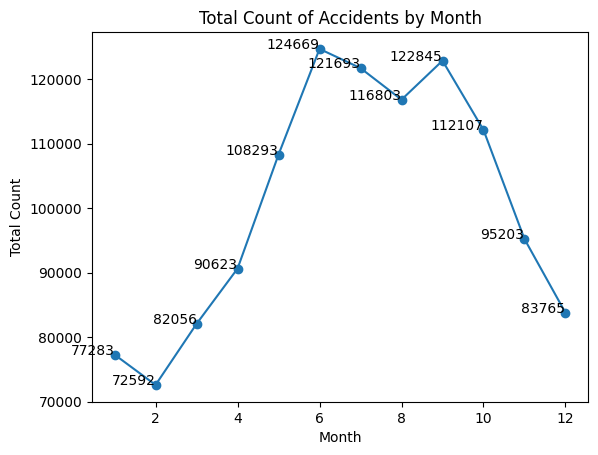

In [15]:
plt.plot(monthly_counts.index, monthly_counts.values, marker='o')
plt.xlabel('Month')
plt.ylabel('Total Count')
plt.title('Total Count of Accidents by Month')

for i, count in enumerate(monthly_counts.values):
    plt.text(monthly_counts.index[i], count, str(count), ha='right')

plt.show()

In [16]:
hourly_counts = accident_data_master['USTUNDE'].value_counts().sort_index()

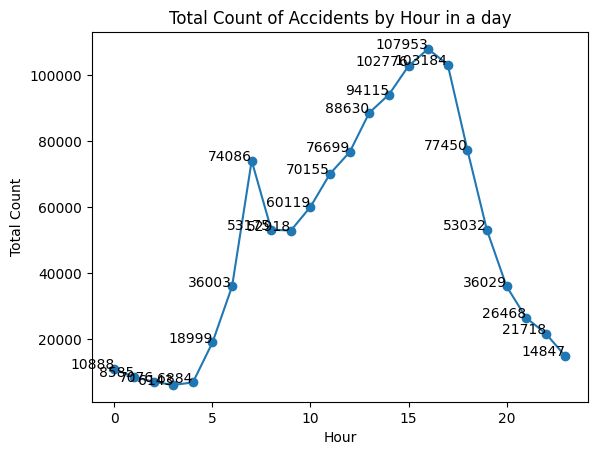

In [17]:
plt.plot(hourly_counts.index, hourly_counts.values, marker='o')
plt.xlabel('Hour')
plt.ylabel('Total Count')
plt.title('Total Count of Accidents by Hour in a day')

for i, count in enumerate(hourly_counts.values):
    plt.text(hourly_counts.index[i], count, str(count), ha='right')

plt.show()

In [18]:
weekday_counts = accident_data_master['UWOCHENTAG'].value_counts().sort_index()

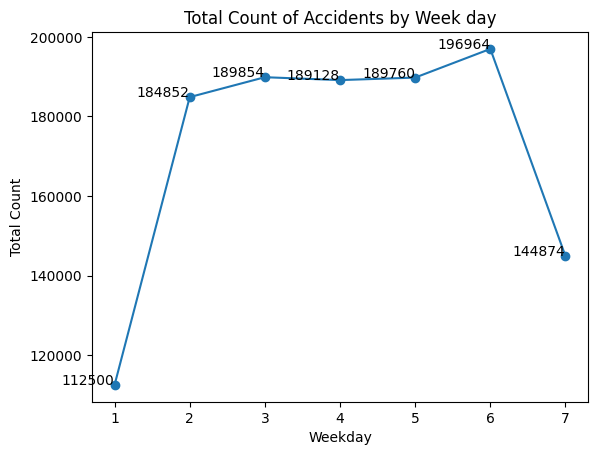

In [19]:
plt.plot(weekday_counts.index, weekday_counts.values, marker='o')
plt.xlabel('Weekday')
plt.ylabel('Total Count')
plt.title('Total Count of Accidents by Week day')

for i, count in enumerate(weekday_counts.values):
    plt.text(weekday_counts.index[i], count, str(count), ha='right')

plt.show()

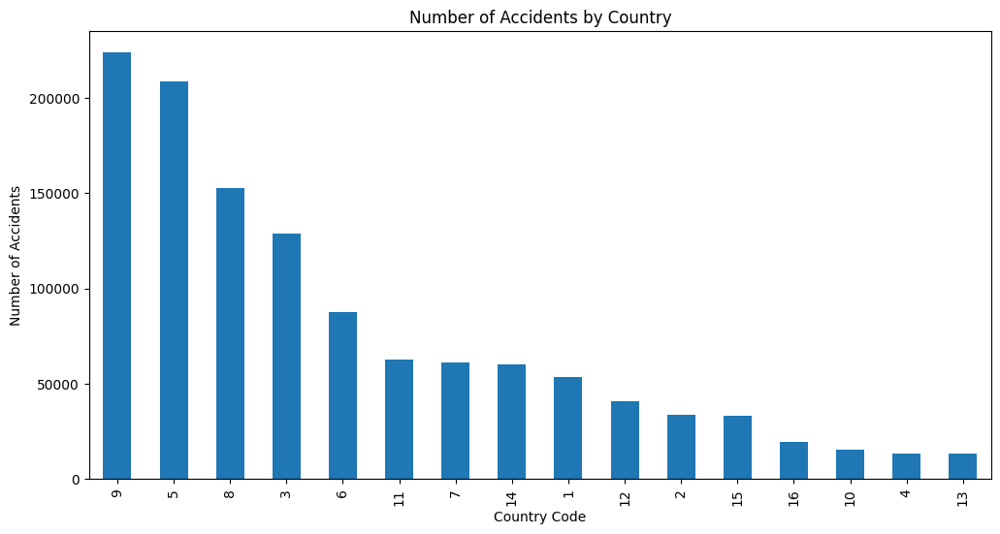

In [20]:
# Assuming accident_data_master is a DataFrame containing the accident data
# Replace 'ULAND' with the actual column name in your DataFrame
country_counts = accident_data_master['ULAND'].value_counts()

# Sort the counts in descending order to identify the countries with the highest accident rates
country_counts_sorted = country_counts.sort_values(ascending=False)

# Plot the bar graph
plt.figure(figsize=(12, 6))
country_counts_sorted.plot(kind='bar')
plt.xlabel('Country Code')
plt.ylabel('Number of Accidents')
plt.title('Number of Accidents by Country')
plt.show()

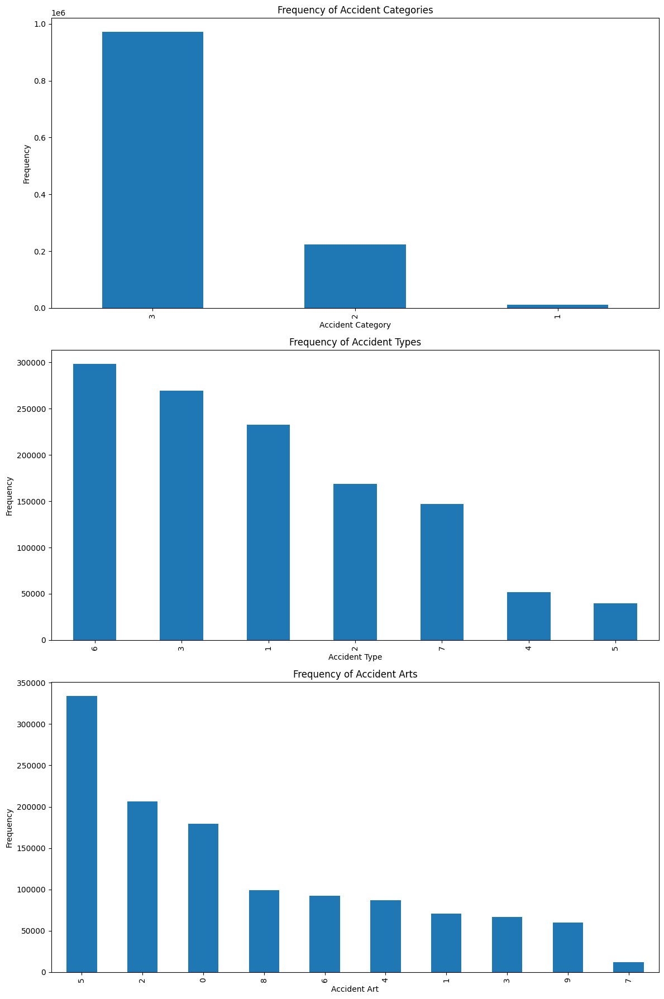

In [21]:
# Assuming accident_data_master is a DataFrame containing the accident data
# Replace 'UKATEGORIE', 'UART', 'UTYP1' with the actual column names in your DataFrame
accident_category_counts = accident_data_master['UKATEGORIE'].value_counts()
accident_type_counts = accident_data_master['UTYP1'].value_counts()
accident_art_counts = accident_data_master['UART'].value_counts()

# Plot the bar graphs
fig, axes = plt.subplots(3, 1, figsize=(12, 18))

accident_category_counts.plot(kind='bar', ax=axes[0])
axes[0].set_title('Frequency of Accident Categories')
axes[0].set_xlabel('Accident Category')
axes[0].set_ylabel('Frequency')

accident_type_counts.plot(kind='bar', ax=axes[1])
axes[1].set_title('Frequency of Accident Types')
axes[1].set_xlabel('Accident Type')
axes[1].set_ylabel('Frequency')

accident_art_counts.plot(kind='bar', ax=axes[2])
axes[2].set_title('Frequency of Accident Arts')
axes[2].set_xlabel('Accident Art')
axes[2].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

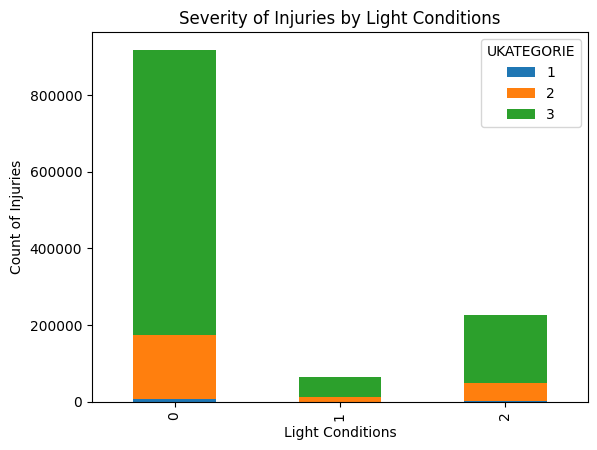

In [22]:
# Assuming accident_data_master is a DataFrame containing the accident data
# Replace 'LICHT' and 'USTUNDE' with the actual column names in your DataFrame
# Replace 'USCHWER' with the column representing severity of injuries

severity_light_cross_tab = pd.crosstab(accident_data_master['ULICHTVERH'], accident_data_master['UKATEGORIE'])
severity_light_cross_tab.plot(kind='bar', stacked=True)
plt.title('Severity of Injuries by Light Conditions')
plt.xlabel('Light Conditions')
plt.ylabel('Count of Injuries')
plt.show()

Time Series Forecasting

In [23]:
# Assuming accident_data_master is a DataFrame containing the accident data
# Replace 'UJAHR', 'UMONAT', and 'USTUNDE' with the actual column names in your DataFrame
accident_data_master['datetime'] = pd.to_datetime(accident_data_master['UJAHR'].astype(str) + '-' + accident_data_master['UMONAT'].astype(str), format='%Y-%m')

# Now the 'datetime' column contains the combined date and time information

In [24]:
accident_data_master['datetime']

0        2018-01-01
1        2018-01-01
2        2018-01-01
3        2018-01-01
4        2018-01-01
            ...    
256487   2022-10-01
256488   2022-12-01
256489   2022-11-01
256490   2022-11-01
256491   2022-09-01
Name: datetime, Length: 1207932, dtype: datetime64[ns]

In [25]:
accident_data_master.columns

Index(['ULAND', 'UREGBEZ', 'UKREIS', 'UGEMEINDE', 'UJAHR', 'UMONAT', 'USTUNDE',
       'UWOCHENTAG', 'UKATEGORIE', 'UART', 'UTYP1', 'ULICHTVERH',
       'USTRZUSTAND', 'IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstGkfz',
       'IstSonstige', 'X-Axis', 'Y-Axis', 'Year', 'datetime'],
      dtype='object')

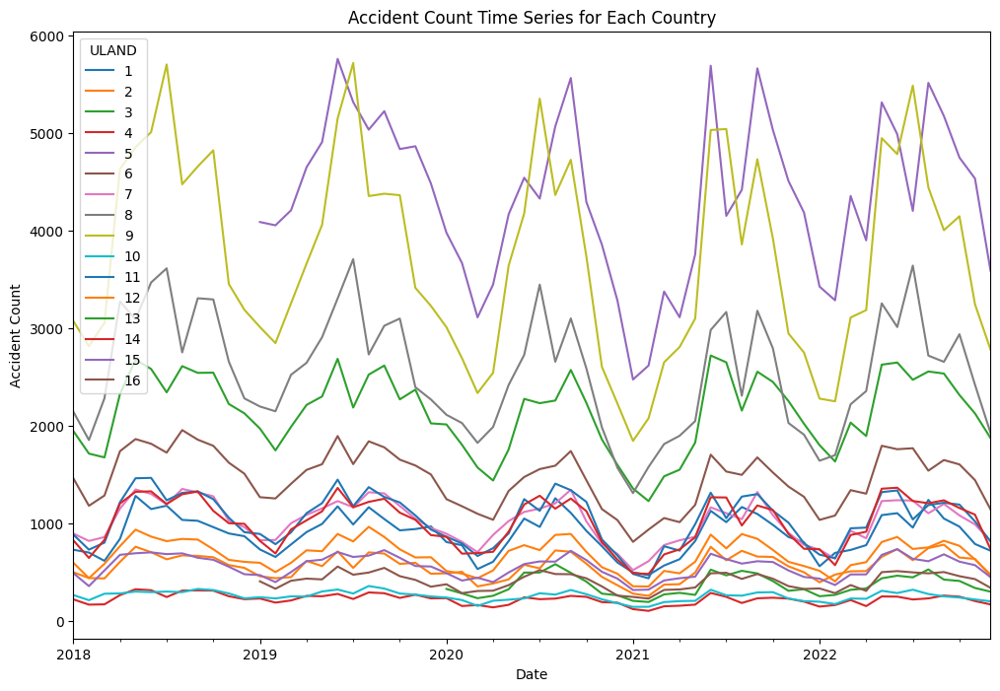

In [26]:
import matplotlib.pyplot as plt

# Assuming accident_data_master is a DataFrame containing the accident data
# Replace 'ULAND' with the actual column name in your DataFrame
accident_counts = accident_data_master.groupby(['datetime', 'ULAND']).size().unstack()

# Plot the time series for each country
accident_counts.plot(figsize=(12, 8))
plt.xlabel('Date')
plt.ylabel('Accident Count')
plt.title('Accident Count Time Series for Each Country')
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


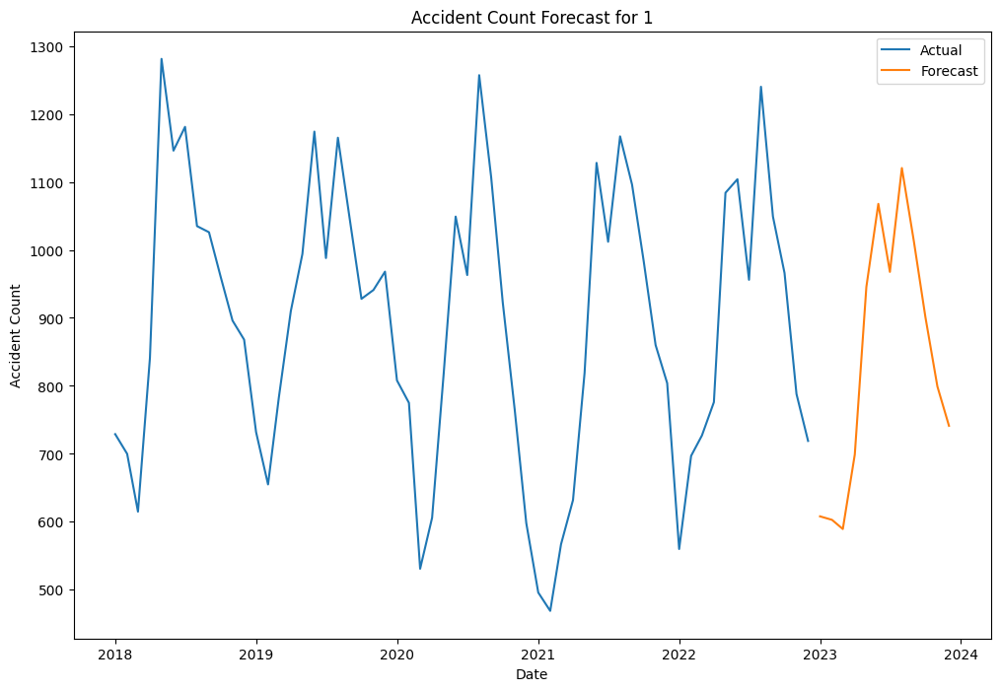

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


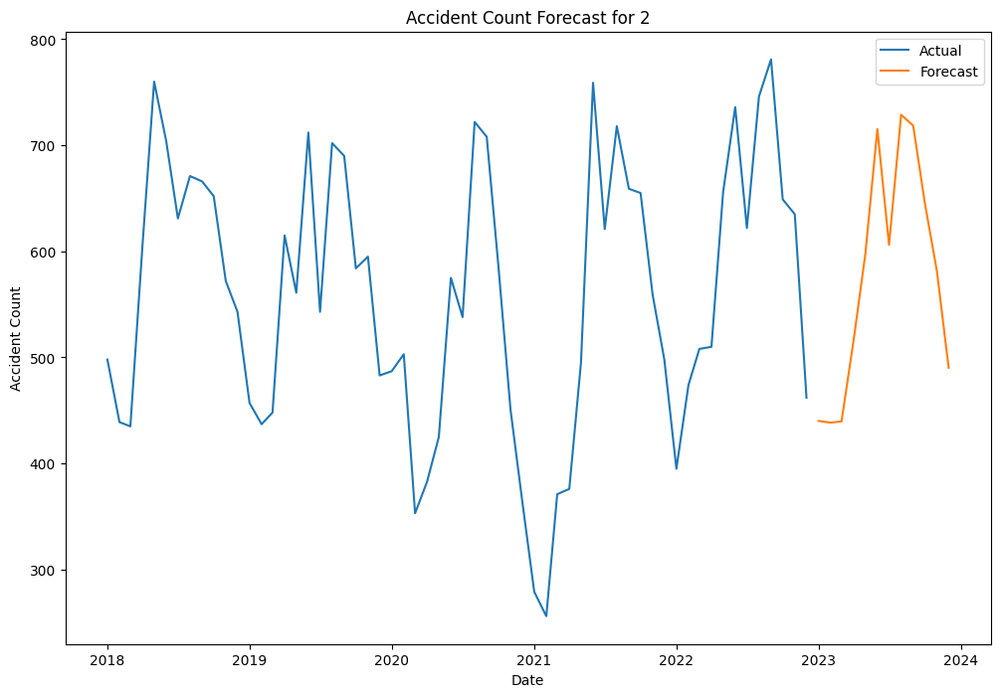

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


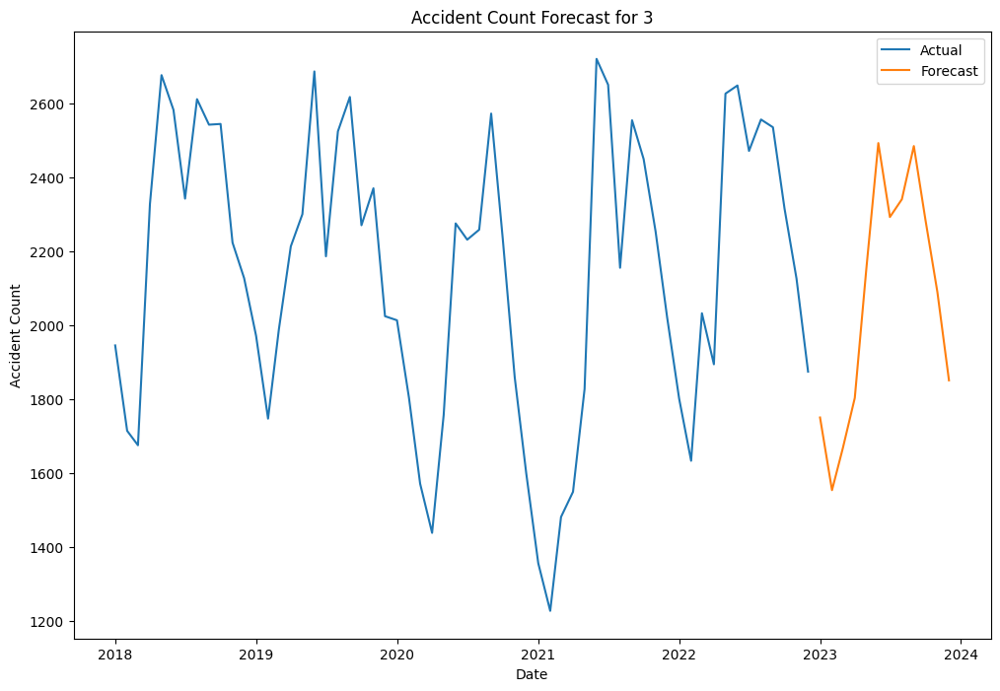

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


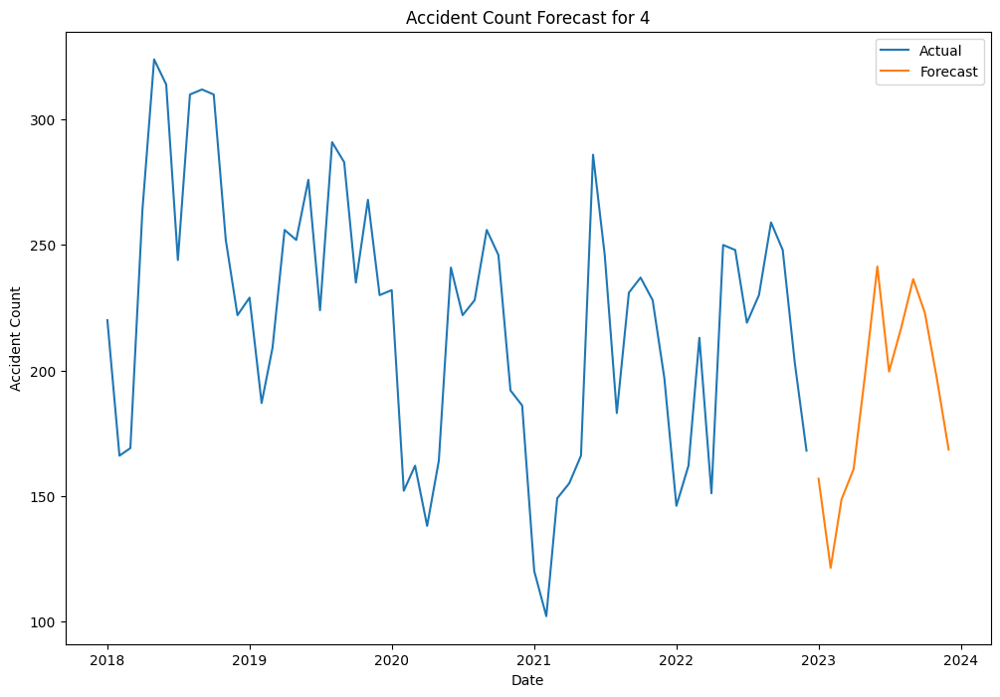

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


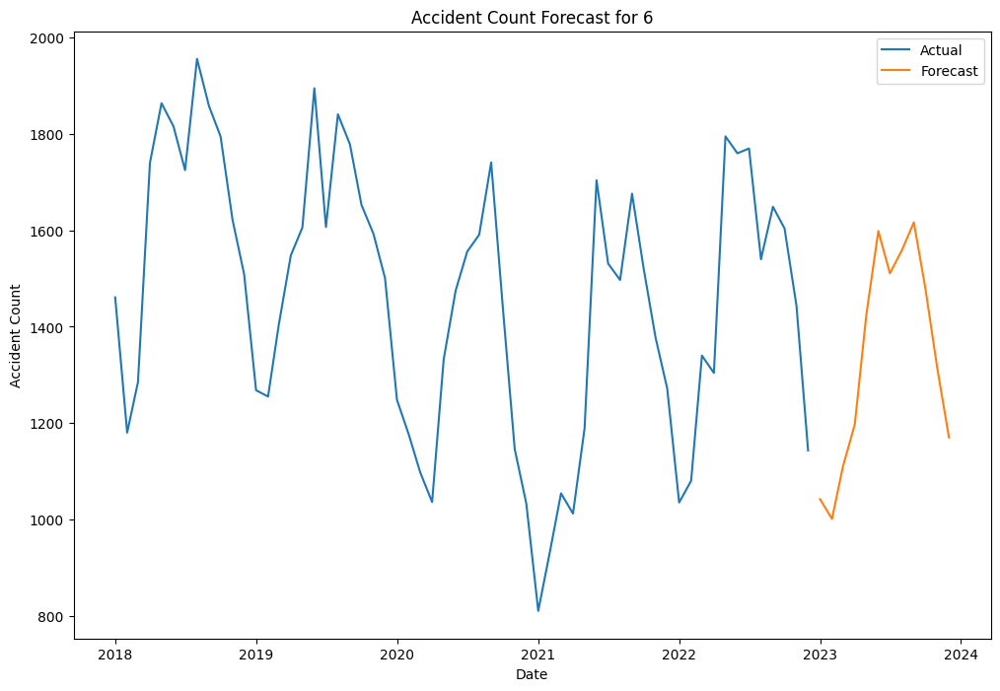

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


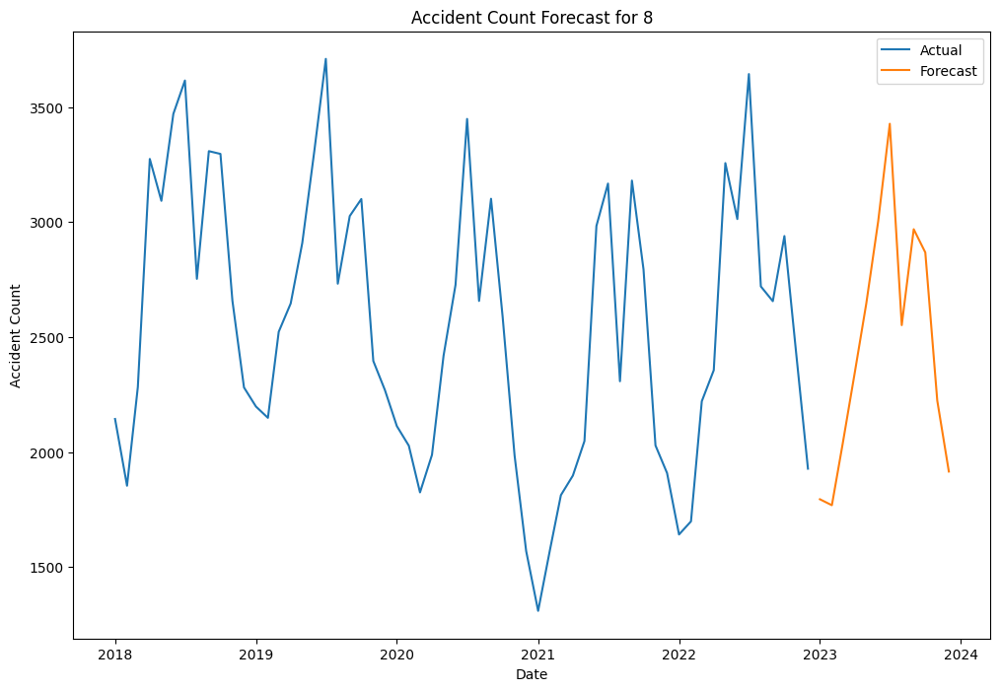

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


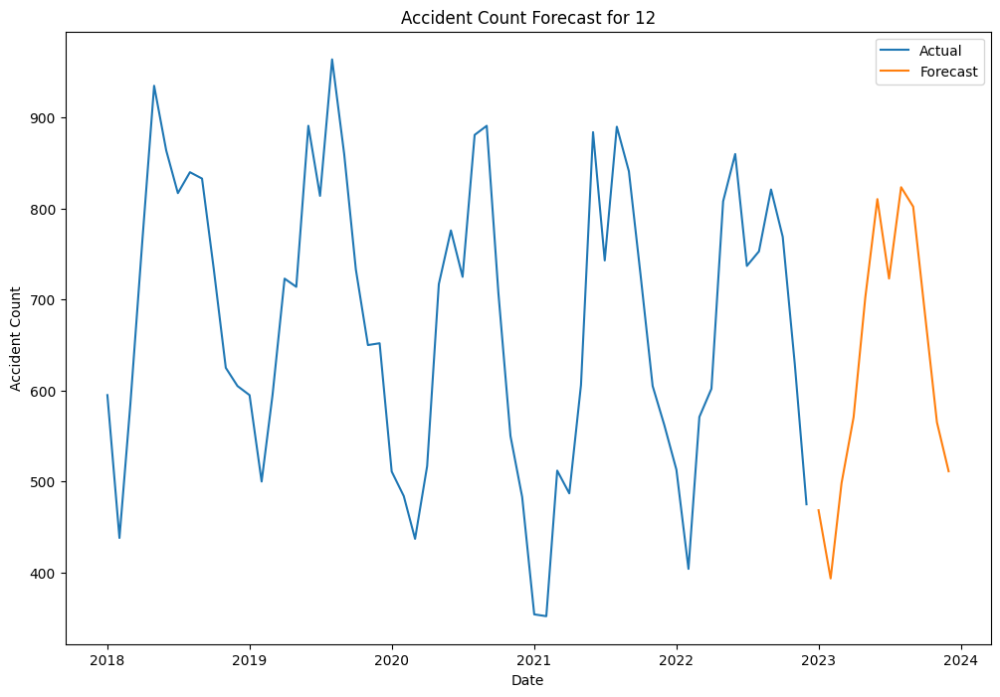

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


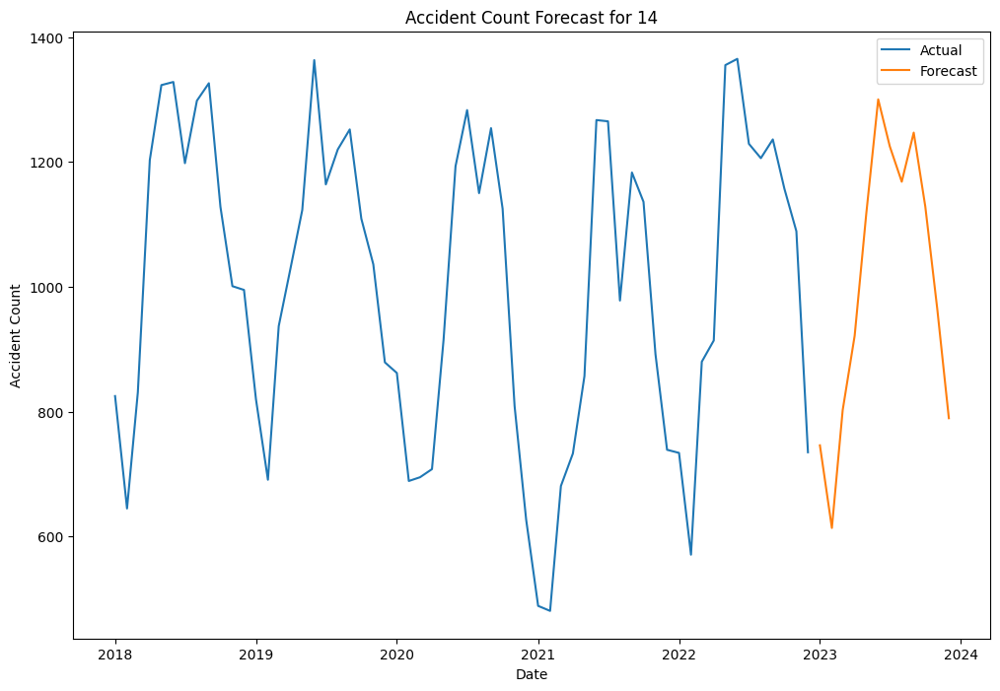

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


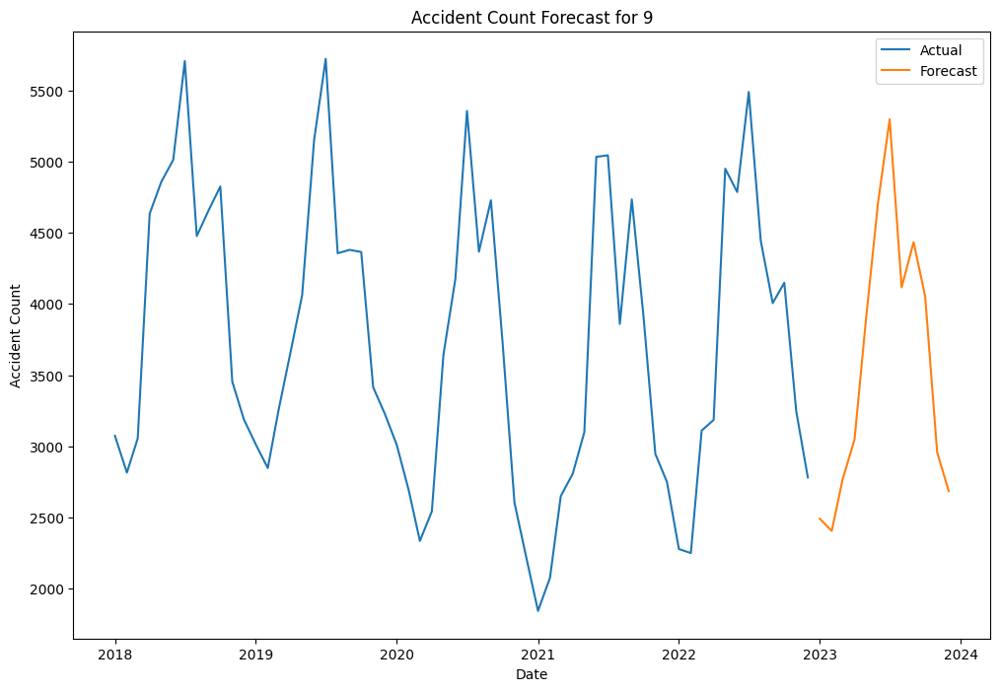

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


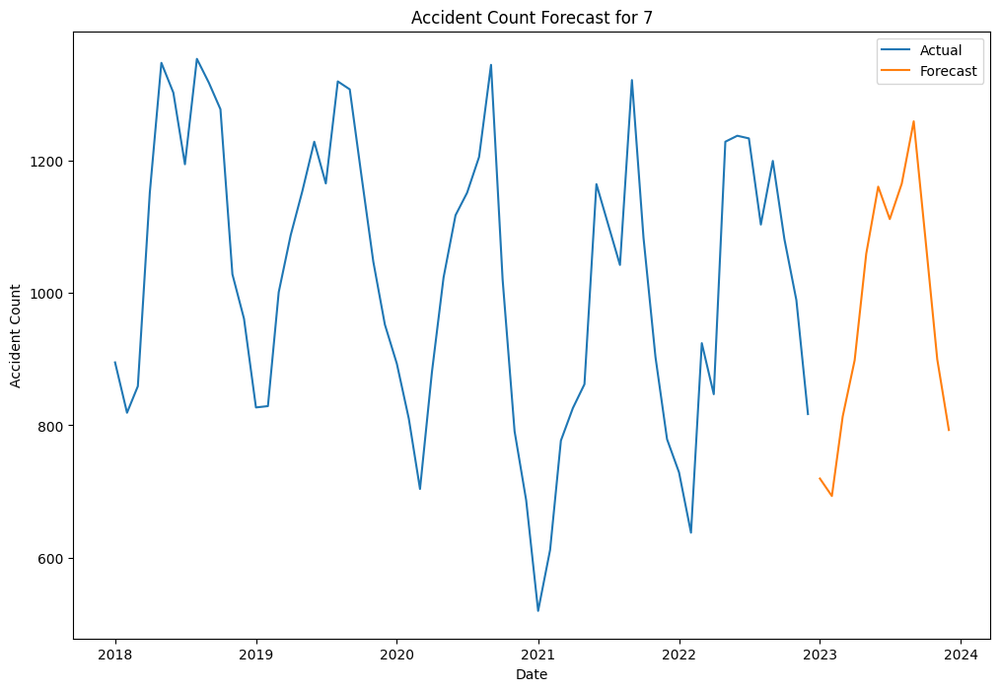

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


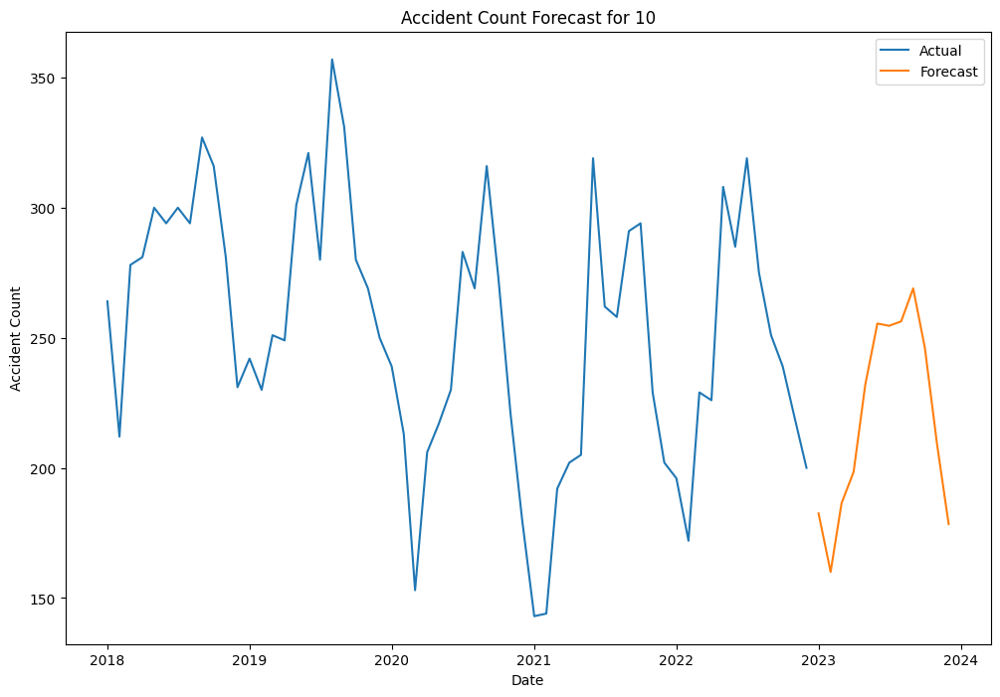

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


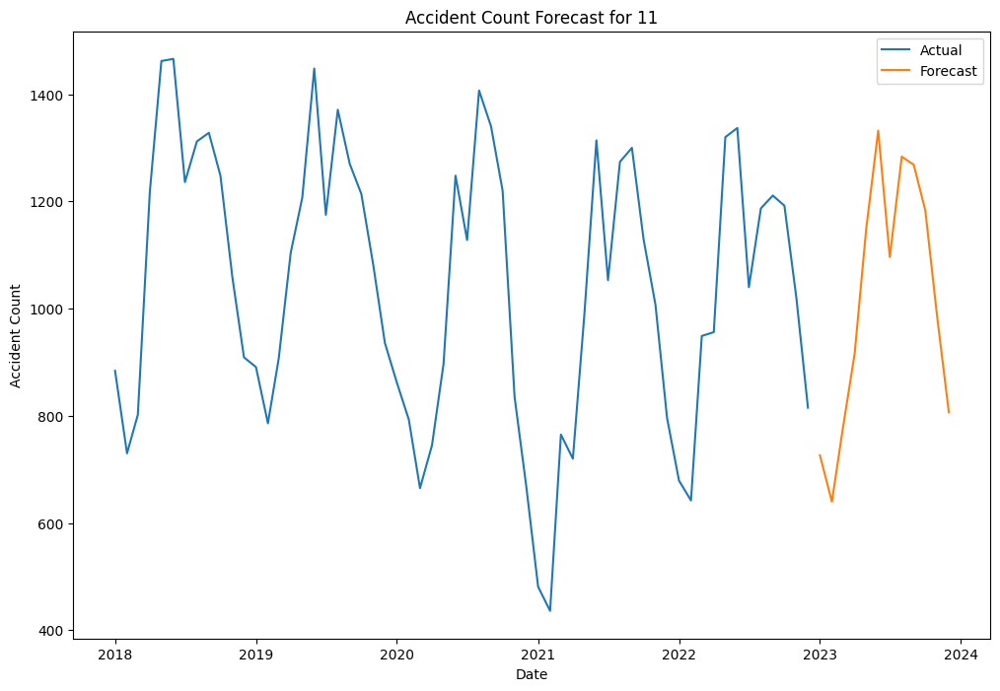

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


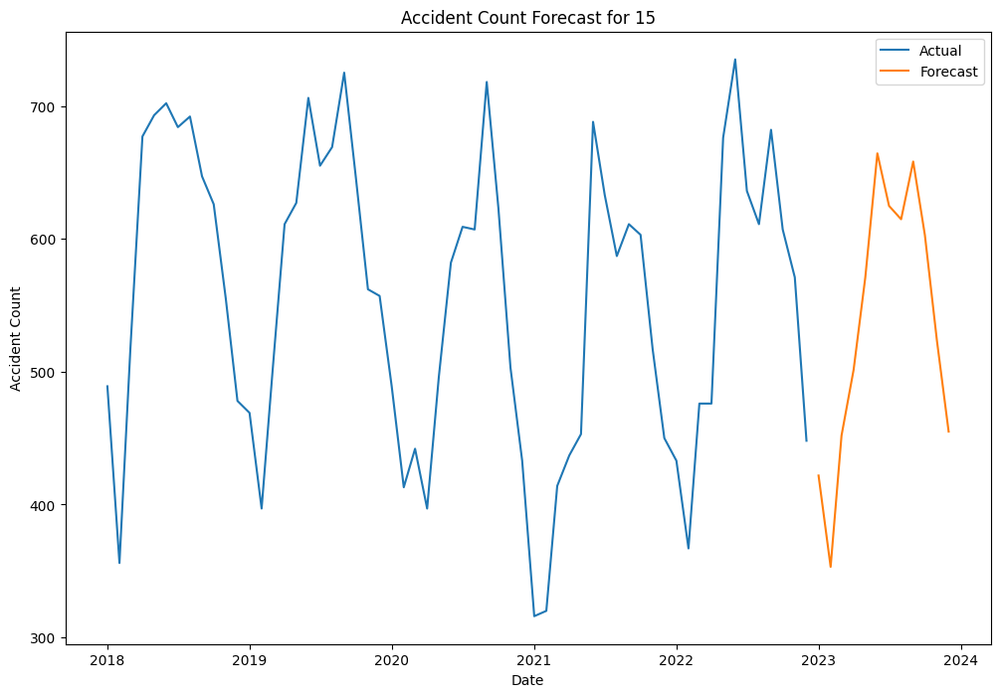

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


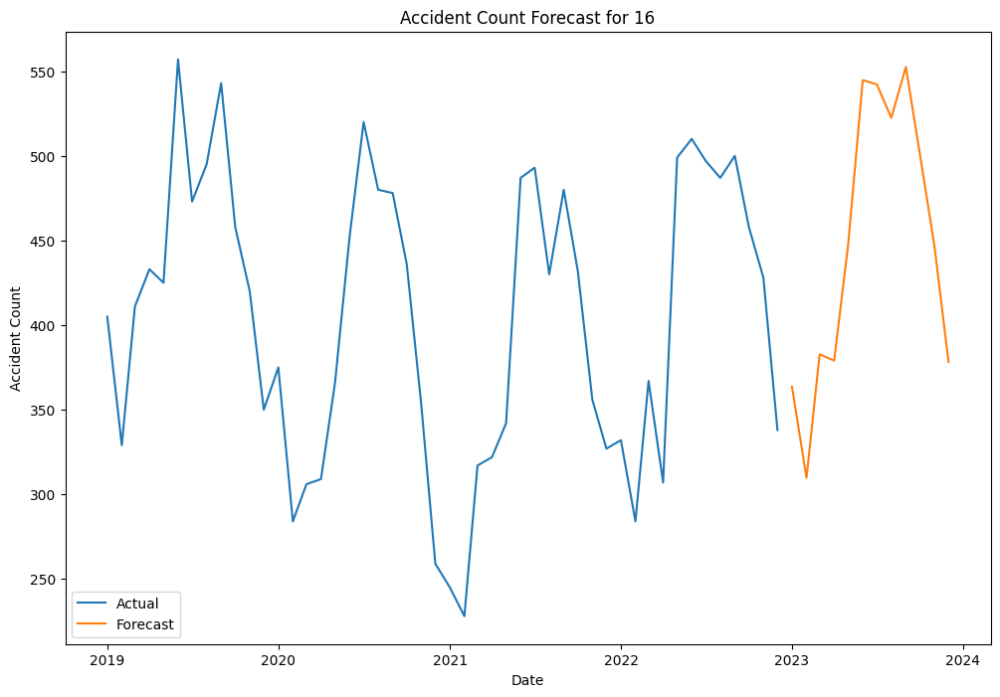

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


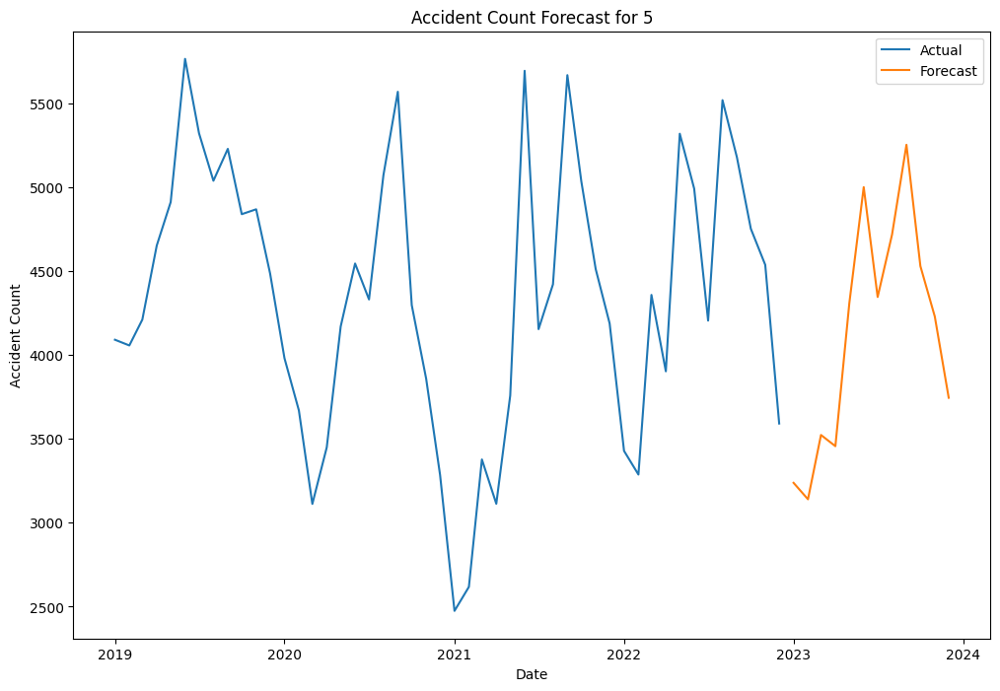

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


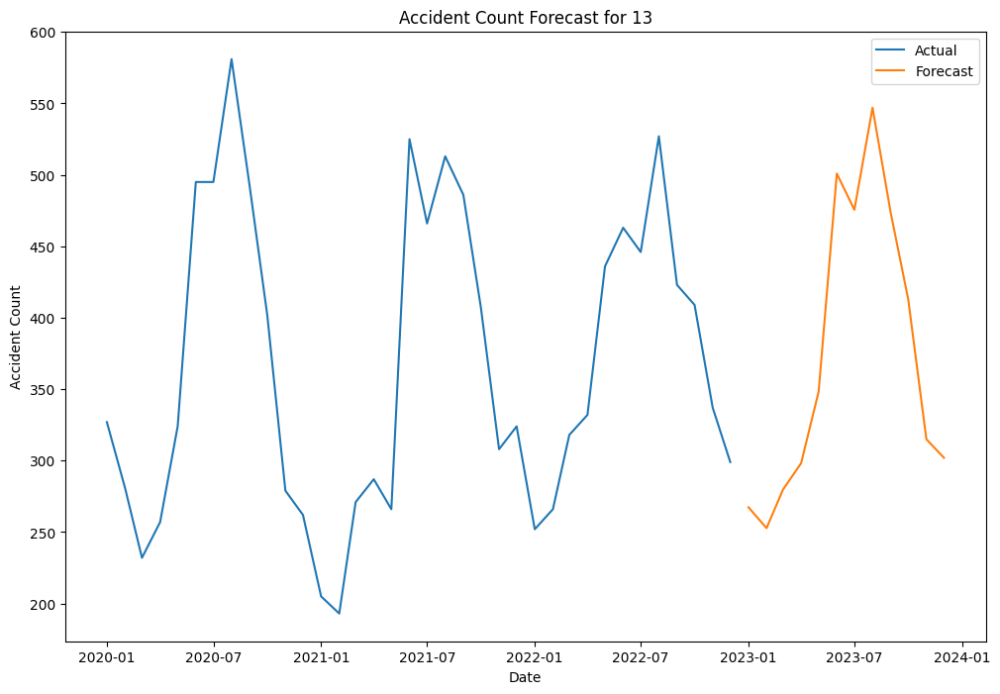

In [27]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Assuming accident_data_master is a DataFrame containing the accident data
# Replace 'ULAND' with the actual column name in your DataFrame
unique_countries = accident_data_master['ULAND'].unique()

for country in unique_countries:
    country_data = accident_data_master[accident_data_master['ULAND'] == country]
    country_data = country_data.groupby('datetime').size().reset_index()
    country_data.columns = ['datetime', 'accident_count']
    country_data = country_data.set_index('datetime')

    # Fit the Exponential Smoothing model
    model = ExponentialSmoothing(country_data, trend='add', seasonal='add', seasonal_periods=12)
    model_fit = model.fit()

    # Make predictions
    forecast = model_fit.forecast(steps=12)

    # Plot the actual data and the forecast
    plt.figure(figsize=(12, 8))
    plt.plot(country_data, label='Actual')
    plt.plot(forecast, label='Forecast')
    plt.xlabel('Date')
    plt.ylabel('Accident Count')
    plt.title(f'Accident Count Forecast for {country}')
    plt.legend()
    plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


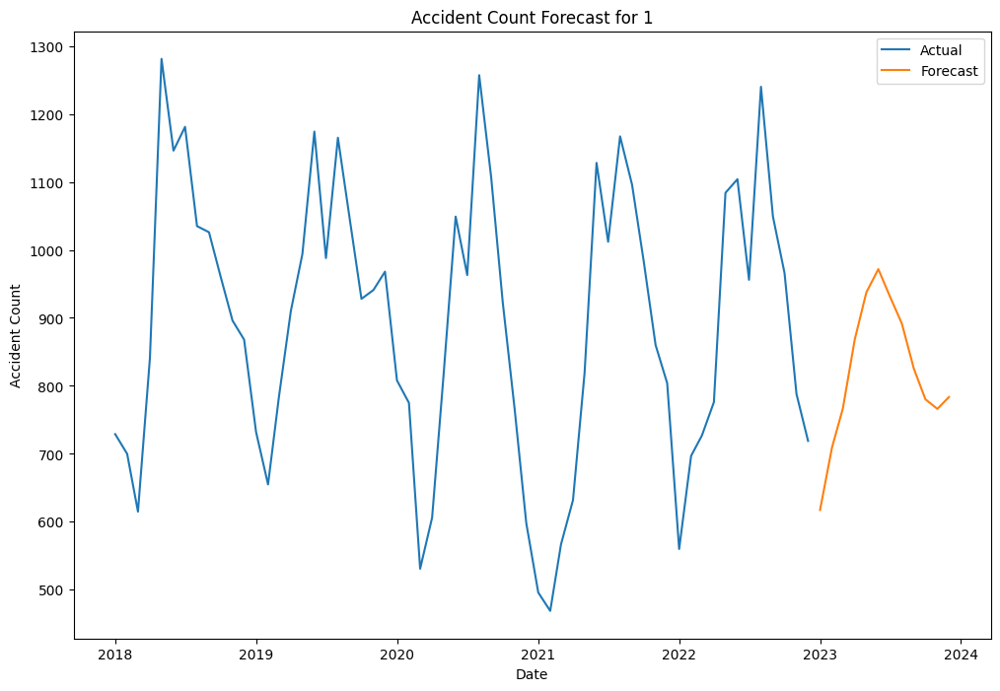

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


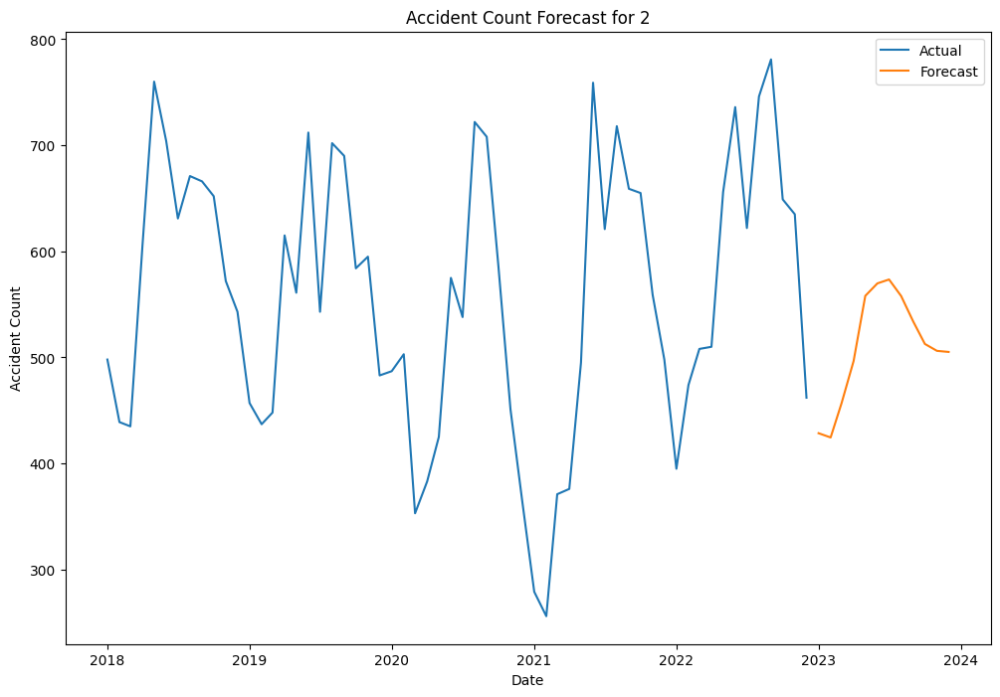

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


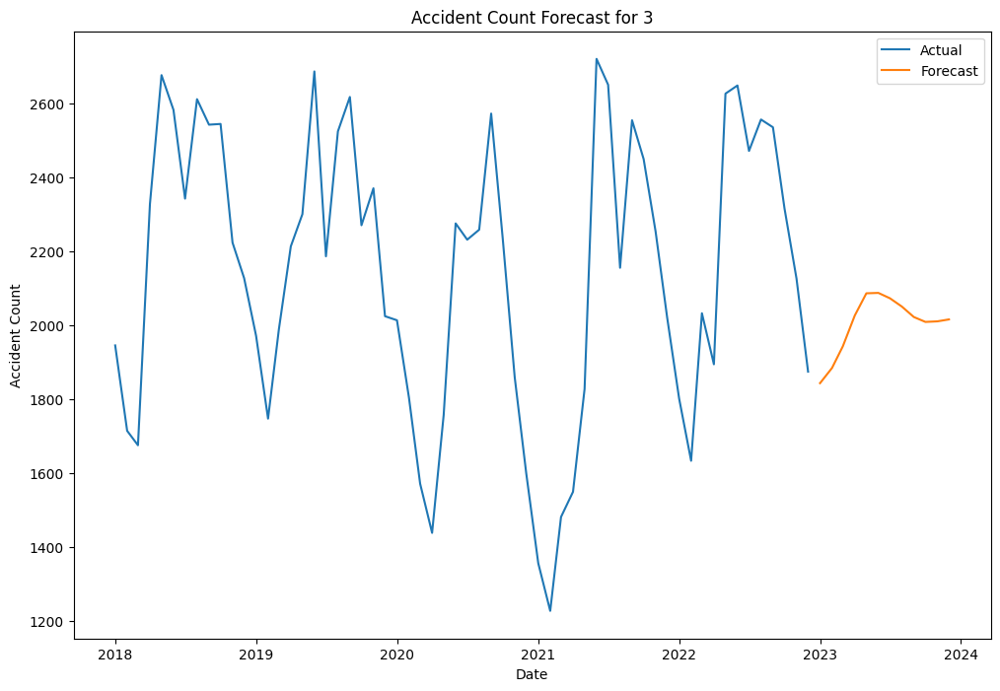

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


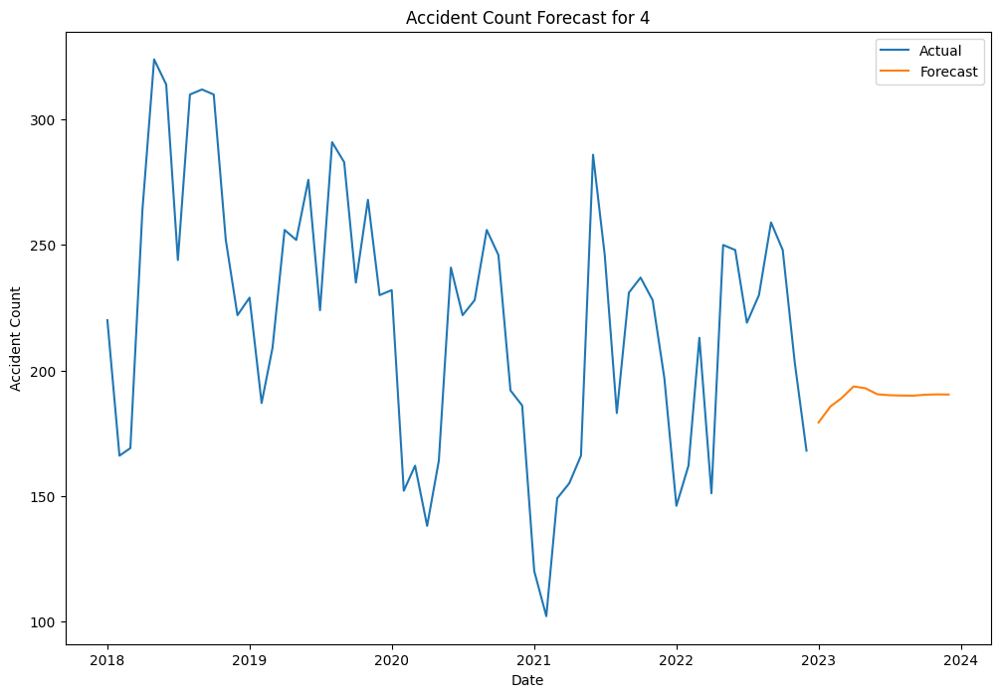

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


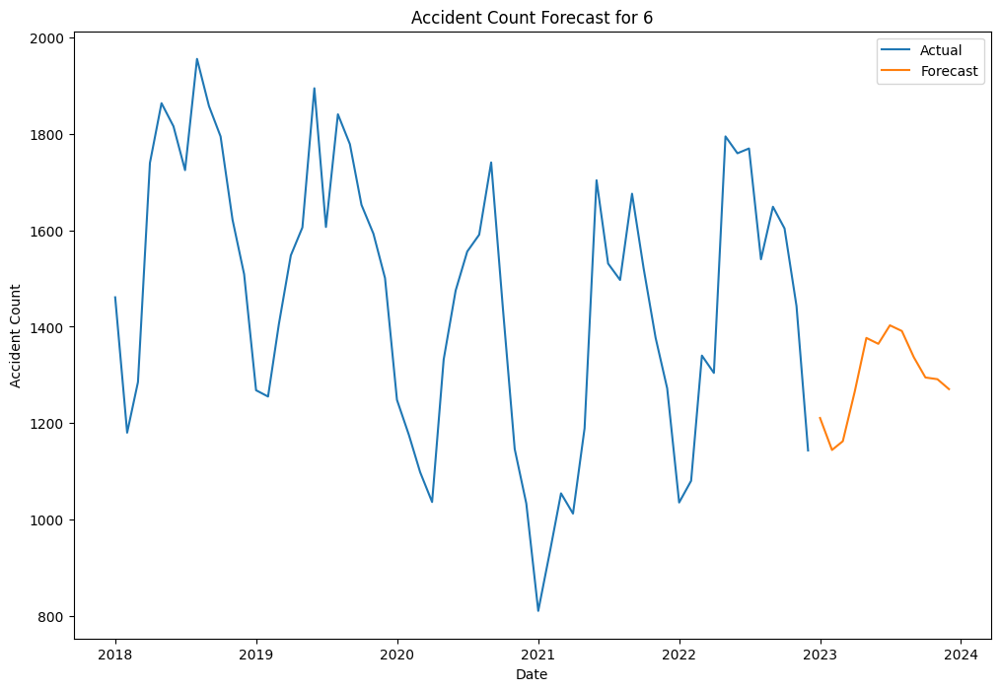

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


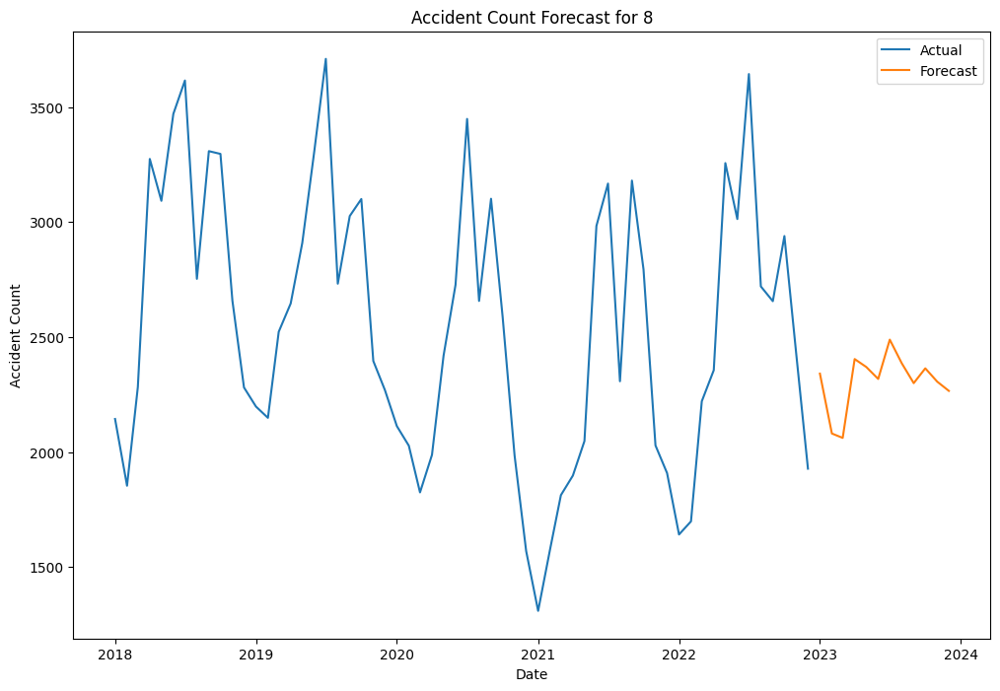

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


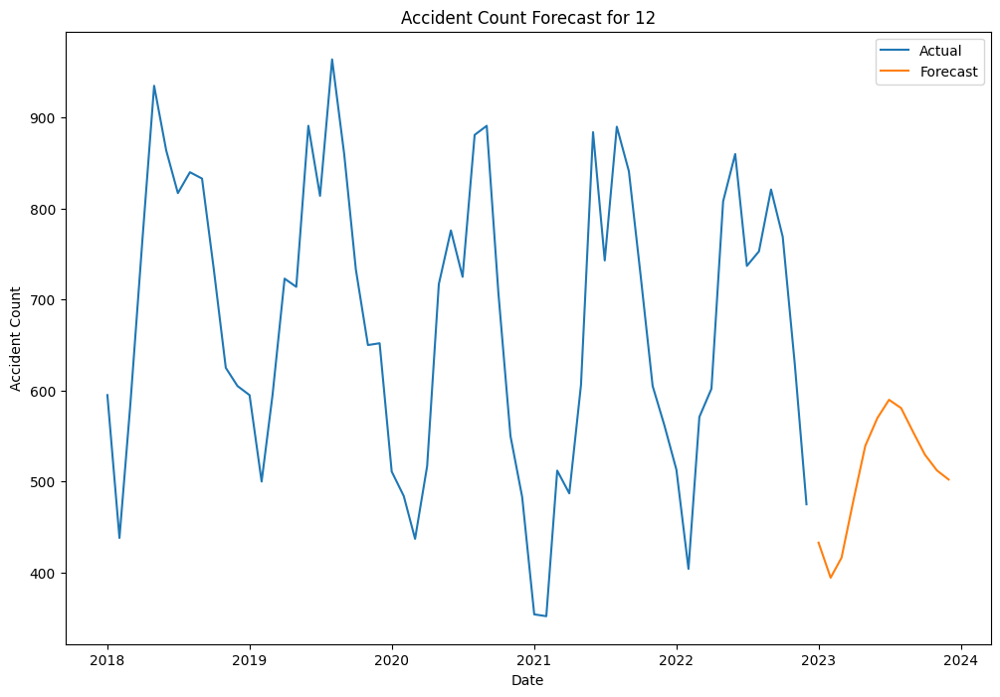

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


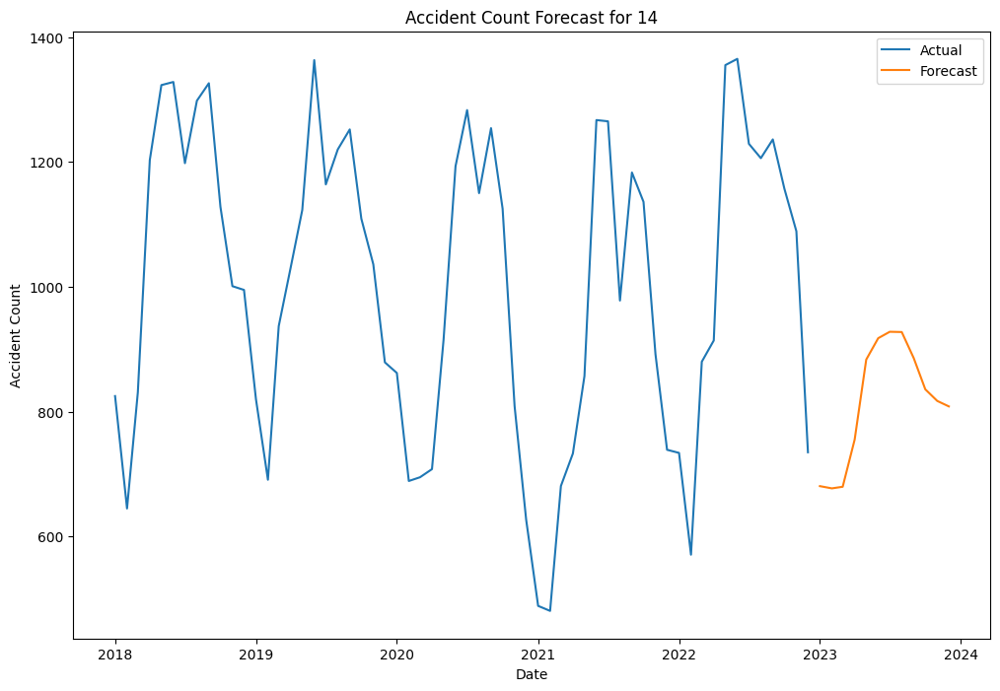

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


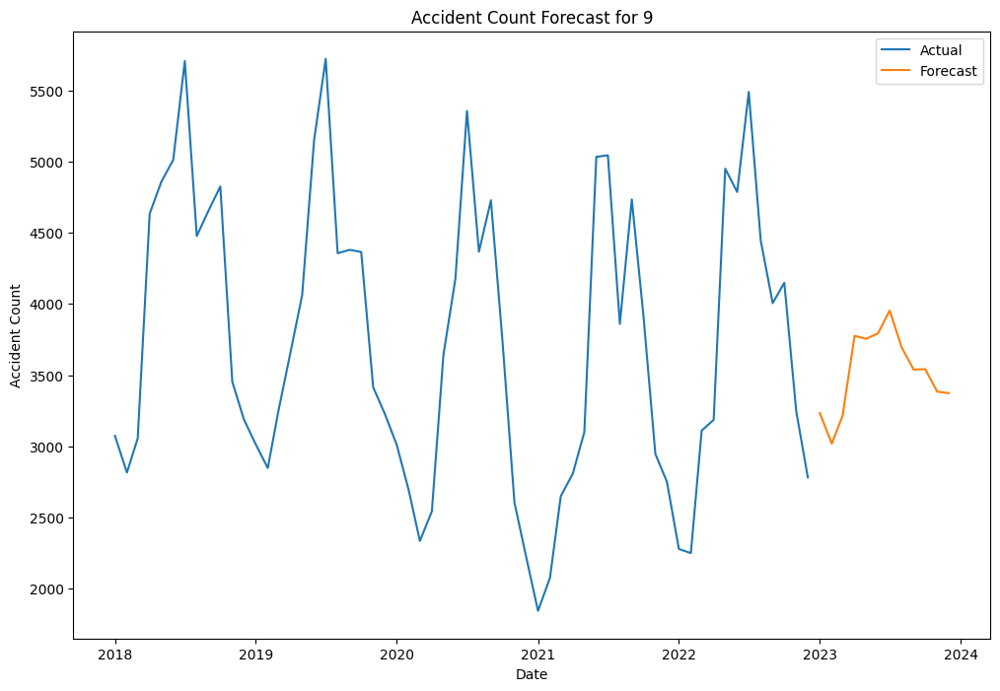

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


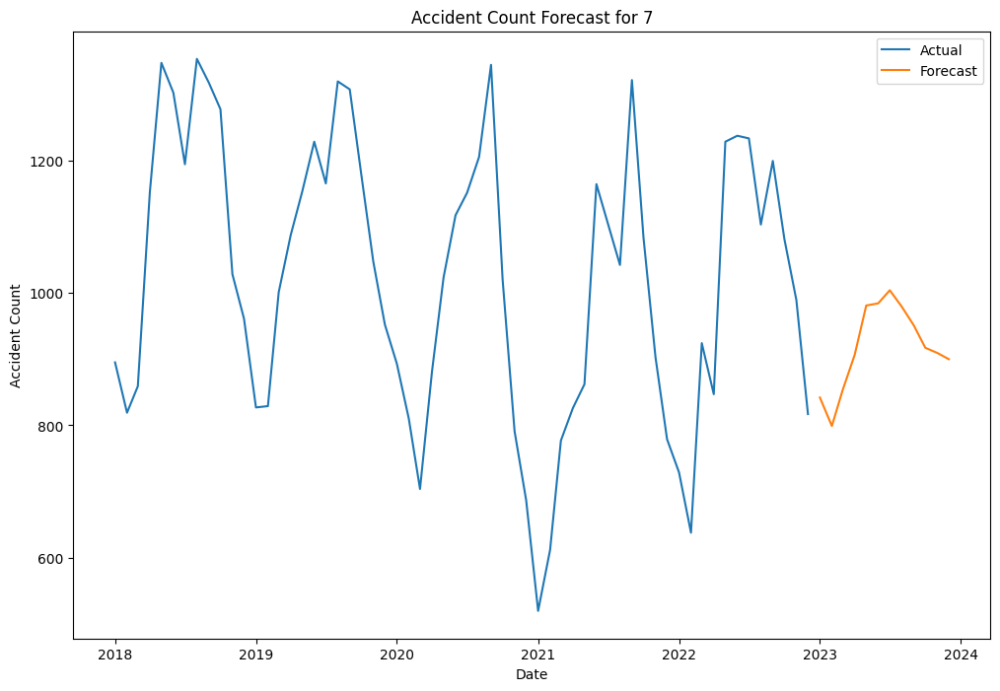

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


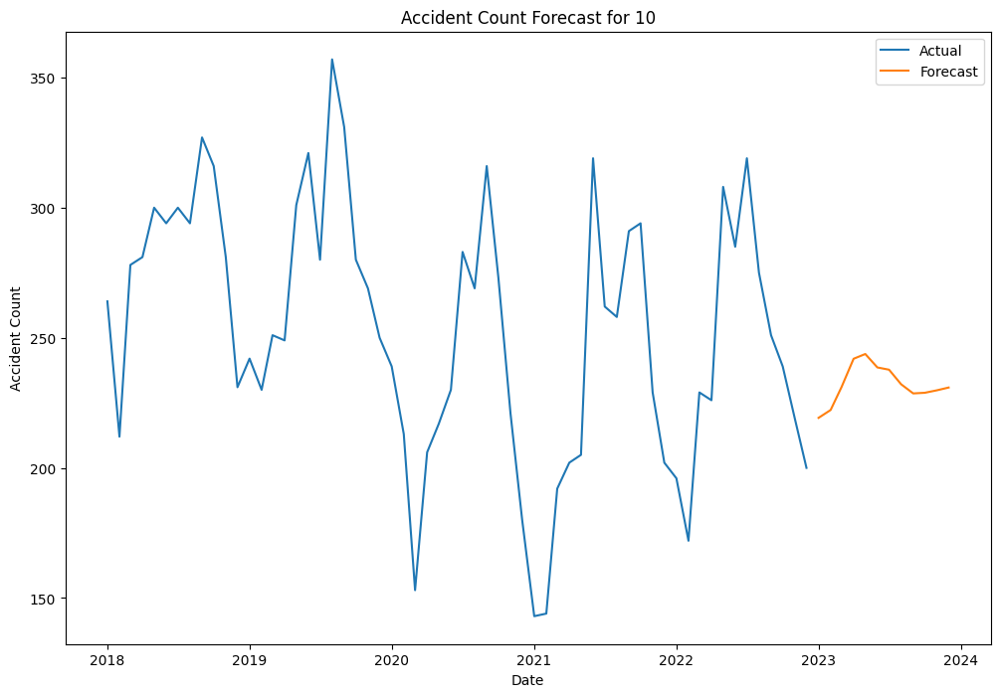

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


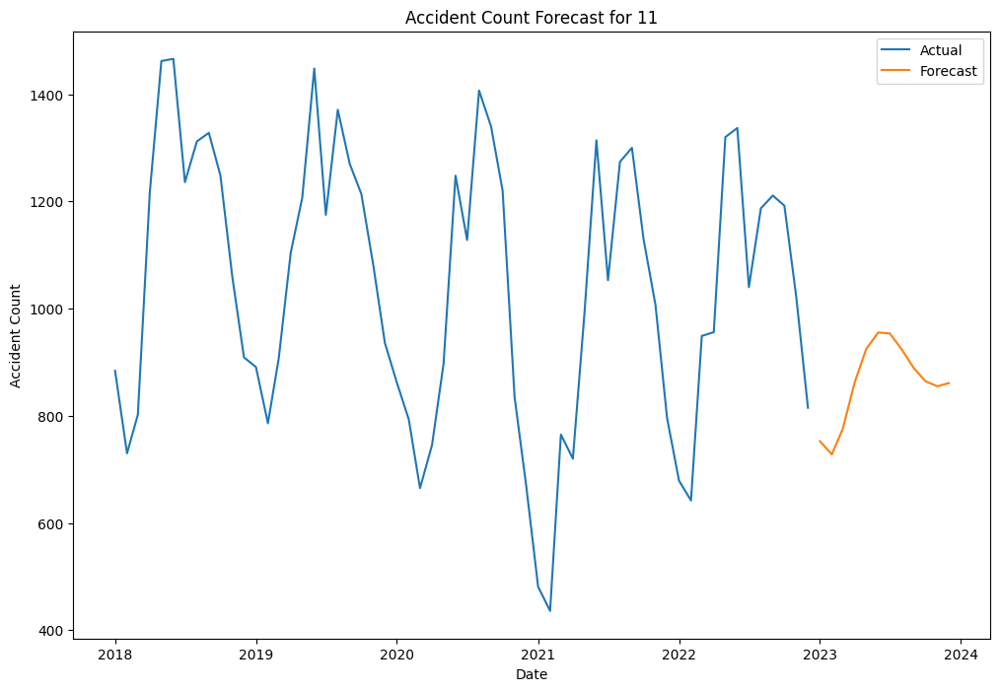

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


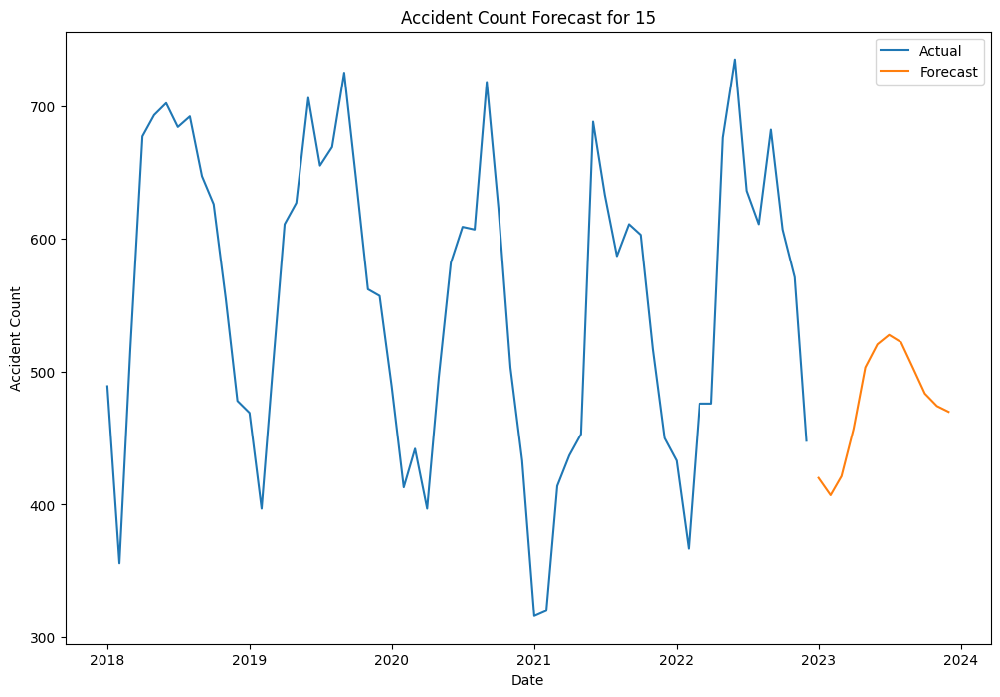

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


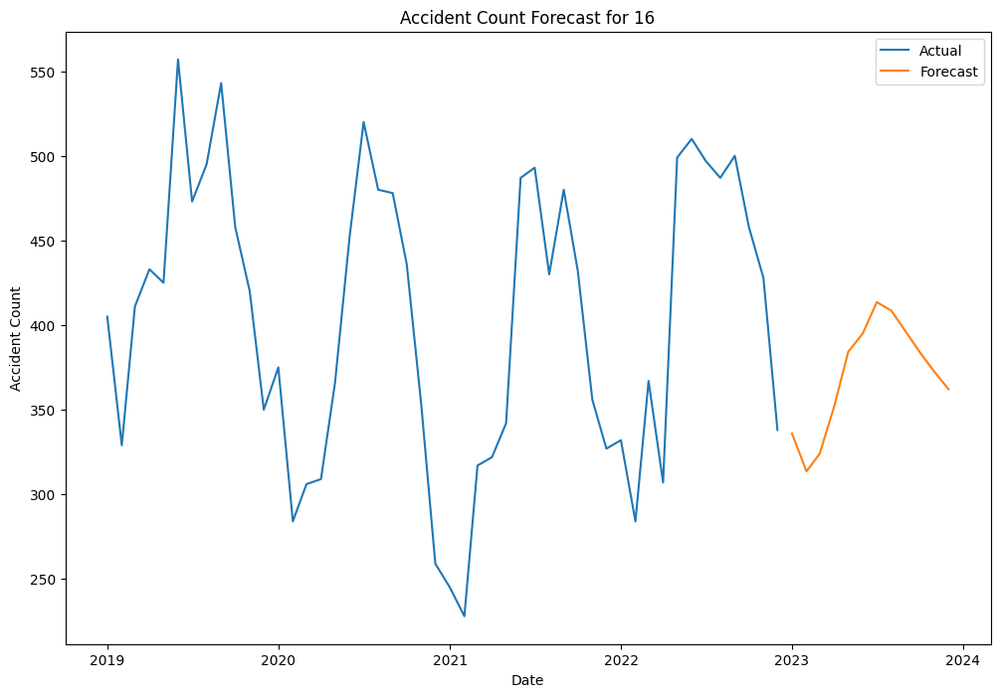

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


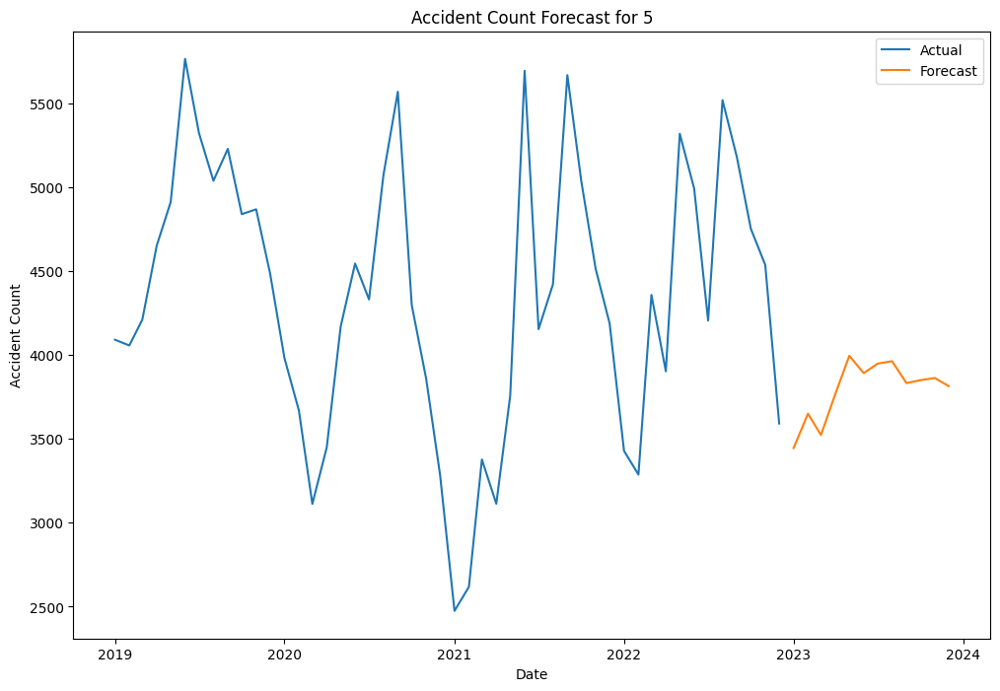

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


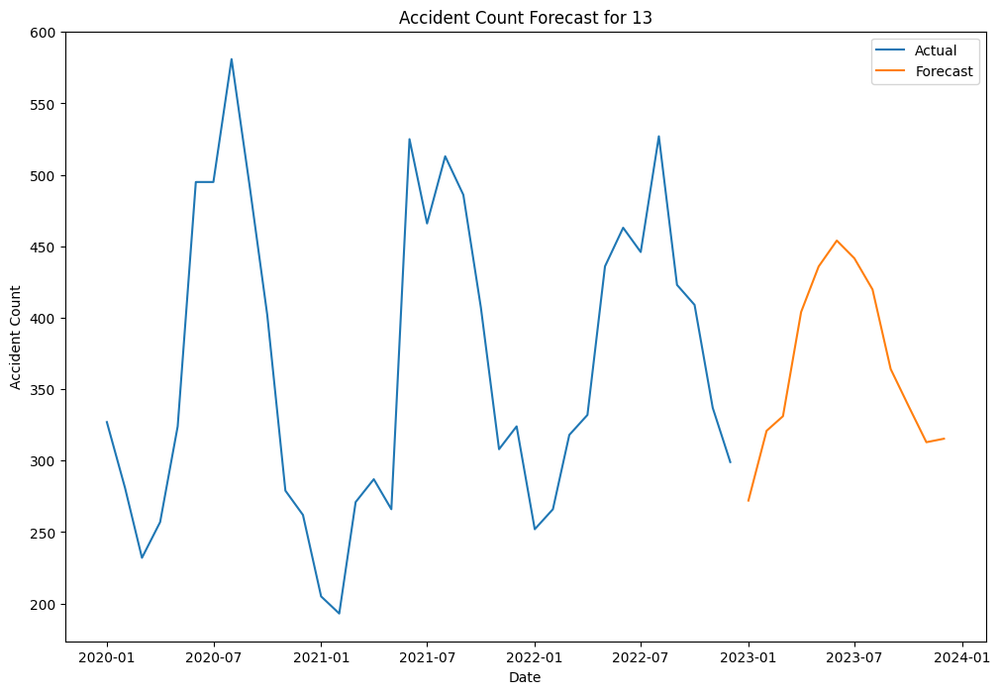

In [28]:
from statsmodels.tsa.arima.model import ARIMA

# Assuming accident_data_master is a DataFrame containing the accident data
# Replace 'ULAND' with the actual column name in your DataFrame
unique_countries = accident_data_master['ULAND'].unique()

for country in unique_countries:
    country_data = accident_data_master[accident_data_master['ULAND'] == country]
    country_data = country_data.groupby('datetime').size().reset_index()
    country_data.columns = ['datetime', 'accident_count']
    country_data = country_data.set_index('datetime')

    # Fit the ARIMA model
    model = ARIMA(country_data, order=(5,1,0))  # Example order, you may need to tune these parameters
    model_fit = model.fit()

    # Make predictions
    forecast = model_fit.forecast(steps=12)

    # Plot the actual data and the forecast
    plt.figure(figsize=(12, 8))
    plt.plot(country_data, label='Actual')
    plt.plot(forecast, label='Forecast')
    plt.xlabel('Date')
    plt.ylabel('Accident Count')
    plt.title(f'Accident Count Forecast for {country}')
    plt.legend()
    plt.show()

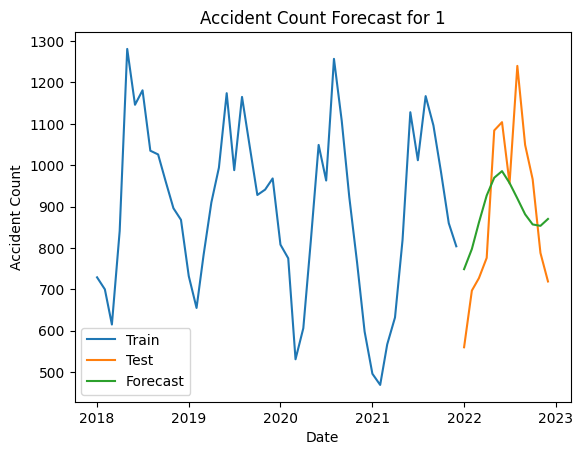

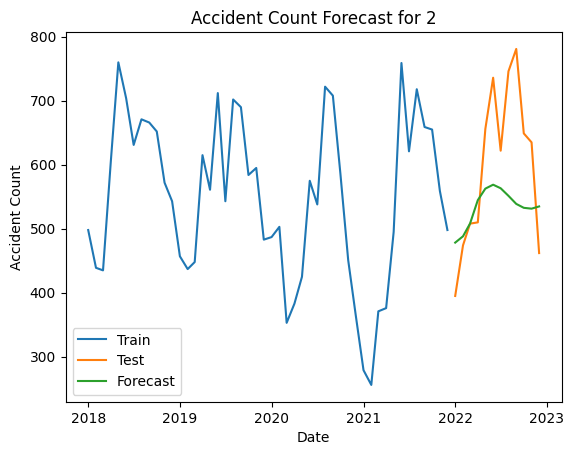

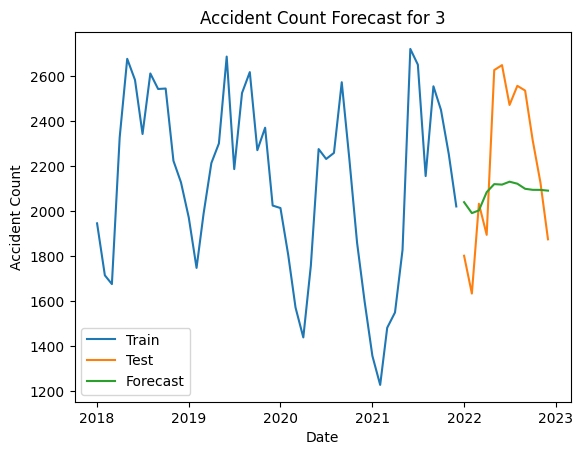

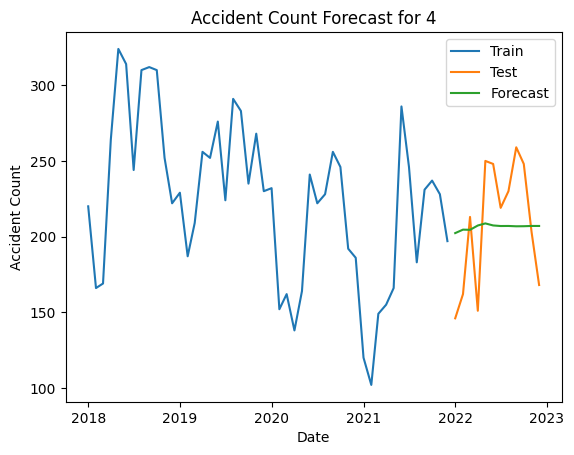

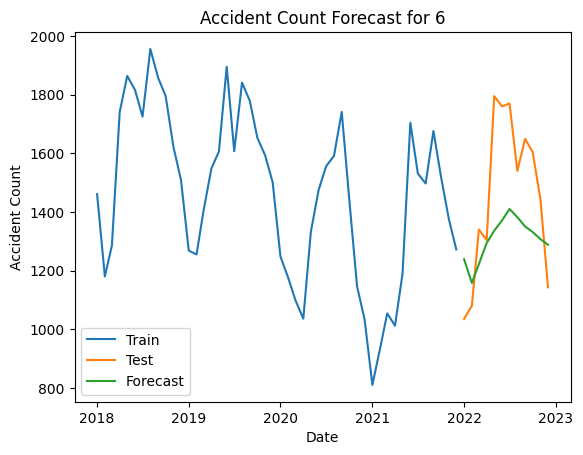

...

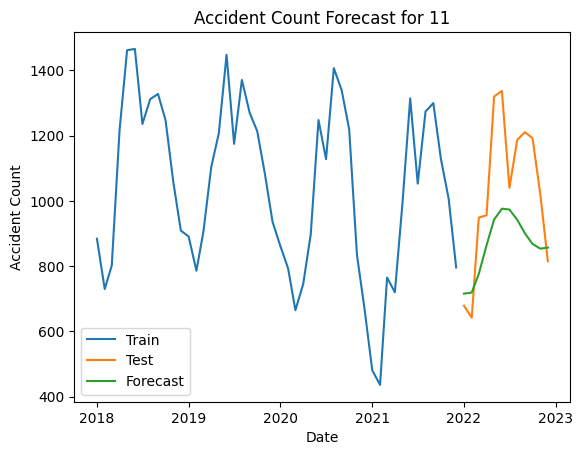

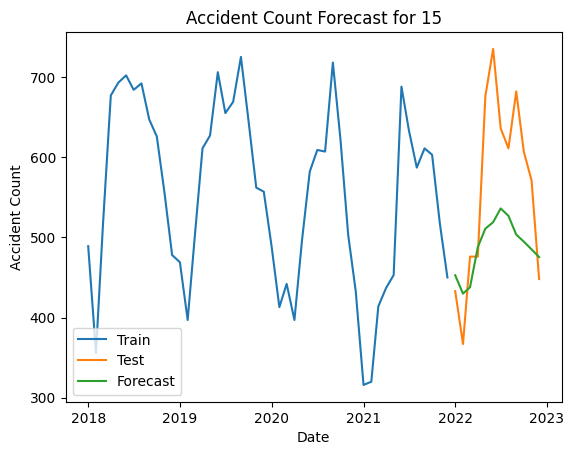

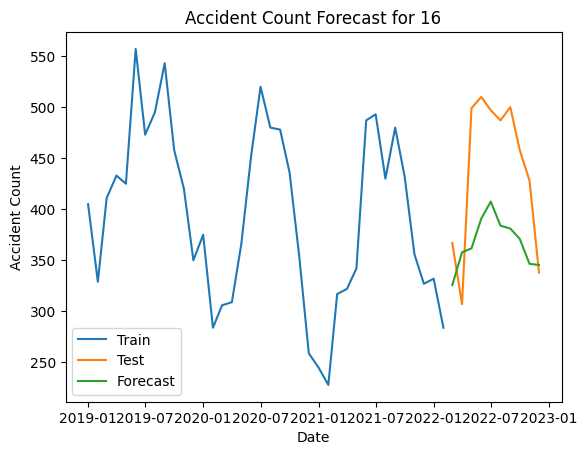

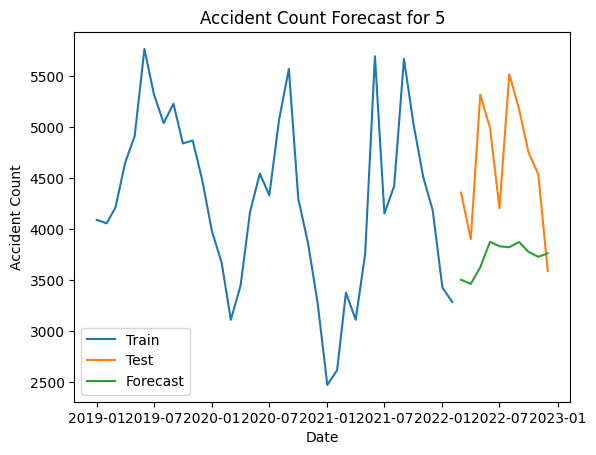

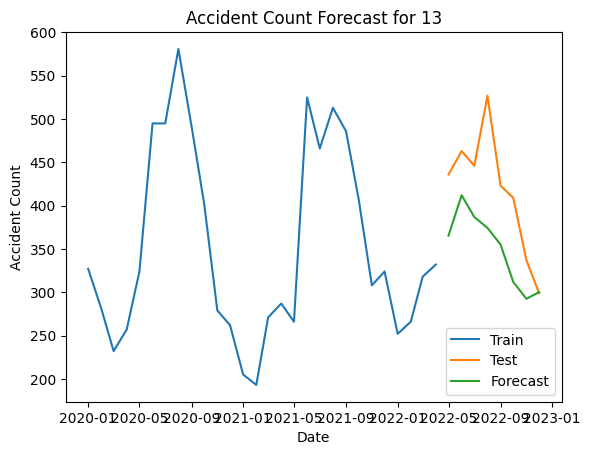

In [29]:
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import TimeSeriesSplit

# Assuming accident_data_master is a DataFrame containing the accident data
# Replace 'ULAND' with the actual column name in your DataFrame
unique_countries = accident_data_master['ULAND'].unique()

for country in unique_countries:
    country_data = accident_data_master[accident_data_master['ULAND'] == country]
    country_data = country_data.groupby('datetime').size().reset_index()
    country_data.columns = ['ds', 'y']  # Assuming 'ds' is the date and 'y' is the value

    # Split the data into training and test sets
    train_size = int(len(country_data) * 0.8)  # 80% train, 20% test
    train, test = country_data[:train_size], country_data[train_size:]

    # Fit the ARIMA model
    model = ARIMA(train['y'], order=(5,1,0))  # Example order for ARIMA model
    model_fit = model.fit()

    # Make future predictions
    forecast = model_fit.forecast(steps=len(test))  # Forecast the same length as the test set

    # Plot the forecast
    plt.plot(train['ds'], train['y'], label='Train')
    plt.plot(test['ds'], test['y'], label='Test')
    plt.plot(test['ds'], forecast, label='Forecast')
    plt.xlabel('Date')
    plt.ylabel('Accident Count')
    plt.title(f'Accident Count Forecast for {country}')
    plt.legend()
    plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


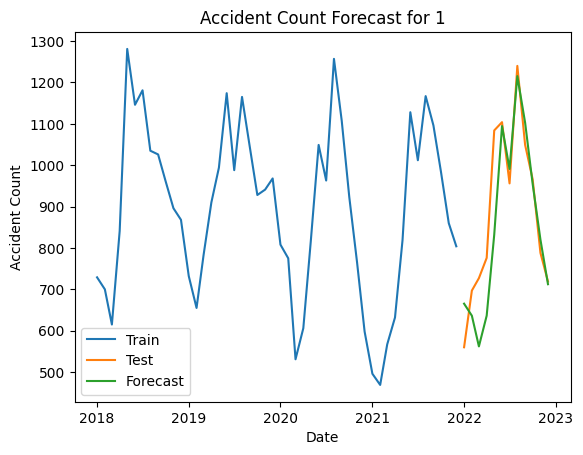

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


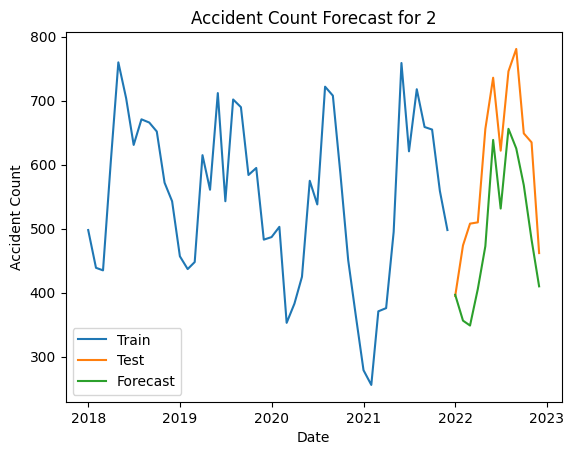

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


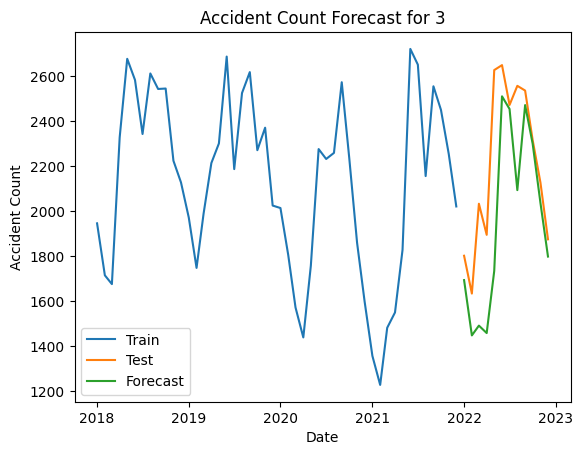

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


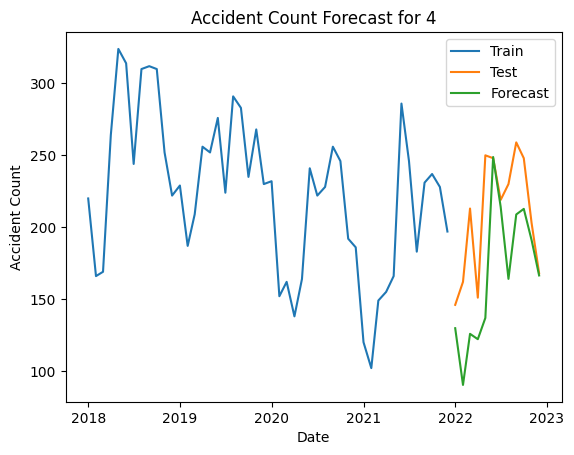

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


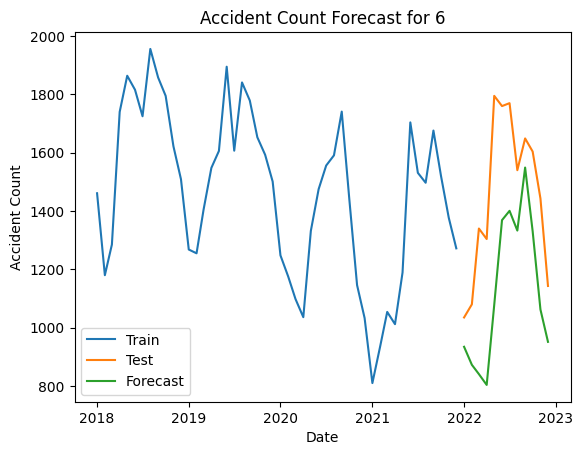

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


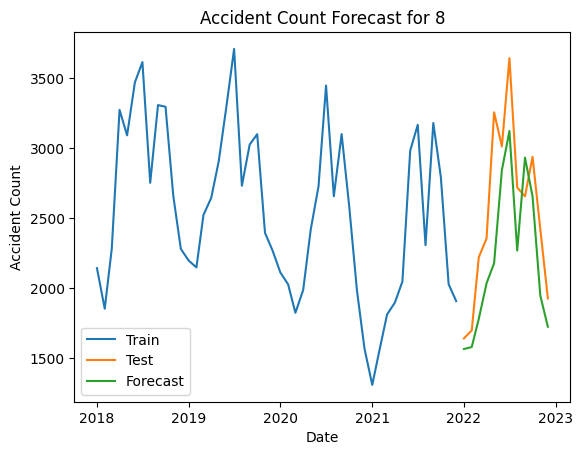

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


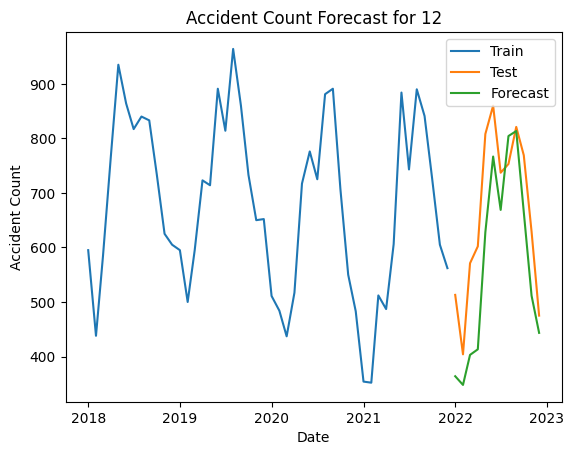

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


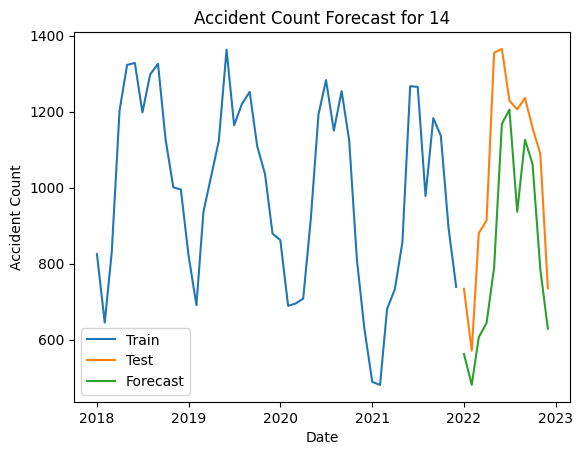

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


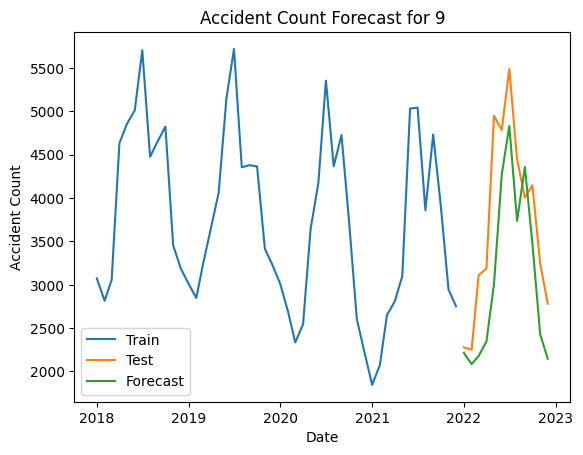

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


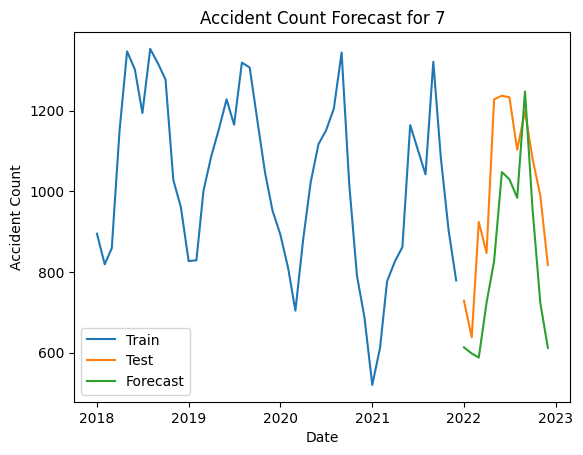

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


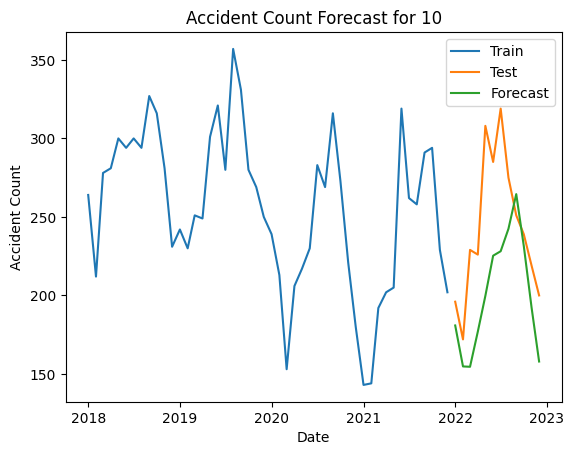

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


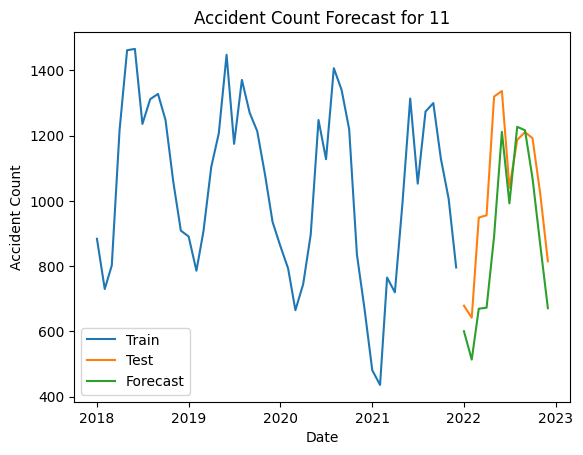

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


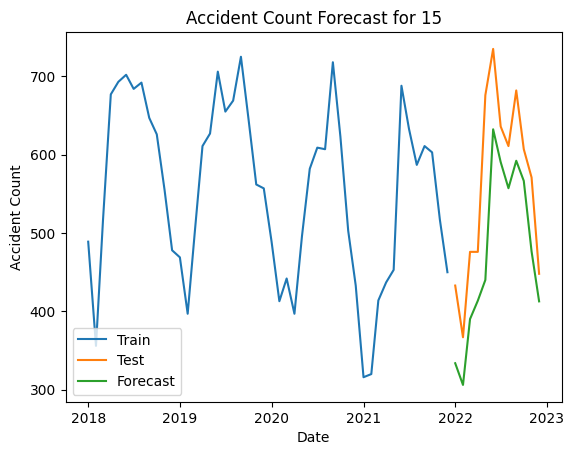

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


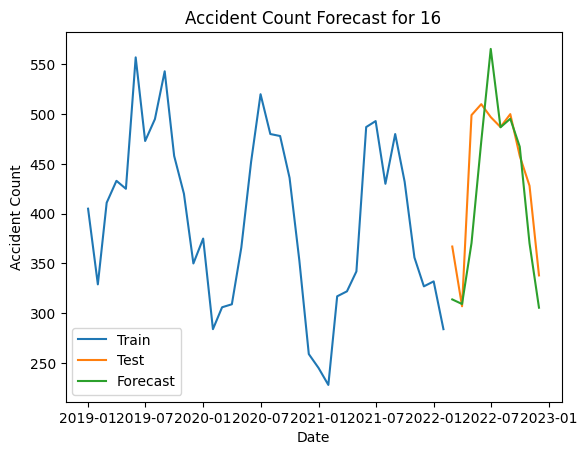

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


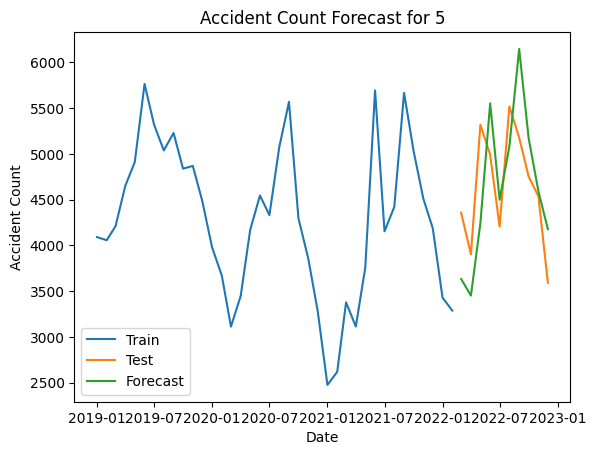

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


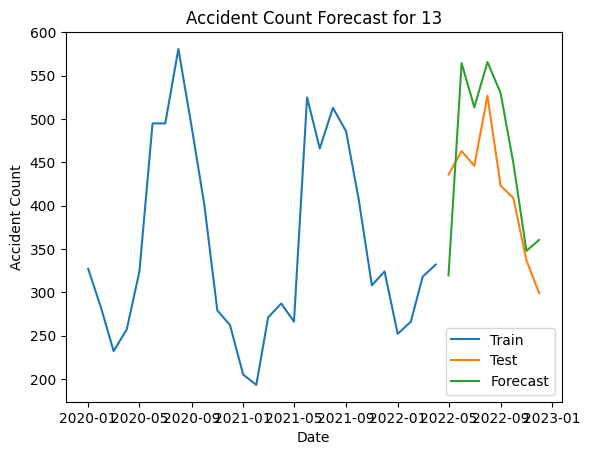

In [30]:
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import TimeSeriesSplit

# Assuming accident_data_master is a DataFrame containing the accident data
# Replace 'ULAND' with the actual column name in your DataFrame
unique_countries = accident_data_master['ULAND'].unique()

for country in unique_countries:
    country_data = accident_data_master[accident_data_master['ULAND'] == country]
    country_data = country_data.groupby('datetime').size().reset_index()
    country_data.columns = ['ds', 'y']  # Assuming 'ds' is the date and 'y' is the value

    # Split the data into training and test sets
    train_size = int(len(country_data) * 0.8)  # 80% train, 20% test
    train, test = country_data[:train_size], country_data[train_size:]

    # Fit the SARIMA model
    model = SARIMAX(train['y'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))  # Example order for SARIMA model
    model_fit = model.fit(disp=False)

    # Make future predictions
    forecast = model_fit.get_forecast(steps=len(test))  # Forecast the same length as the test set

    # Plot the forecast
    plt.plot(train['ds'], train['y'], label='Train')
    plt.plot(test['ds'], test['y'], label='Test')
    plt.plot(test['ds'], forecast.predicted_mean, label='Forecast')
    plt.xlabel('Date')
    plt.ylabel('Accident Count')
    plt.title(f'Accident Count Forecast for {country}')
    plt.legend()
    plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


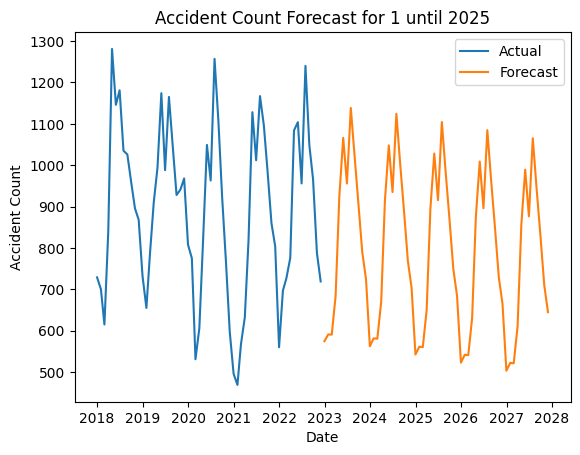

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


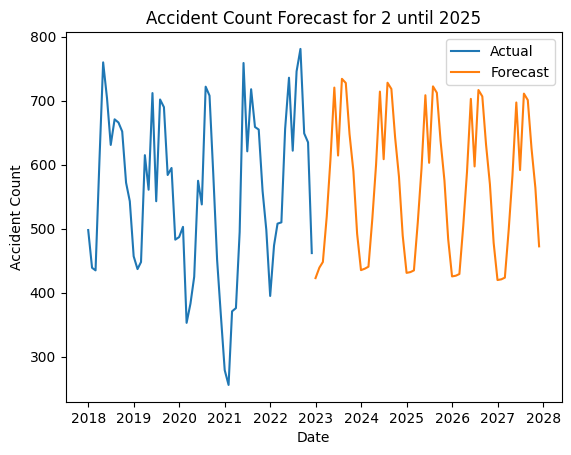

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


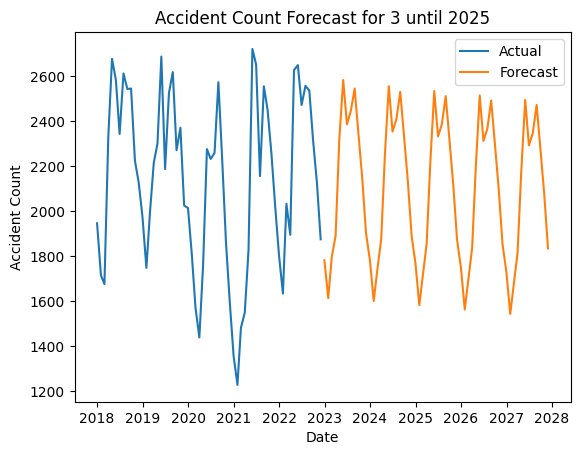

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


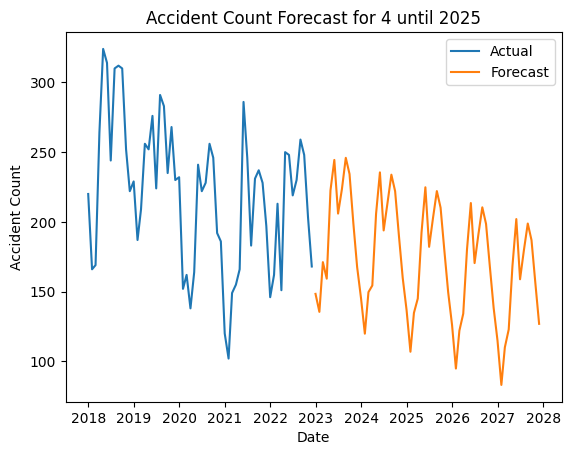

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


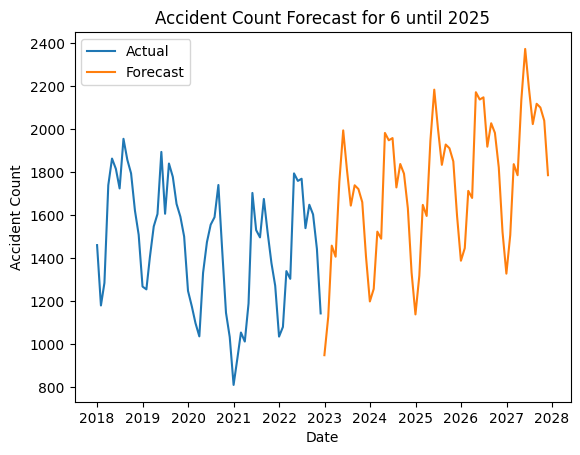

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


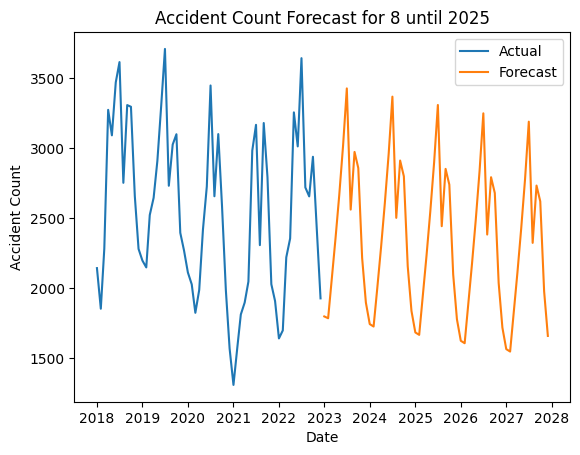

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


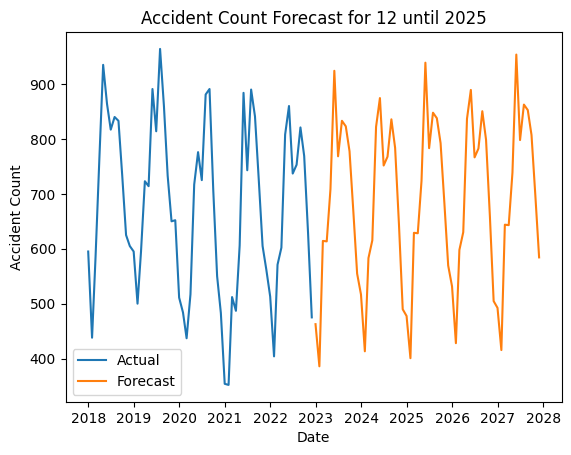

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


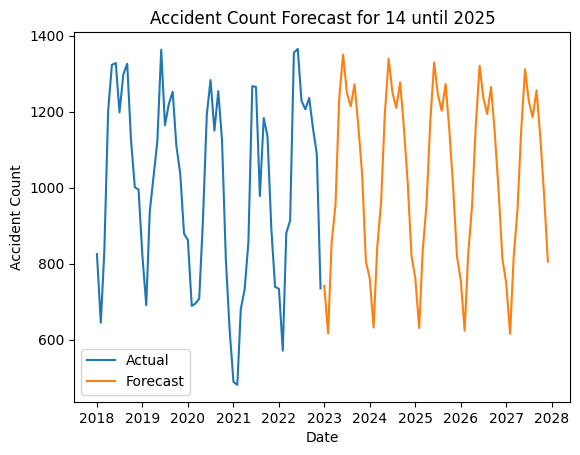

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


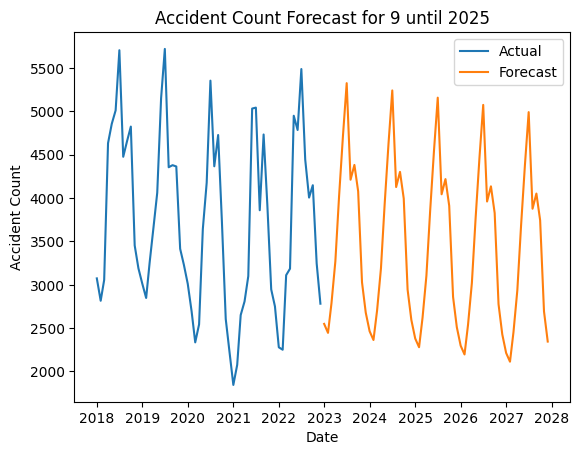

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


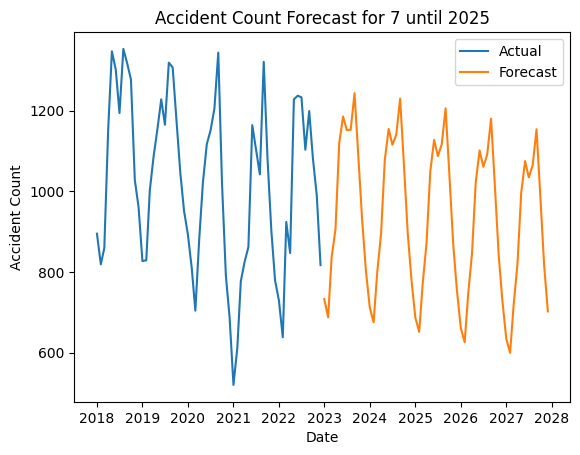

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


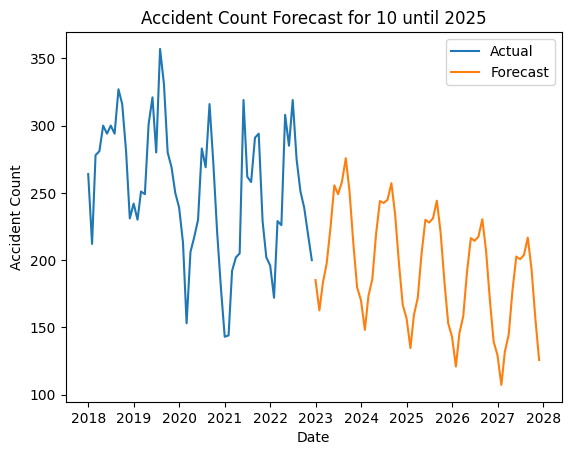

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


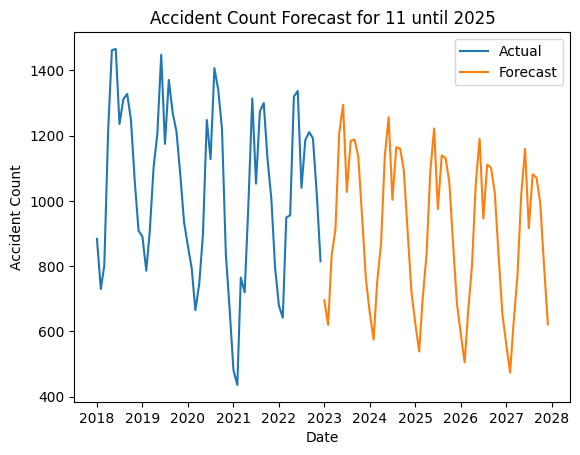

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


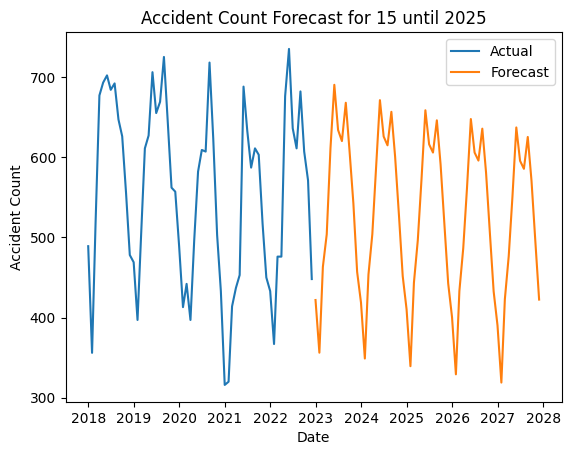

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


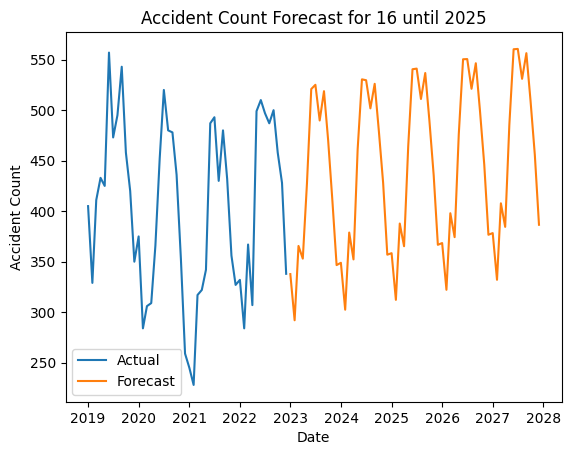

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


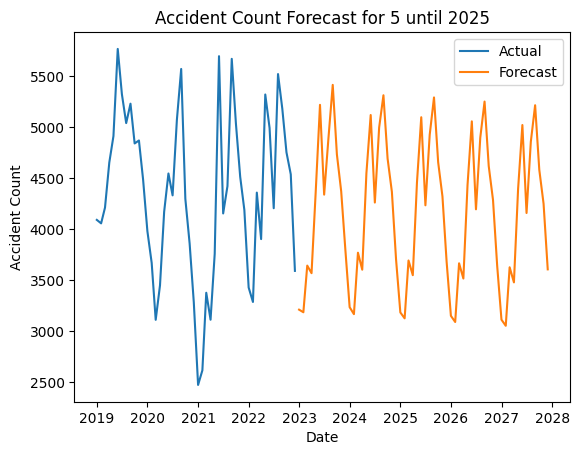

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


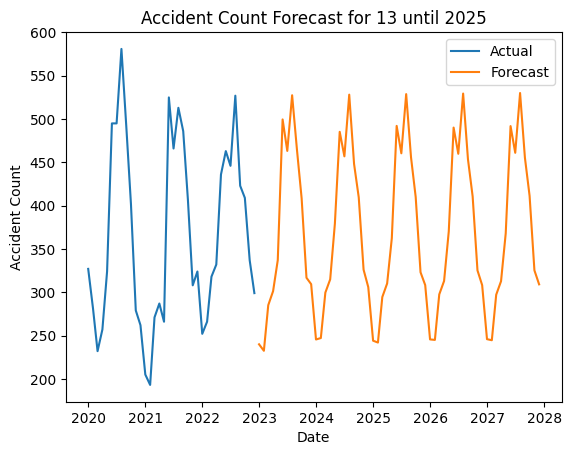

In [31]:
import matplotlib.pyplot as plt
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Assuming accident_data_master is a DataFrame containing the accident data
# Replace 'ULAND' with the actual column name in your DataFrame
unique_countries = accident_data_master['ULAND'].unique()

for country in unique_countries:
    country_data = accident_data_master[accident_data_master['ULAND'] == country]
    country_data = country_data.groupby('datetime').size().reset_index()
    country_data.columns = ['ds', 'y']  # Assuming 'ds' is the date and 'y' is the value

    # Fit the SARIMAX model
    model = SARIMAX(country_data['y'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))  # Example order for SARIMAX model
    model_fit = model.fit(disp=False)

    # Generate future dates up to 2025
    future_dates = pd.date_range(start=country_data['ds'].iloc[-1], periods=60, freq='M')  # Forecasting 60 months into the future

    # Make future predictions
    forecast = model_fit.get_forecast(steps=len(future_dates))

    # Plot the forecast
    plt.plot(country_data['ds'], country_data['y'], label='Actual')
    plt.plot(future_dates, forecast.predicted_mean, label='Forecast')  # Use future_dates instead of forecast.index
    plt.xlabel('Date')
    plt.ylabel('Accident Count')
    plt.title(f'Accident Count Forecast for {country} until 2025')
    plt.legend()
    plt.show()

In [32]:
accident_data_master.columns

Index(['ULAND', 'UREGBEZ', 'UKREIS', 'UGEMEINDE', 'UJAHR', 'UMONAT', 'USTUNDE',
       'UWOCHENTAG', 'UKATEGORIE', 'UART', 'UTYP1', 'ULICHTVERH',
       'USTRZUSTAND', 'IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstGkfz',
       'IstSonstige', 'X-Axis', 'Y-Axis', 'Year', 'datetime'],
      dtype='object')

In [33]:
accident_data_actual = accident_data_master.copy()

In [34]:
accident_data_actual = accident_data_actual.rename(columns={
    'ULAND': 'country',
    'UREGBEZ': 'region',
    'UKREIS': 'district',
    'UGEMEINDE': 'municipality',
    'UJAHR': 'year',
    'UMONAT': 'month',
    'USTUNDE': 'hour',
    'UWOCHENTAG': 'weekday',
    'UKATEGORIE': 'accident_category',
    'UART': 'accident_type',
    'UTYP1': 'accident_typology',
    'ULICHTVERH': 'light_conditions',
    'USTRZUSTAND': 'road_conditions',
    'IstRad': 'is_bicycle_involved',
    'IstPKW': 'is_car_involved',
    'IstFuss': 'is_pedestrian_involved',
    'IstKrad': 'is_motorcycle_involved',
    'IstGkfz': 'is_heavy_vehicle_involved',
    'IstSonstige': 'is_other_vehicle_involved',
    'X-Axis': 'x_coordinate',
    'Y-Axis': 'y_coordinate',
    'Year': 'year_column',
    'datetime': 'date_time'
})

In [35]:
accident_data_actual.head(2)

,country,region,district,municipality,year,month,hour,weekday,accident_category,accident_type,...,is_bicycle_involved,is_car_involved,is_pedestrian_involved,is_motorcycle_involved,is_heavy_vehicle_involved,is_other_vehicle_involved,x_coordinate,y_coordinate,year_column,date_time
0,1,0,3,0,2018,1,8,5,2,0,...,1,0,0,0,0,0,10.703950,53.863081,2018,2018-01-01
1,1,0,62,20,2018,1,15,6,3,5,...,0,1,0,0,0,0,10.394497,53.589906,2018,2018-01-01


In [36]:
accident_data_actual.columns

Index(['country', 'region', 'district', 'municipality', 'year', 'month',
       'hour', 'weekday', 'accident_category', 'accident_type',
       'accident_typology', 'light_conditions', 'road_conditions',
       'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
       'is_motorcycle_involved', 'is_heavy_vehicle_involved',
       'is_other_vehicle_involved', 'x_coordinate', 'y_coordinate',
       'year_column', 'date_time'],
      dtype='object')

In [37]:
# prompt: I want to detect anomalies in the above dataset

from sklearn.ensemble import IsolationForest

# Assuming accident_data_actual is a DataFrame containing the accident data
# Replace 'accident_data_actual' with the actual DataFrame name in your code

# Select numerical features for anomaly detection
numerical_features = ['country', 'region', 'district', 'municipality','accident_category', 'accident_type',
       'accident_typology', 'light_conditions', 'road_conditions',
       'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
       'is_motorcycle_involved', 'is_heavy_vehicle_involved',
       'is_other_vehicle_involved']

# Separate features and target
X = accident_data_actual[numerical_features]

# Create and fit the Isolation Forest model
model = IsolationForest(contamination=0.01)
model.fit(X)

# Predict anomaly scores
anomaly_scores = model.decision_function(X)

# Add anomaly scores to the DataFrame
accident_data_actual['anomaly_score'] = anomaly_scores

# Sort by anomaly score
accident_data_actual = accident_data_actual.sort_values(by='anomaly_score', ascending=False)

# Print the top 10 anomalies
print(accident_data_actual.head(10))


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


        country  region  district  municipality  year  month  hour  weekday  \
80981         8       3        35            15  2021      8    16        4   
78993         8       3        35            15  2022      1    13        2   
155429        8       2        35             6  2020      9    10        4   
80144         8       2        35             7  2021      7     7        5   
9348          8       2        35             7  2020      3    17        2   
42141         8       2        35             7  2018      3    15        6   
26868         8       2        35             8  2019      4    14        6   
77140         8       2        35             7  2021      6    18        6   
23741         8       2        35             8  2019      2    13        5   
11347         8       2        35             8  2020      5     8        3   

        accident_category  accident_type  ...  is_car_involved  \
80981                   3              5  ...                1  

In [38]:
accident_data_actual.head(10)

,country,region,district,municipality,year,month,hour,weekday,accident_category,accident_type,...,is_car_involved,is_pedestrian_involved,is_motorcycle_involved,is_heavy_vehicle_involved,is_other_vehicle_involved,x_coordinate,y_coordinate,year_column,date_time,anomaly_score
80981,8,3,35,15,2021,8,16,4,3,5,...,1,0,0,0,0,8.700197,47.696368,2021,2021-08-01,0.245776
78993,8,3,35,15,2022,1,13,2,3,5,...,1,0,0,0,0,8.690458,47.696998,2022,2022-01-01,0.245776
155429,8,2,35,6,2020,9,10,4,3,5,...,1,0,0,0,0,8.606487,48.584805,2020,2020-09-01,0.245673
80144,8,2,35,7,2021,7,7,5,3,5,...,1,0,0,0,0,8.790373,48.735712,2021,2021-07-01,0.245673
9348,8,2,35,7,2020,3,17,2,3,5,...,1,0,0,0,0,8.796885,48.720822,2020,2020-03-01,0.245673
42141,8,2,35,7,2018,3,15,6,3,5,...,1,0,0,0,0,8.750273,48.744761,2018,2018-03-01,0.245673
26868,8,2,35,8,2019,4,14,6,3,5,...,1,0,0,0,0,8.715444,48.777280,2019,2019-04-01,0.245673
77140,8,2,35,7,2021,6,18,6,3,5,...,1,0,0,0,0,8.783286,48.745572,2021,2021-06-01,0.245673
23741,8,2,35,8,2019,2,13,5,3,5,...,1,0,0,0,0,8.736209,48.773640,2019,2019-02-01,0.245673
11347,8,2,35,8,2020,5,8,3,3,5,...,1,0,0,0,0,8.753106,48.768891,2020,2020-05-01,0.245673


In [39]:
accident_data_actual.anomaly_score.describe()

count    1.207932e+06
mean     1.438852e-01
std      5.815817e-02
min     -9.569720e-02
25%      1.044333e-01
50%      1.496543e-01
75%      1.884523e-01
max      2.457759e-01
Name: anomaly_score, dtype: float64

In [40]:
accident_data_ml = accident_data_master.copy()

In [41]:
accident_data_ml.columns

Index(['ULAND', 'UREGBEZ', 'UKREIS', 'UGEMEINDE', 'UJAHR', 'UMONAT', 'USTUNDE',
       'UWOCHENTAG', 'UKATEGORIE', 'UART', 'UTYP1', 'ULICHTVERH',
       'USTRZUSTAND', 'IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstGkfz',
       'IstSonstige', 'X-Axis', 'Y-Axis', 'Year', 'datetime'],
      dtype='object')

In [42]:
accident_data_ml = accident_data_ml.rename(columns={
    'ULAND': 'country',
    'UREGBEZ': 'region',
    'UKREIS': 'district',
    'UGEMEINDE': 'municipality',
    'UJAHR': 'year',
    'UMONAT': 'month',
    'USTUNDE': 'hour',
    'UWOCHENTAG': 'weekday',
    'UKATEGORIE': 'accident_category',
    'UART': 'accident_type',
    'UTYP1': 'accident_typology',
    'ULICHTVERH': 'light_conditions',
    'USTRZUSTAND': 'road_conditions',
    'IstRad': 'is_bicycle_involved',
    'IstPKW': 'is_car_involved',
    'IstFuss': 'is_pedestrian_involved',
    'IstKrad': 'is_motorcycle_involved',
    'IstGkfz': 'is_heavy_vehicle_involved',
    'IstSonstige': 'is_other_vehicle_involved',
    'X-Axis': 'x_coordinate',
    'Y-Axis': 'y_coordinate',
    'Year': 'year_column',
    'datetime': 'date_time'
})

In [43]:
Stopping here................@@@@@@@@@@@@@@@@

SyntaxError: invalid syntax (<ipython-input-43-c91c0f07bcd2>, line 1)

In [44]:
# Most Probable Time of Accident

import pandas as pd

import pandas as pd

# Group the data by country and hour
grouped_data = accident_data_ml.groupby(['country', 'hour']).size().unstack()

# Find the hour with the maximum number of accidents for each country
most_probable_time = grouped_data.idxmax(axis=1)

# Create a dictionary to store the results
country_time_dict = {}

# Extract the most probable time for each country
# Iterate over the index of most_probable_time, which contains the country names
for country in most_probable_time.index:
    country_time_dict[country] = most_probable_time[country]

# Print the dictionary
print(country_time_dict)

{1: 16, 2: 16, 3: 16, 4: 15, 5: 16, 6: 17, 7: 16, 8: 17, 9: 16, 10: 16, 11: 15, 12: 15, 13: 16, 14: 15, 15: 15, 16: 14}


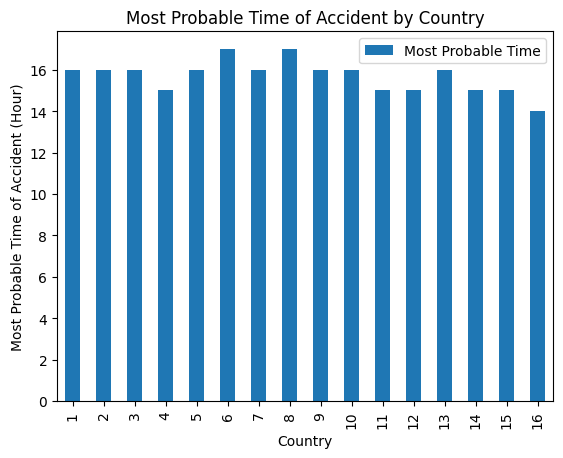

In [45]:
# prompt: Can you plot country_time_dict

import pandas as pd
import matplotlib.pyplot as plt
# Convert the dictionary to a DataFrame
time_df = pd.DataFrame.from_dict(country_time_dict, orient='index', columns=['Most Probable Time'])

# Plot the data as a bar chart
time_df.plot(kind='bar')
plt.xlabel('Country')
plt.ylabel('Most Probable Time of Accident (Hour)')
plt.title('Most Probable Time of Accident by Country')
plt.show()


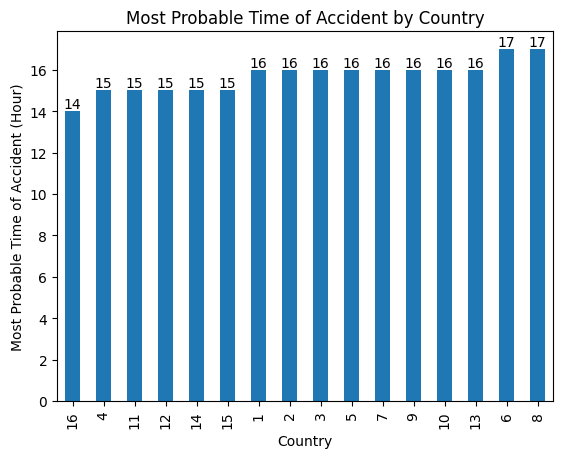

In [46]:
# prompt: Can you plot country_time_dict by displaying the time on top of the bar

import matplotlib.pyplot as plt
import pandas as pd

# Create a dictionary to store the results
#country_time_dict = {'Country A': 10, 'Country B': 14, 'Country C': 8}

# Convert the dictionary to a DataFrame
time_df = pd.DataFrame.from_dict(country_time_dict, orient='index', columns=['Most Probable Time'])

# Sort the DataFrame by time
time_df = time_df.sort_values(by='Most Probable Time')

# Create a bar chart
ax = time_df.plot(kind='bar', legend=False)

# Add time labels on top of the bars
for i, bar in enumerate(ax.patches):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
            time_df['Most Probable Time'].iloc[i], ha='center', va='bottom')

# Set the title and axis labels
plt.xlabel('Country')
plt.ylabel('Most Probable Time of Accident (Hour)')
plt.title('Most Probable Time of Accident by Country')

# Show the plot
plt.show()


In [47]:
accident_data_ml.columns

Index(['country', 'region', 'district', 'municipality', 'year', 'month',
       'hour', 'weekday', 'accident_category', 'accident_type',
       'accident_typology', 'light_conditions', 'road_conditions',
       'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
       'is_motorcycle_involved', 'is_heavy_vehicle_involved',
       'is_other_vehicle_involved', 'x_coordinate', 'y_coordinate',
       'year_column', 'date_time'],
      dtype='object')

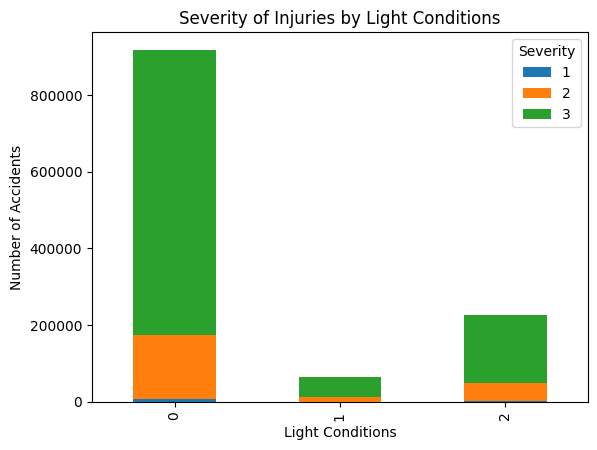

In [48]:
# prompt: Can we analyse and plot a chart to show how light conditions are affecting the accidents

import pandas as pd
import matplotlib.pyplot as plt
# Create a cross-tabulation of accident counts by light conditions and severity of injuries
severity_light_cross_tab = pd.crosstab(accident_data_ml['light_conditions'], accident_data_ml['accident_category'])

# Plot the cross-tabulation as a bar chart
severity_light_cross_tab.plot(kind='bar', stacked=True)

# Add title, labels, and legend
plt.title('Severity of Injuries by Light Conditions')
plt.xlabel('Light Conditions')
plt.ylabel('Number of Accidents')
plt.legend(title='Severity')
plt.show()


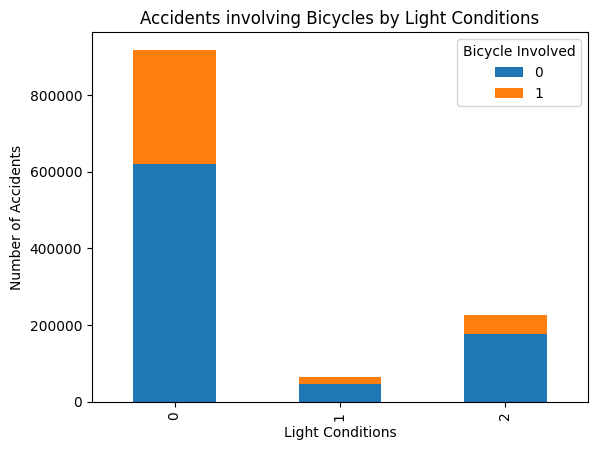

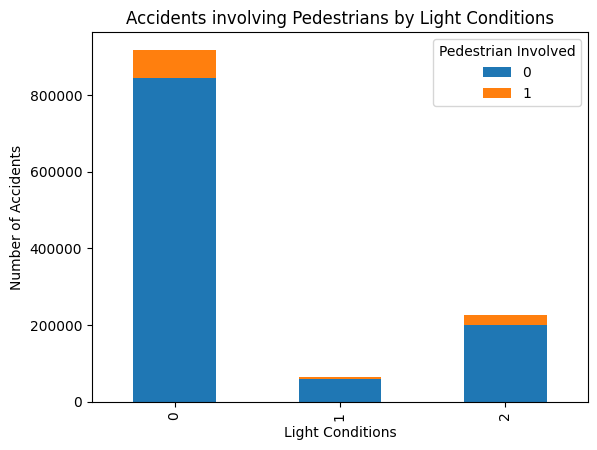

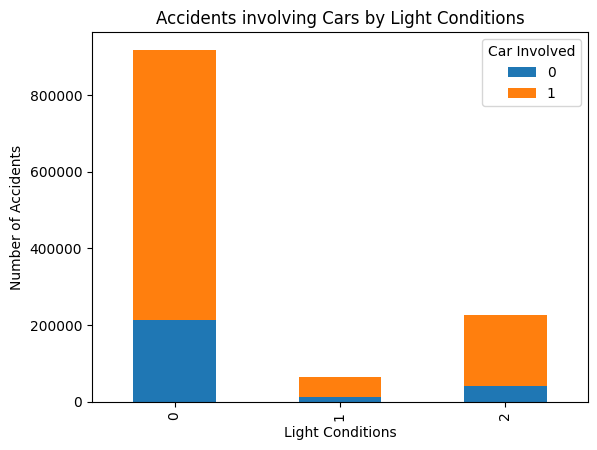

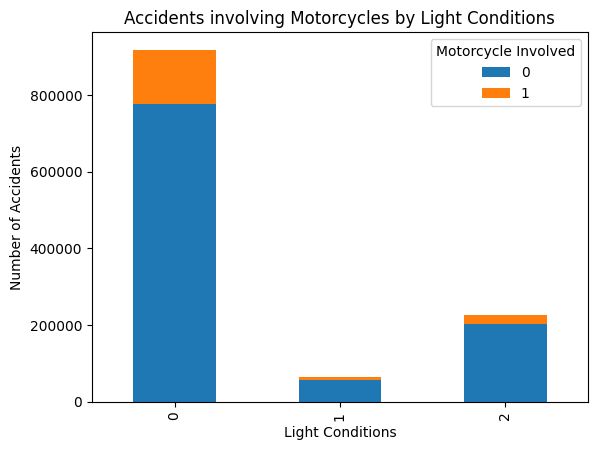

In [49]:
# prompt: How are light conditions affecting the accidents for bicycle , pedestrains, car and motor cycle. Plot different graphs to show this.

import pandas as pd
import matplotlib.pyplot as plt

# Create a cross-tabulation of accident counts by light conditions and vehicle type
vehicle_light_cross_tab = pd.crosstab(accident_data_ml['light_conditions'], accident_data_ml['is_bicycle_involved'])

# Plot the cross-tabulation as a bar chart
vehicle_light_cross_tab.plot(kind='bar', stacked=True)

# Add title, labels, and legend
plt.title('Accidents involving Bicycles by Light Conditions')
plt.xlabel('Light Conditions')
plt.ylabel('Number of Accidents')
plt.legend(title='Bicycle Involved')
plt.show()

# Repeat the same process for pedestrians, cars, and motorcycles
vehicle_light_cross_tab = pd.crosstab(accident_data_ml['light_conditions'], accident_data_ml['is_pedestrian_involved'])
vehicle_light_cross_tab.plot(kind='bar', stacked=True)
plt.title('Accidents involving Pedestrians by Light Conditions')
plt.xlabel('Light Conditions')
plt.ylabel('Number of Accidents')
plt.legend(title='Pedestrian Involved')
plt.show()

vehicle_light_cross_tab = pd.crosstab(accident_data_ml['light_conditions'], accident_data_ml['is_car_involved'])
vehicle_light_cross_tab.plot(kind='bar', stacked=True)
plt.title('Accidents involving Cars by Light Conditions')
plt.xlabel('Light Conditions')
plt.ylabel('Number of Accidents')
plt.legend(title='Car Involved')
plt.show()

vehicle_light_cross_tab = pd.crosstab(accident_data_ml['light_conditions'], accident_data_ml['is_motorcycle_involved'])
vehicle_light_cross_tab.plot(kind='bar', stacked=True)
plt.title('Accidents involving Motorcycles by Light Conditions')
plt.xlabel('Light Conditions')
plt.ylabel('Number of Accidents')
plt.legend(title='Motorcycle Involved')
plt.show()


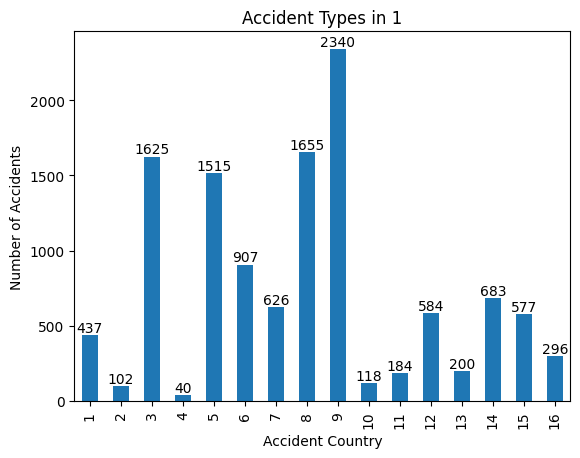

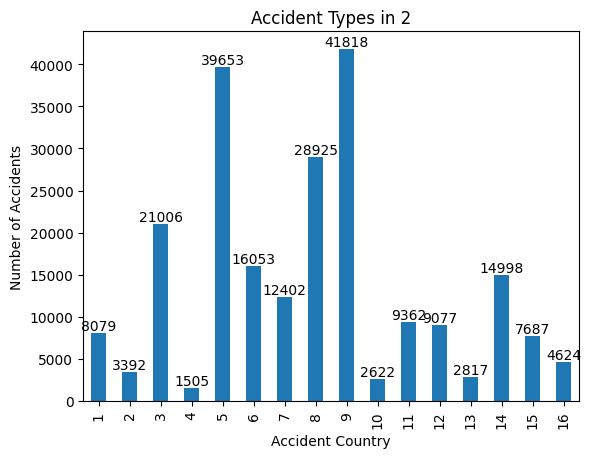

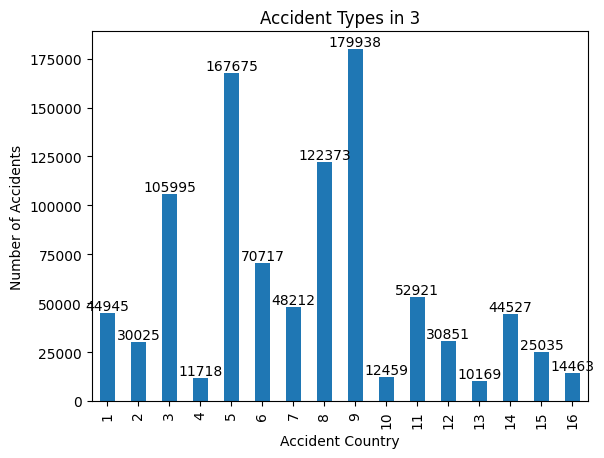

In [50]:
# prompt: What are the type of accidents happening based on country. Plot different graphs for each country to show this. Display the number on top of the bar.

import pandas as pd
import matplotlib.pyplot as plt

# Assuming accident_data_master is a DataFrame containing the accident data
# Replace 'ULAND', 'UKATEGORIE' with the actual column names in your DataFrame
accident_category_counts_by_country = accident_data_master.groupby(['ULAND', 'UKATEGORIE']).size().unstack()

# Loop through each country and plot a bar chart
for country in accident_category_counts_by_country.columns:
    country_data = accident_category_counts_by_country[country]
    country_data.plot(kind='bar')
    plt.title(f'Accident Types in {country}')
    plt.xlabel('Accident Country')
    plt.ylabel('Number of Accidents')

    # Add the number of accidents on top of each bar
    for i, bar in enumerate(plt.gca().patches):
        plt.gca().text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
                    str(bar.get_height()), ha='center', va='bottom')

    plt.show()


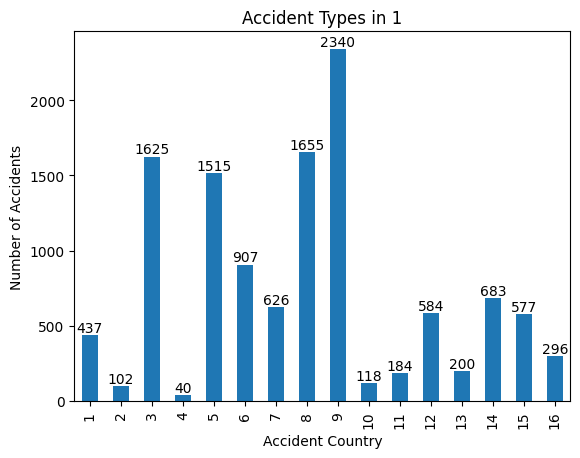

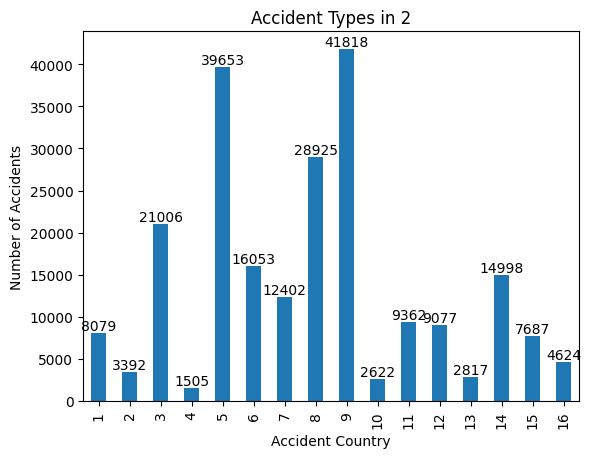

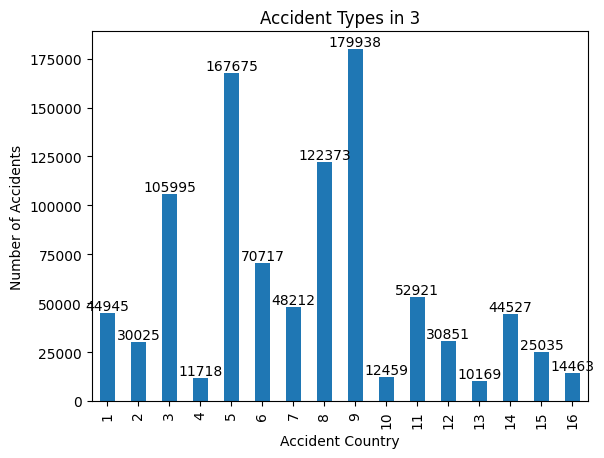

In [51]:
# prompt: How many accidents are happening per country split by accident category. Plot using bar graphs

import matplotlib.pyplot as plt
accident_category_counts_by_country = accident_data_master.groupby(['ULAND', 'UKATEGORIE']).size().unstack()

# Loop through each country and plot a bar chart
for country in accident_category_counts_by_country.columns:
    country_data = accident_category_counts_by_country[country]
    country_data.plot(kind='bar')
    plt.title(f'Accident Types in {country}')
    plt.xlabel('Accident Country')
    plt.ylabel('Number of Accidents')

    # Add the number of accidents on top of each bar
    for i, bar in enumerate(plt.gca().patches):
        plt.gca().text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
                    str(bar.get_height()), ha='center', va='bottom')

    plt.show()


In [52]:
accident_data_ml.columns

Index(['country', 'region', 'district', 'municipality', 'year', 'month',
       'hour', 'weekday', 'accident_category', 'accident_type',
       'accident_typology', 'light_conditions', 'road_conditions',
       'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
       'is_motorcycle_involved', 'is_heavy_vehicle_involved',
       'is_other_vehicle_involved', 'x_coordinate', 'y_coordinate',
       'year_column', 'date_time'],
      dtype='object')

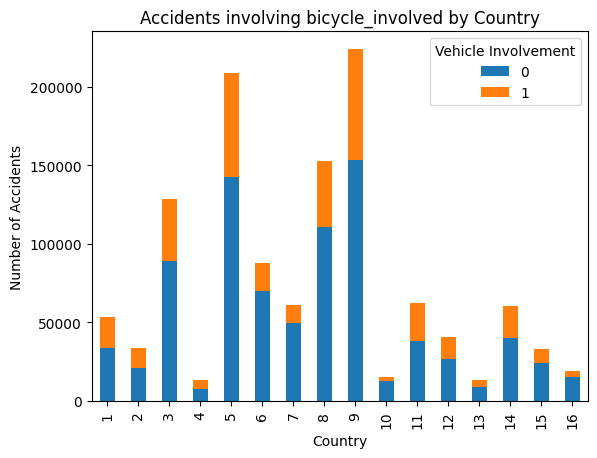

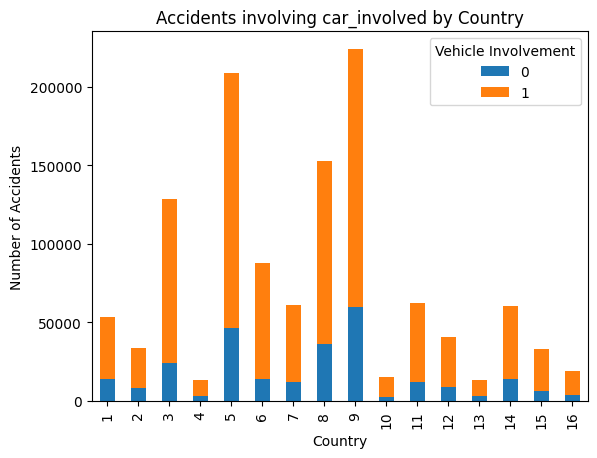

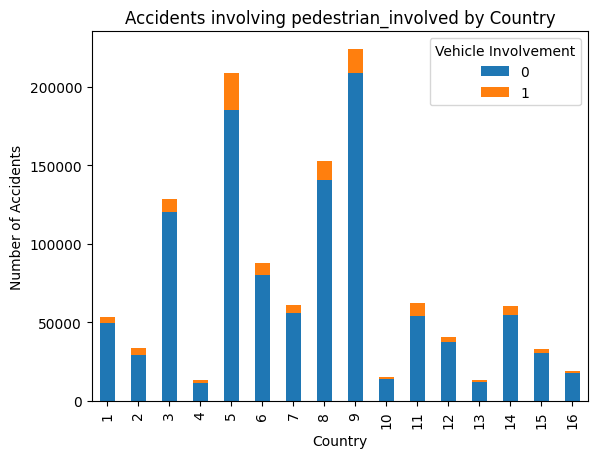

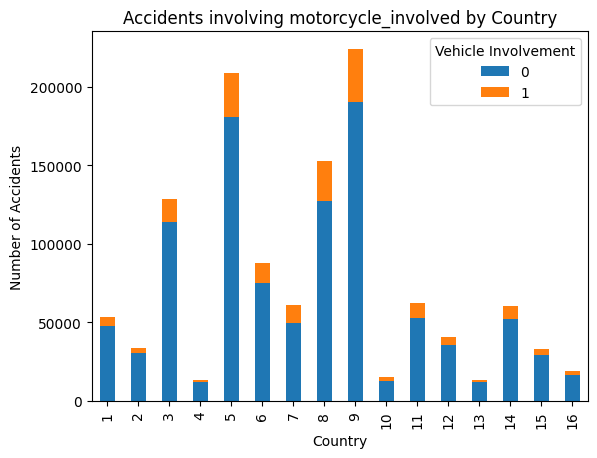

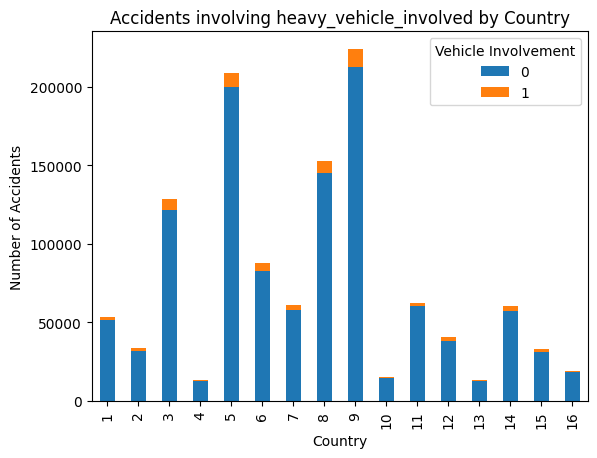

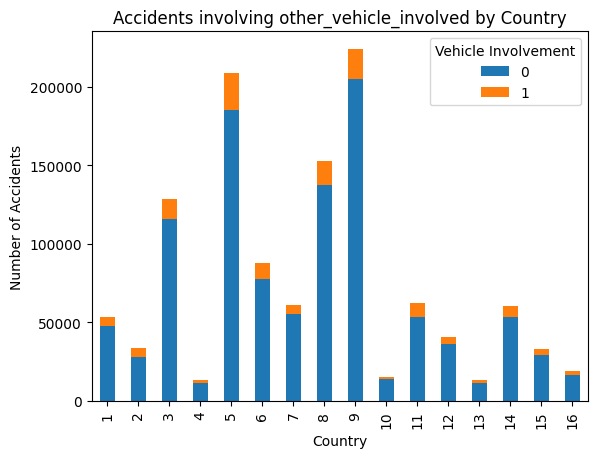

In [53]:
# prompt: Can you plot graphs for the accidents involving 'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
#        'is_motorcycle_involved', 'is_heavy_vehicle_involved',
#        'is_other_vehicle_involved' for the country

import matplotlib.pyplot as plt
import pandas as pd

# Assuming accident_data_ml is a DataFrame containing the accident data

# Create a list of vehicle involvement columns
vehicle_involvement_cols = ['is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
       'is_motorcycle_involved', 'is_heavy_vehicle_involved',
       'is_other_vehicle_involved']

# Loop through each vehicle involvement column
for col in vehicle_involvement_cols:
    # Group data by country and vehicle involvement
    grouped_data = accident_data_ml.groupby(['country', col]).size().unstack()

    # Create a bar chart
    grouped_data.plot(kind='bar', stacked=True)

    # Add title, labels, and legend
    plt.title(f'Accidents involving {col.replace("is_", "")} by Country')
    plt.xlabel('Country')
    plt.ylabel('Number of Accidents')
    plt.legend(title='Vehicle Involvement')

    # Show the plot
    plt.show()

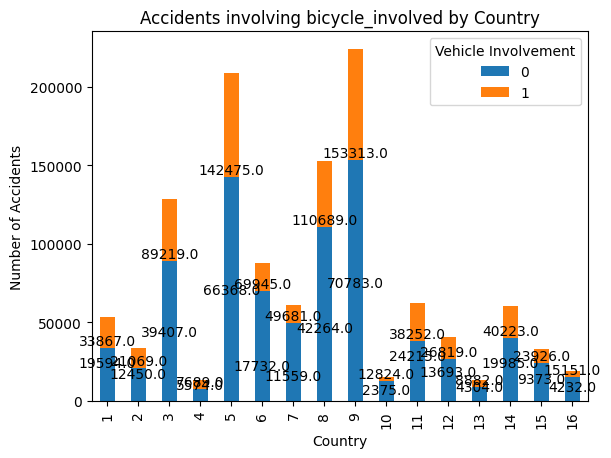

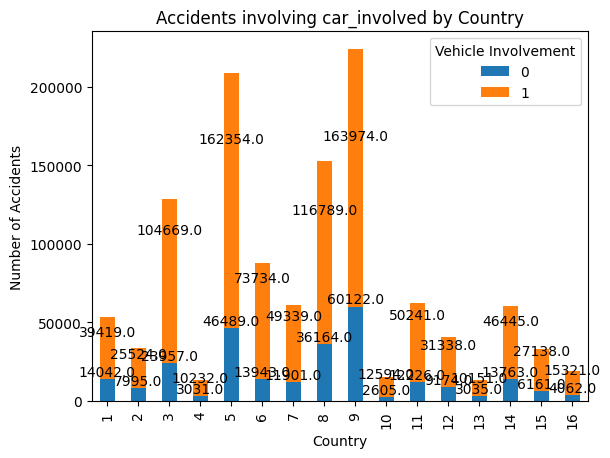

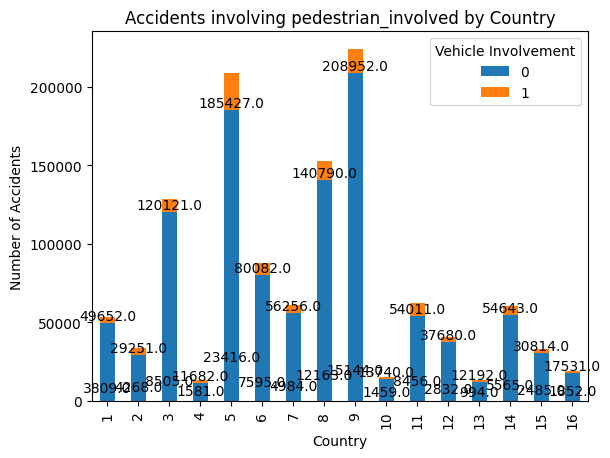

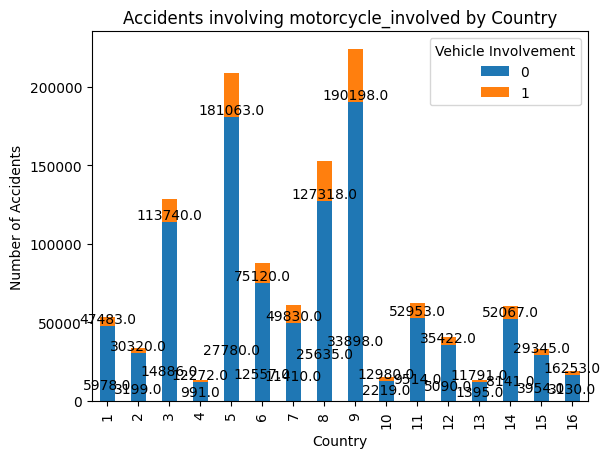

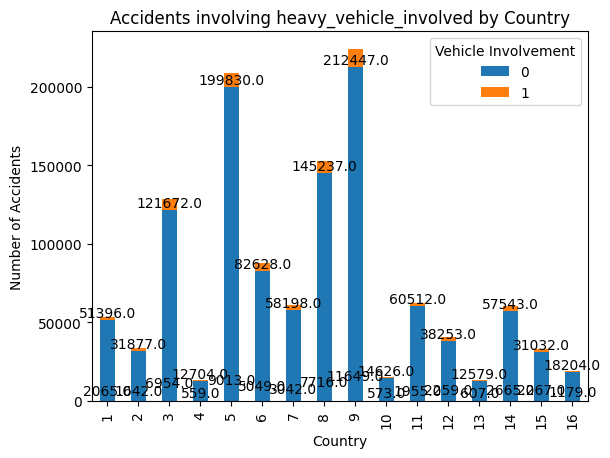

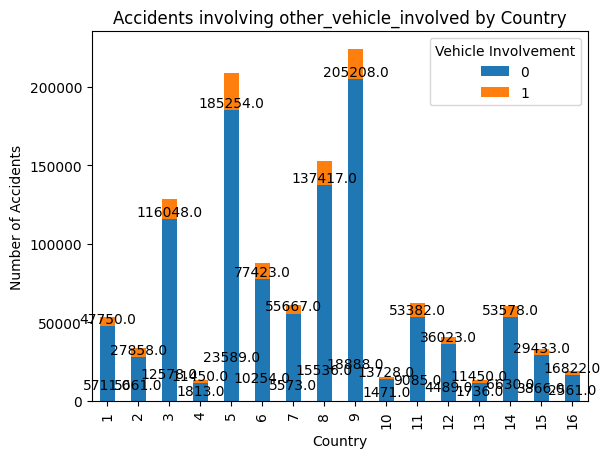

In [54]:
# prompt: Can you plot graphs for the accidents involving 'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
#         'is_motorcycle_involved', 'is_heavy_vehicle_involved',
#         'is_other_vehicle_involved' for the country. Display the count on the bar

import pandas as pd
import matplotlib.pyplot as plt

# Assuming accident_data_ml is a DataFrame containing the accident data

# Create a list of vehicle involvement columns
vehicle_involvement_cols = ['is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
       'is_motorcycle_involved', 'is_heavy_vehicle_involved',
       'is_other_vehicle_involved']

# Loop through each vehicle involvement column
for col in vehicle_involvement_cols:
    # Group data by country and vehicle involvement
    grouped_data = accident_data_ml.groupby(['country', col]).size().unstack()

    # Create a bar chart
    grouped_data.plot(kind='bar', stacked=True)

    # Add title, labels, and legend
    plt.title(f'Accidents involving {col.replace("is_", "")} by Country')
    plt.xlabel('Country')
    plt.ylabel('Number of Accidents')
    plt.legend(title='Vehicle Involvement')

    # Add the number of accidents on top of each bar
    for i, bar in enumerate(plt.gca().patches):
        plt.gca().text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
                    str(bar.get_height()), ha='center', va='bottom')

    # Show the plot
    plt.show()


In [55]:
# prompt: can you load the data from /content/regional_averages_tm_01.txt into a dataframe with columns
weather_df_list = []
for i in range(1,13):
  df_name = 'weather_df_'+str(i)
  #print(df_name)
  df_name = pd.read_csv('/content/regional_averages_tm_0'+str(i)+'.csv', sep=';',skiprows=(0),header=(1))
  #print(df_name.shape)
  weather_df_list.append(df_name)
# Print the DataFrame

In [56]:
jan_wdf = weather_df_list[0]
feb_wdf = weather_df_list[1]
mar_wdf = weather_df_list[2]
apr_wdf = weather_df_list[3]
may_wdf = weather_df_list[4]
jun_wdf = weather_df_list[5]
jul_wdf = weather_df_list[6]
aug_wdf = weather_df_list[7]
sep_wdf = weather_df_list[8]
oct_wdf = weather_df_list[9]
nov_wdf = weather_df_list[10]
dec_wdf = weather_df_list[11]

In [57]:
jan_wdf.head()

,Jahr,Monat,Brandenburg/Berlin,Brandenburg,Baden-Wuerttemberg,Bayern,Hessen,Mecklenburg-Vorpommern,Niedersachsen,Niedersachsen/Hamburg/Bremen,Nordrhein-Westfalen,Rheinland-Pfalz,Schleswig-Holstein,Saarland,Sachsen,Sachsen-Anhalt,Thueringen/Sachsen-Anhalt,Thueringen,Deutschland,Unnamed: 19
0,1881,1,-5.54,-5.56,-4.89,-6.51,-5.68,-5.07,-4.55,-4.55,-4.21,-4.49,-4.06,-4.15,-6.22,-5.89,-6.28,-6.76,-5.36,NaN
1,1882,1,1.43,1.42,-0.65,-1.33,-0.30,1.59,1.73,1.73,1.26,-0.17,2.11,-0.04,0.63,1.18,0.60,-0.12,0.41,NaN
2,1883,1,-0.41,-0.42,-0.09,-1.49,0.04,-0.69,0.33,0.32,1.27,0.49,-0.12,0.55,-1.20,-0.39,-0.69,-1.07,-0.32,NaN
3,1884,1,3.35,3.34,2.34,1.22,2.97,3.16,3.99,3.99,4.17,3.24,3.56,3.24,2.39,3.32,2.93,2.43,2.86,NaN
4,1885,1,-2.15,-2.16,-3.88,-4.91,-2.66,-1.71,-1.44,-1.44,-1.14,-2.01,-1.09,-2.00,-2.87,-2.86,-3.36,-3.98,-2.79,NaN


In [58]:
# prompt: I want to extract only the data for 2018 to 2022 in the Jahr column from jan_wdf

jan_wdf_filtered = jan_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()
feb_wdf_filtered = feb_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()
mar_wdf_filtered = mar_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()
apr_wdf_filtered = apr_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()
may_wdf_filtered = may_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()
jun_wdf_filtered = jun_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()
jul_wdf_filtered = jul_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()
aug_wdf_filtered = aug_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()
sep_wdf_filtered = sep_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()
oct_wdf_filtered = oct_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()
nov_wdf_filtered = nov_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()
dec_wdf_filtered = dec_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()

<ipython-input-58-3efc4bcfd3cd>:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  may_wdf_filtered = may_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()
<ipython-input-58-3efc4bcfd3cd>:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  jun_wdf_filtered = jun_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()
<ipython-input-58-3efc4bcfd3cd>:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  jul_wdf_filtered = jul_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()
<ipython-input-58-3efc4bcfd3cd>:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  aug_wdf_filtered = aug_wdf[jan_wdf['Jahr'].isin([2018, 2019, 2020, 2021, 2022])].reset_index()
<ipython-input-58-3efc4bcfd3cd>:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sep_wdf_filtered = sep_wdf[jan_wdf['Jahr'].isin([2018

In [59]:
dec_wdf_filtered

,index,Jahr,Monat,Brandenburg/Berlin,Brandenburg,Baden-Wuerttemberg,Bayern,Hessen,Mecklenburg-Vorpommern,Niedersachsen,...,Nordrhein-Westfalen,Rheinland-Pfalz,Schleswig-Holstein,Saarland,Sachsen,Sachsen-Anhalt,Thueringen/Sachsen-Anhalt,Thueringen,Deutschland,Unnamed: 19
0,137,2018,12,4.30,4.29,3.17,2.34,3.73,4.46,5.21,...,4.98,3.94,5.16,3.98,3.28,4.58,4.03,3.30,3.90,NaN
1,138,2019,12,4.10,4.09,3.01,2.28,3.39,4.22,4.86,...,4.90,3.96,4.97,4.25,3.75,4.23,3.78,3.19,3.75,NaN
2,139,2020,12,3.14,3.14,2.41,1.31,3.14,3.16,4.40,...,4.67,3.75,4.10,4.11,2.88,3.50,3.04,2.45,3.08,NaN
3,140,2021,12,1.79,1.78,2.76,1.66,2.97,1.72,3.31,...,4.25,3.71,2.72,3.97,1.82,2.51,2.27,1.96,2.58,NaN
4,141,2022,12,1.56,1.55,1.95,1.10,1.85,1.20,2.32,...,2.92,2.52,2.15,3.02,1.43,1.66,1.41,1.07,1.80,NaN


In [60]:
accident_data_ml.columns

Index(['country', 'region', 'district', 'municipality', 'year', 'month',
       'hour', 'weekday', 'accident_category', 'accident_type',
       'accident_typology', 'light_conditions', 'road_conditions',
       'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
       'is_motorcycle_involved', 'is_heavy_vehicle_involved',
       'is_other_vehicle_involved', 'x_coordinate', 'y_coordinate',
       'year_column', 'date_time'],
      dtype='object')

In [61]:
accident_data_ml.dtypes

country                               int64
region                                int64
district                              int64
municipality                          int64
year                                  int64
month                                 int64
hour                                  int64
weekday                               int64
accident_category                     int64
accident_type                         int64
accident_typology                     int64
light_conditions                      int64
road_conditions                       int64
is_bicycle_involved                   int64
is_car_involved                       int64
is_pedestrian_involved                int64
is_motorcycle_involved                int64
is_heavy_vehicle_involved             int64
is_other_vehicle_involved             int64
x_coordinate                        float64
y_coordinate                        float64
year_column                           int64
date_time                    dat

In [62]:
# prompt: Create a new column from  with the following information by using the information from country column
# 01 = Schleswig-Holstein
# 02 = Hamburg
# 03 = Niedersachsen
# 04 = Bremen
# 05 = 'Nordrhein-Westfalen (data as from 2019)
# 06 = Hessen
# 07 = Rheinland-Pfalz (data as from 2017)
# 08 = Baden-Württemberg
# 09 = Bayern
# 10 = Saarland (data as from 2017)
# 11 = Berlin (data as from 2018)
# 12 = Brandenburg (data as from

def get_region(country_code):
  if country_code == 1:
    return 'Schleswig-Holstein'
  elif country_code == 2:
    return 'Hamburg'
  elif country_code == 3:
    return 'Niedersachsen'
  elif country_code == 4:
    return 'Bremen'
  elif country_code == 5:
    return 'Nordrhein-Westfalen'
  elif country_code == 6:
    return 'Hessen'
  elif country_code == 7:
    return 'Rheinland-Pfalz'
  elif country_code == 8:
    return 'Baden-Württemberg'
  elif country_code == 9:
    return 'Bayern'
  elif country_code == 10:
    return 'Saarland'
  elif country_code == 11:
    return 'Berlin'
  elif country_code == 12:
    return 'Brandenburg'
  elif country_code == 13:
    return 'Mecklenburg-Vorpommern'
  elif country_code == 14:
    return 'Sachsen'
  elif country_code == 15:
    return 'Sachsen-Anhalt'
  elif country_code == 16:
    return 'Thüringen'
  else:
    return 'Unknown'

accident_data_ml['region'] = accident_data_ml['country'].apply(get_region)
accident_data_ml.head()


,country,region,district,municipality,year,month,hour,weekday,accident_category,accident_type,...,is_bicycle_involved,is_car_involved,is_pedestrian_involved,is_motorcycle_involved,is_heavy_vehicle_involved,is_other_vehicle_involved,x_coordinate,y_coordinate,year_column,date_time
0,1,Schleswig-Holstein,3,0,2018,1,8,5,2,0,...,1,0,0,0,0,0,10.703950,53.863081,2018,2018-01-01
1,1,Schleswig-Holstein,62,20,2018,1,15,6,3,5,...,0,1,0,0,0,0,10.394497,53.589906,2018,2018-01-01
2,1,Schleswig-Holstein,56,15,2018,1,19,4,3,2,...,0,1,0,0,0,0,9.714396,53.743907,2018,2018-01-01
3,1,Schleswig-Holstein,59,37,2018,1,10,5,3,5,...,0,1,0,0,0,0,9.528666,54.636949,2018,2018-01-01
4,1,Schleswig-Holstein,58,150,2018,1,13,3,3,5,...,0,1,0,0,0,0,10.115680,54.479588,2018,2018-01-01


In [63]:
# prompt: merge all the dataframes from jan_weather_filtered to dec_weather_filtered dataframes . total 12

import pandas as pd
weather_18t022df = pd.concat([jan_wdf_filtered, feb_wdf_filtered, mar_wdf_filtered, apr_wdf_filtered, may_wdf_filtered, jun_wdf_filtered, jul_wdf_filtered, aug_wdf_filtered, sep_wdf_filtered, oct_wdf_filtered, nov_wdf_filtered, dec_wdf_filtered])

In [64]:
weather_18t022df.reset_index(inplace=True)

In [65]:
weather_18t022df.head(2)

,level_0,index,Jahr,Monat,Brandenburg/Berlin,Brandenburg,Baden-Wuerttemberg,Bayern,Hessen,Mecklenburg-Vorpommern,...,Nordrhein-Westfalen,Rheinland-Pfalz,Schleswig-Holstein,Saarland,Sachsen,Sachsen-Anhalt,Thueringen/Sachsen-Anhalt,Thueringen,Deutschland,Unnamed: 19
0,0,137,2018,1,3.31,3.31,4.33,3.14,4.1,2.87,...,4.79,4.75,3.23,5.09,3.3,3.68,3.47,3.20,3.72,NaN
1,1,138,2019,1,1.18,1.17,-0.32,-0.95,0.5,1.51,...,1.64,0.83,2.12,0.98,-0.2,1.23,0.59,-0.24,0.63,NaN


In [66]:
# prompt: delete columns level_0 and index from weather_18t022df
weather_18t022df = weather_18t022df.drop(columns=['level_0', 'index', 'Unnamed: 19'])

In [67]:
weather_18t022df.head()

,Jahr,Monat,Brandenburg/Berlin,Brandenburg,Baden-Wuerttemberg,Bayern,Hessen,Mecklenburg-Vorpommern,Niedersachsen,Niedersachsen/Hamburg/Bremen,Nordrhein-Westfalen,Rheinland-Pfalz,Schleswig-Holstein,Saarland,Sachsen,Sachsen-Anhalt,Thueringen/Sachsen-Anhalt,Thueringen,Deutschland
0,2018,1,3.31,3.31,4.33,3.14,4.10,2.87,3.90,3.90,4.79,4.75,3.23,5.09,3.30,3.68,3.47,3.20,3.72
1,2019,1,1.18,1.17,-0.32,-0.95,0.50,1.51,1.99,2.00,1.64,0.83,2.12,0.98,-0.20,1.23,0.59,-0.24,0.63
2,2020,1,4.10,4.09,2.51,1.36,3.22,4.66,4.99,5.00,4.69,3.64,5.43,3.74,2.98,4.18,3.57,2.77,3.48
3,2021,1,0.74,0.72,0.21,-0.74,0.75,1.11,1.65,1.66,1.94,1.18,1.66,1.24,-0.19,0.76,0.34,-0.22,0.63
4,2022,1,3.39,3.38,1.34,1.07,2.66,3.68,4.47,4.48,3.77,2.44,4.69,2.38,2.28,3.73,3.11,2.29,2.79


In [68]:
weather_18t022df.shape

(60, 19)

In [69]:
weather_18t022df.columns

Index(['Jahr', 'Monat', 'Brandenburg/Berlin', 'Brandenburg',
       'Baden-Wuerttemberg', 'Bayern', 'Hessen', 'Mecklenburg-Vorpommern',
       'Niedersachsen', 'Niedersachsen/Hamburg/Bremen', 'Nordrhein-Westfalen',
       'Rheinland-Pfalz', 'Schleswig-Holstein', 'Saarland', 'Sachsen',
       'Sachsen-Anhalt', 'Thueringen/Sachsen-Anhalt', 'Thueringen',
       'Deutschland'],
      dtype='object')

In [70]:
accident_data_ml.region.unique()

array(['Schleswig-Holstein', 'Hamburg', 'Niedersachsen', 'Bremen',
       'Hessen', 'Baden-Württemberg', 'Brandenburg', 'Sachsen', 'Bayern',
       'Rheinland-Pfalz', 'Saarland', 'Berlin', 'Sachsen-Anhalt',
       'Thüringen', 'Nordrhein-Westfalen', 'Mecklenburg-Vorpommern'],
      dtype=object)

In [71]:
# prompt: what are the common elements between the columns of weather_18t022df.columns and accident_data_ml.region values

common_elements = set(weather_18t022df.columns) & set(accident_data_ml.region.unique())
print(common_elements)


{'Sachsen-Anhalt', 'Niedersachsen', 'Schleswig-Holstein', 'Brandenburg', 'Sachsen', 'Hessen', 'Bayern', 'Saarland', 'Nordrhein-Westfalen', 'Mecklenburg-Vorpommern', 'Rheinland-Pfalz'}


In [72]:
accident_data_ml.columns

Index(['country', 'region', 'district', 'municipality', 'year', 'month',
       'hour', 'weekday', 'accident_category', 'accident_type',
       'accident_typology', 'light_conditions', 'road_conditions',
       'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
       'is_motorcycle_involved', 'is_heavy_vehicle_involved',
       'is_other_vehicle_involved', 'x_coordinate', 'y_coordinate',
       'year_column', 'date_time'],
      dtype='object')

In [73]:
weather_18t022df.rename(columns={'Jahr': 'year'}, inplace=True)

In [74]:
weather_18t022df.head()

,year,Monat,Brandenburg/Berlin,Brandenburg,Baden-Wuerttemberg,Bayern,Hessen,Mecklenburg-Vorpommern,Niedersachsen,Niedersachsen/Hamburg/Bremen,Nordrhein-Westfalen,Rheinland-Pfalz,Schleswig-Holstein,Saarland,Sachsen,Sachsen-Anhalt,Thueringen/Sachsen-Anhalt,Thueringen,Deutschland
0,2018,1,3.31,3.31,4.33,3.14,4.10,2.87,3.90,3.90,4.79,4.75,3.23,5.09,3.30,3.68,3.47,3.20,3.72
1,2019,1,1.18,1.17,-0.32,-0.95,0.50,1.51,1.99,2.00,1.64,0.83,2.12,0.98,-0.20,1.23,0.59,-0.24,0.63
2,2020,1,4.10,4.09,2.51,1.36,3.22,4.66,4.99,5.00,4.69,3.64,5.43,3.74,2.98,4.18,3.57,2.77,3.48
3,2021,1,0.74,0.72,0.21,-0.74,0.75,1.11,1.65,1.66,1.94,1.18,1.66,1.24,-0.19,0.76,0.34,-0.22,0.63
4,2022,1,3.39,3.38,1.34,1.07,2.66,3.68,4.47,4.48,3.77,2.44,4.69,2.38,2.28,3.73,3.11,2.29,2.79


In [75]:
niedersachsen_weather = weather_18t022df[['year','Monat','Niedersachsen']]

In [76]:
niedersachsen_weather.head()

,year,Monat,Niedersachsen
0,2018,1,3.90
1,2019,1,1.99
2,2020,1,4.99
3,2021,1,1.65
4,2022,1,4.47


In [77]:
niedersachsen_weather.shape

(60, 3)

In [78]:
niedersachsen_weather.rename(columns={'Niedersachsen': 'avg_temp'}, inplace=True)

<ipython-input-78-246ea4acef7d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  niedersachsen_weather.rename(columns={'Niedersachsen': 'avg_temp'}, inplace=True)


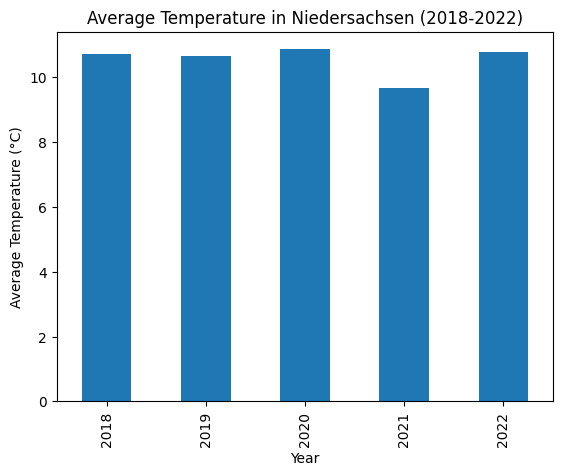

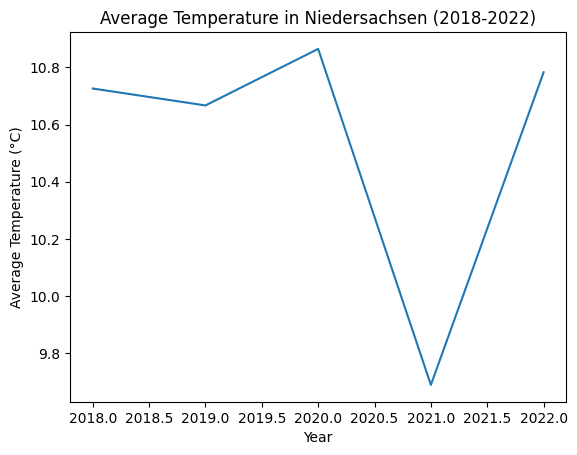

In [79]:
# prompt: plot graphs for niedersachsen_weather to show temperature for each year

import matplotlib.pyplot as plt

# Group the data by year and calculate the average temperature
grouped_data = niedersachsen_weather.groupby('year')['avg_temp'].mean()

# Create a bar chart
grouped_data.plot(kind='bar')

# Add title, labels, and legend
plt.title('Average Temperature in Niedersachsen (2018-2022)')
plt.xlabel('Year')
plt.ylabel('Average Temperature (°C)')

# Show the plot
plt.show()

# Create a line chart
grouped_data.plot(kind='line')

# Add title, labels, and legend
plt.title('Average Temperature in Niedersachsen (2018-2022)')
plt.xlabel('Year')
plt.ylabel('Average Temperature (°C)')

# Show the plot
plt.show()


In [80]:
accident_data_ml.columns

Index(['country', 'region', 'district', 'municipality', 'year', 'month',
       'hour', 'weekday', 'accident_category', 'accident_type',
       'accident_typology', 'light_conditions', 'road_conditions',
       'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
       'is_motorcycle_involved', 'is_heavy_vehicle_involved',
       'is_other_vehicle_involved', 'x_coordinate', 'y_coordinate',
       'year_column', 'date_time'],
      dtype='object')

In [81]:
niedersachsen_accidents = accident_data_ml[accident_data_ml['region'] == 'Niedersachsen']

In [82]:
niedersachsen_accidents.head()

,country,region,district,municipality,year,month,hour,weekday,accident_category,accident_type,...,is_bicycle_involved,is_car_involved,is_pedestrian_involved,is_motorcycle_involved,is_heavy_vehicle_involved,is_other_vehicle_involved,x_coordinate,y_coordinate,year_column,date_time
8253,3,Niedersachsen,59,12,2018,1,20,3,2,8,...,0,1,0,0,0,1,8.187329,52.246482,2018,2018-01-01
8254,3,Niedersachsen,52,25,2018,1,17,6,3,2,...,0,1,0,0,0,0,7.760606,53.391315,2018,2018-01-01
8263,3,Niedersachsen,51,31,2018,1,15,3,2,2,...,0,1,0,0,0,1,10.810953,52.487276,2018,2018-01-01
8264,3,Niedersachsen,61,12,2018,1,17,5,2,5,...,0,1,0,0,0,0,9.228972,52.924466,2018,2018-01-01
8273,3,Niedersachsen,58,27,2018,1,17,5,3,6,...,1,0,1,0,0,0,10.778960,52.156291,2018,2018-01-01


In [83]:
niedersachsen_accidents.shape

(128626, 23)

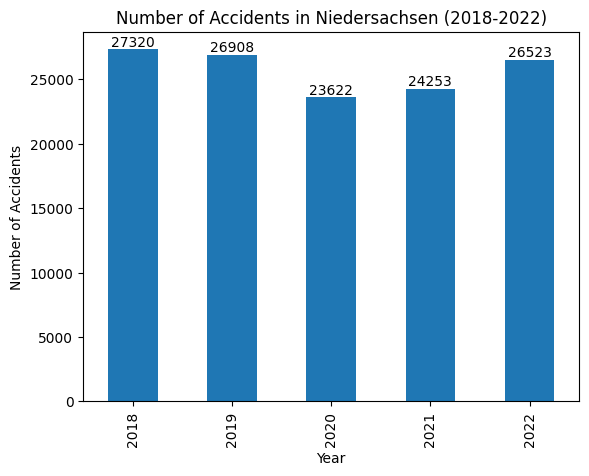

In [84]:
# prompt: generate a plot showing the count of accidents in niedersachsen over the years form 2018 to 2022. display the count of accidents in each year

import matplotlib.pyplot as plt
# Group the accident data by year and count the number of accidents
accidents_by_year = niedersachsen_accidents.groupby('year')['accident_category'].count()

# Create a bar chart
accidents_by_year.plot(kind='bar')

# Add title, labels, and legend
plt.title('Number of Accidents in Niedersachsen (2018-2022)')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')

# Add the number of accidents on top of each bar
for i, bar in enumerate(plt.gca().patches):
    plt.gca().text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
                    str(bar.get_height()), ha='center', va='bottom')

# Show the plot
plt.show()


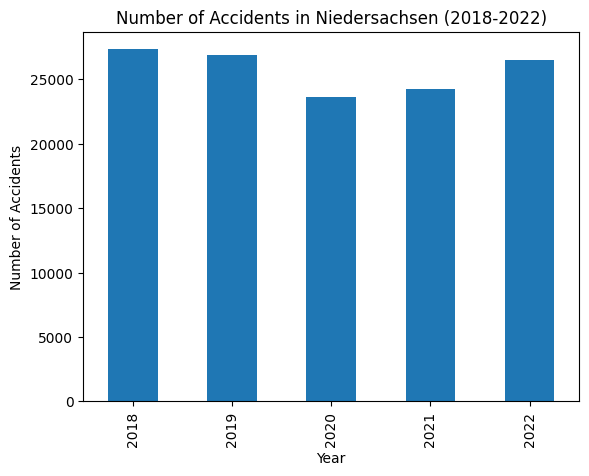

In [85]:
# prompt: generate a plot showing the count of accidents in niedersachsen over the zears form 2018 to 2022

import matplotlib.pyplot as plt
niedersachsen_accidents_by_year = niedersachsen_accidents.groupby('year').size()

# Create a bar chart
niedersachsen_accidents_by_year.plot(kind='bar')

# Add title, labels, and legend
plt.title('Number of Accidents in Niedersachsen (2018-2022)')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')

# Show the plot
plt.show()

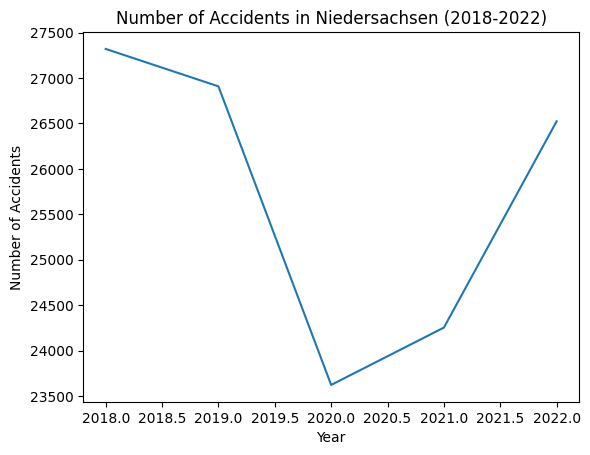

In [86]:
accidents_by_year.plot(kind='line')

# Add title, labels, and legend
plt.title('Number of Accidents in Niedersachsen (2018-2022)')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')

# Show the plot
plt.show()

<Axes: xlabel='year'>

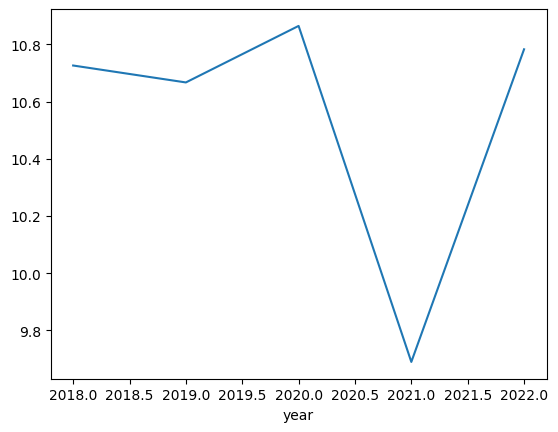

In [87]:
grouped_data.plot(kind='line')

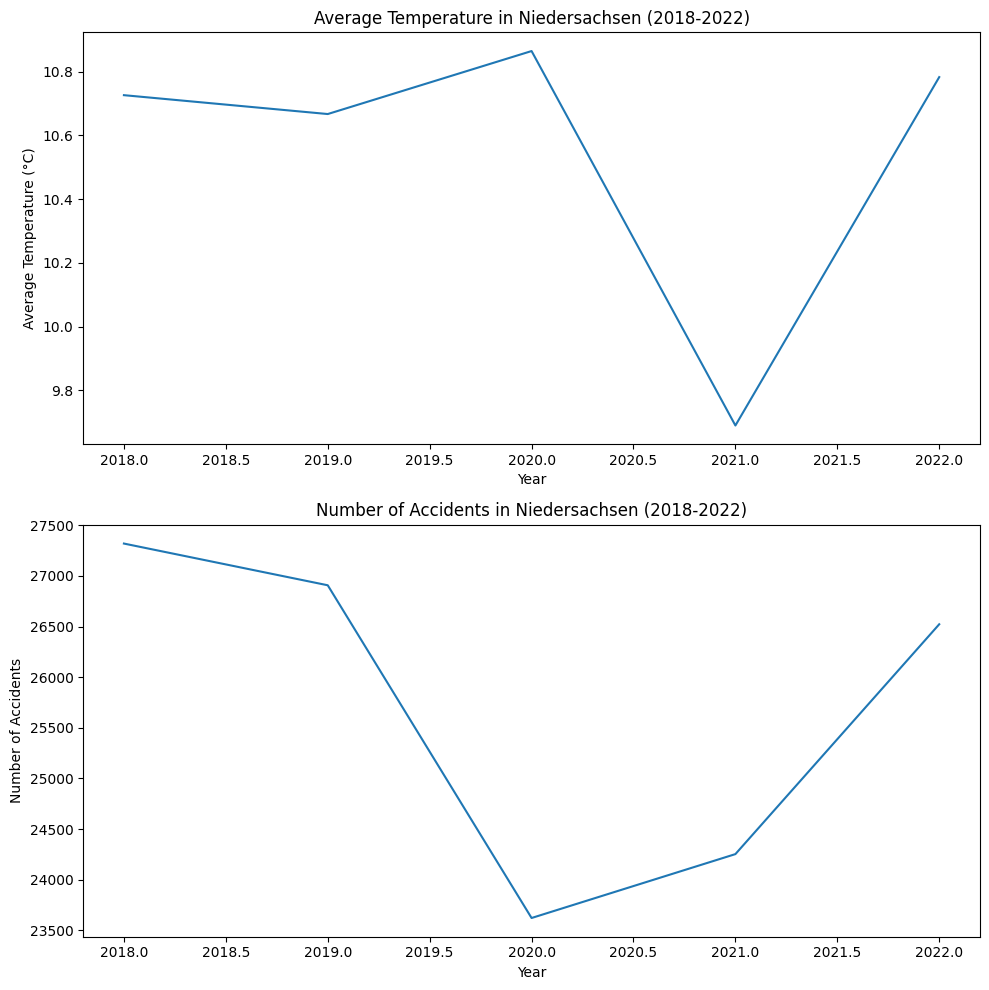

In [88]:
# prompt: Can you combine above two graphs in single graph

import matplotlib.pyplot as plt
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot the average temperature data on the first subplot
grouped_data.plot(kind='line', ax=ax1)
ax1.set_title('Average Temperature in Niedersachsen (2018-2022)')
ax1.set_xlabel('Year')
ax1.set_ylabel('Average Temperature (°C)')

# Plot the number of accidents data on the second subplot
accidents_by_year.plot(kind='line', ax=ax2)
ax2.set_title('Number of Accidents in Niedersachsen (2018-2022)')
ax2.set_xlabel('Year')
ax2.set_ylabel('Number of Accidents')

# Show the plot
plt.tight_layout()
plt.show()


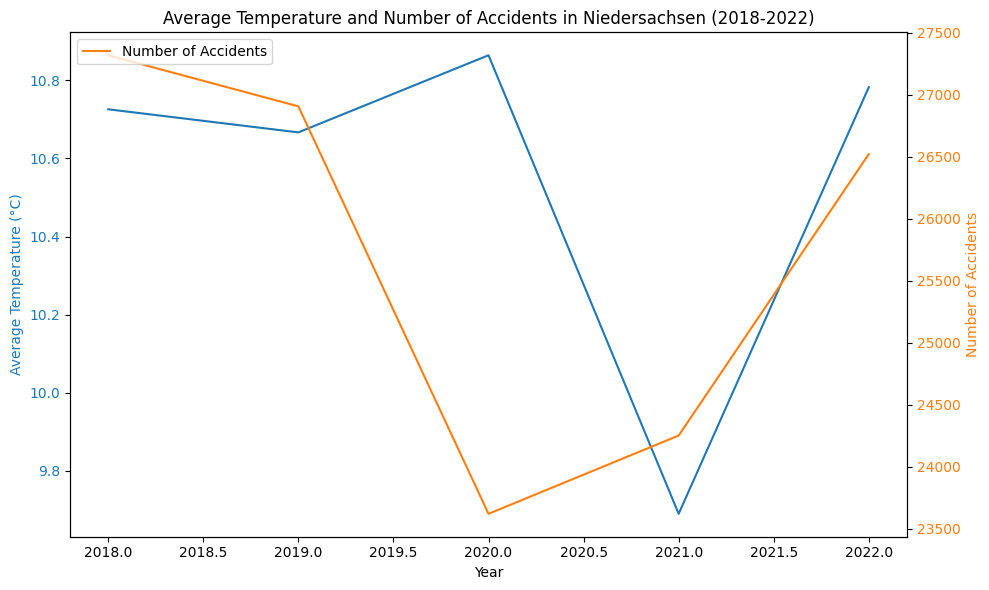

In [89]:
# prompt: Combine the above two line graphs in single graph

import matplotlib.pyplot as plt
# Create a figure with one subplot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the average temperature data
grouped_data.plot(kind='line', ax=ax, label='Average Temperature')

# Set the label for the y-axis of the first plot
ax.set_ylabel('Average Temperature (°C)', color='tab:blue')

# Set the y-axis tick labels for the first plot
ax.tick_params(axis='y', labelcolor='tab:blue')

# Create a twin y-axis for the number of accidents data
ax2 = ax.twinx()

# Plot the number of accidents data
accidents_by_year.plot(kind='line', ax=ax2, color='tab:orange', label='Number of Accidents')

# Set the label for the y-axis of the second plot
ax2.set_ylabel('Number of Accidents', color='tab:orange')

# Set the y-axis tick labels for the second plot
ax2.tick_params(axis='y', labelcolor='tab:orange')

# Set the title and labels for the x-axis
ax.set_title('Average Temperature and Number of Accidents in Niedersachsen (2018-2022)')
ax.set_xlabel('Year')

# Show the legend
plt.legend(loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()


<ipython-input-90-31c86198428a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_weather.rename(columns={region: 'avg_temp'}, inplace=True)


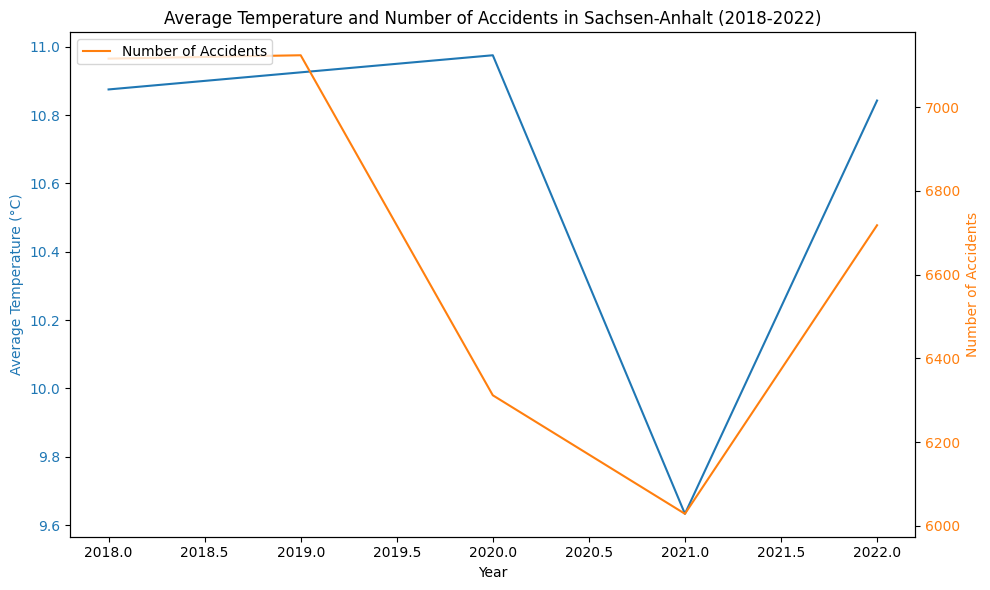

<ipython-input-90-31c86198428a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_weather.rename(columns={region: 'avg_temp'}, inplace=True)


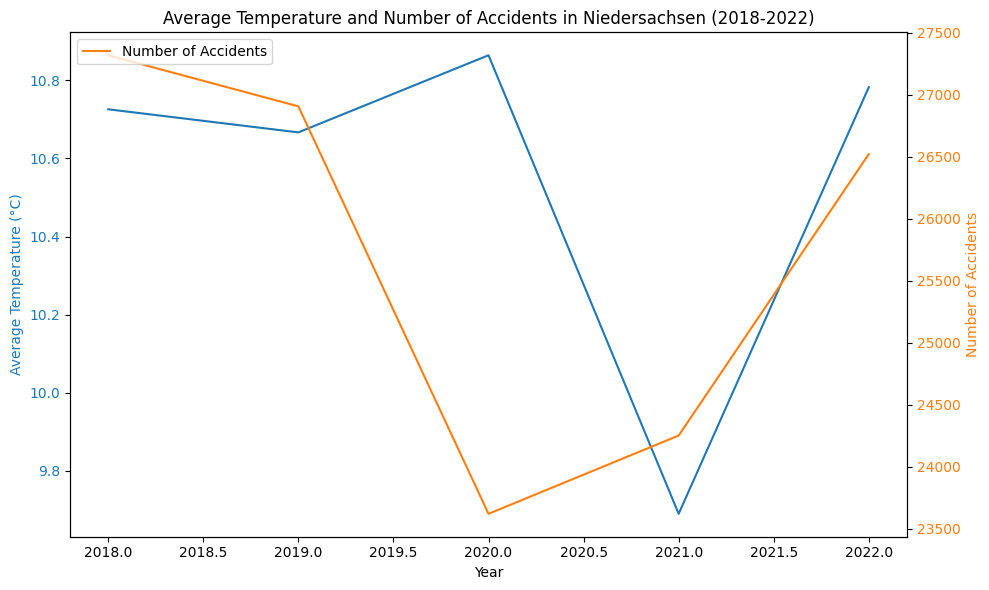

<ipython-input-90-31c86198428a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_weather.rename(columns={region: 'avg_temp'}, inplace=True)


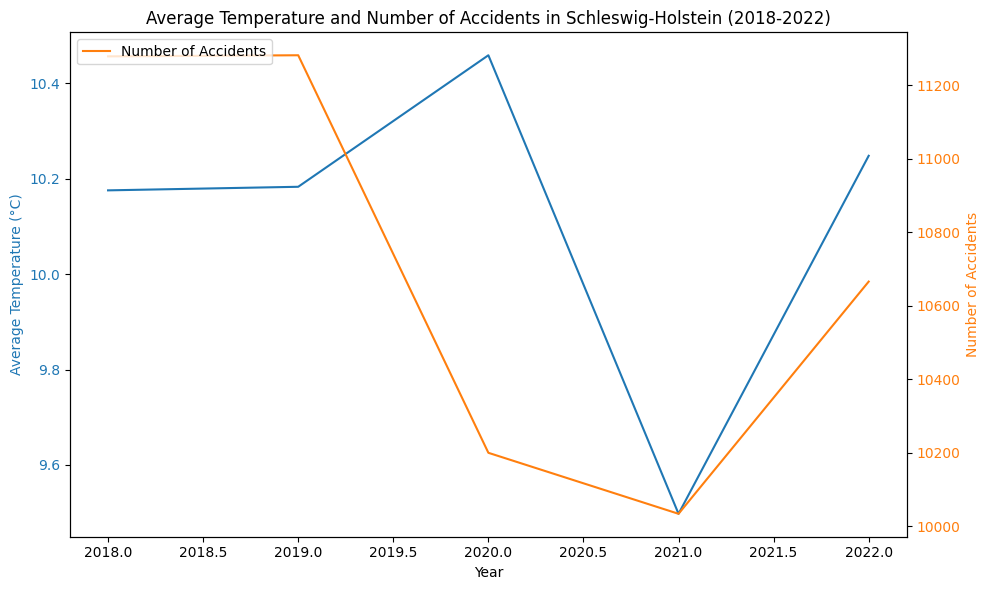

<ipython-input-90-31c86198428a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_weather.rename(columns={region: 'avg_temp'}, inplace=True)


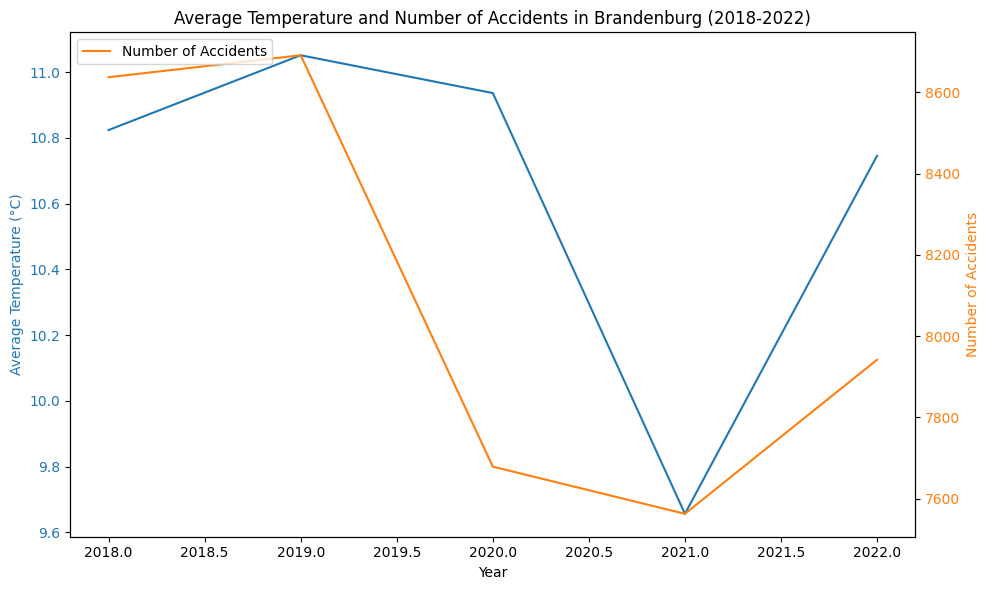

<ipython-input-90-31c86198428a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_weather.rename(columns={region: 'avg_temp'}, inplace=True)


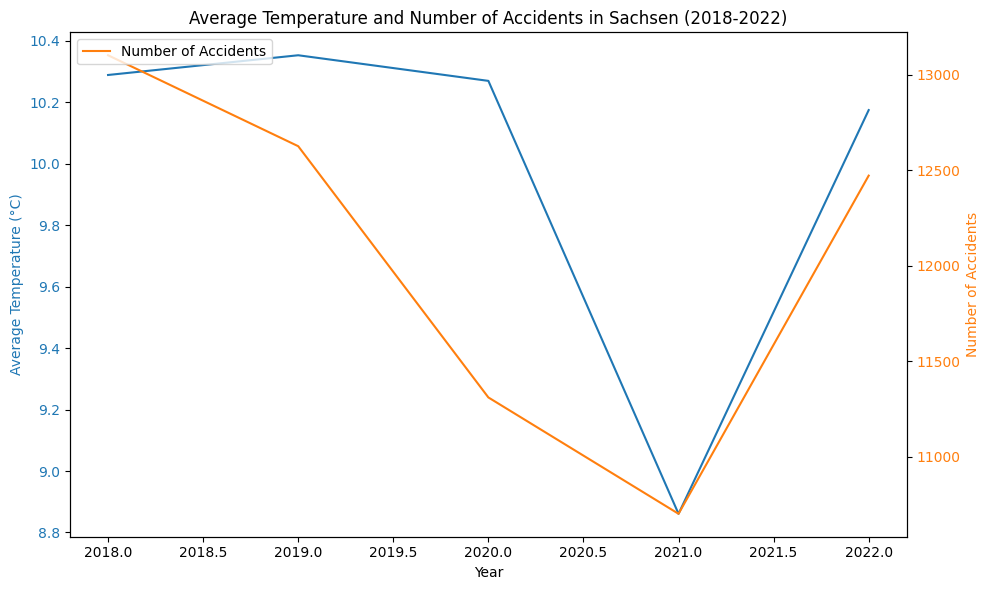

<ipython-input-90-31c86198428a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_weather.rename(columns={region: 'avg_temp'}, inplace=True)


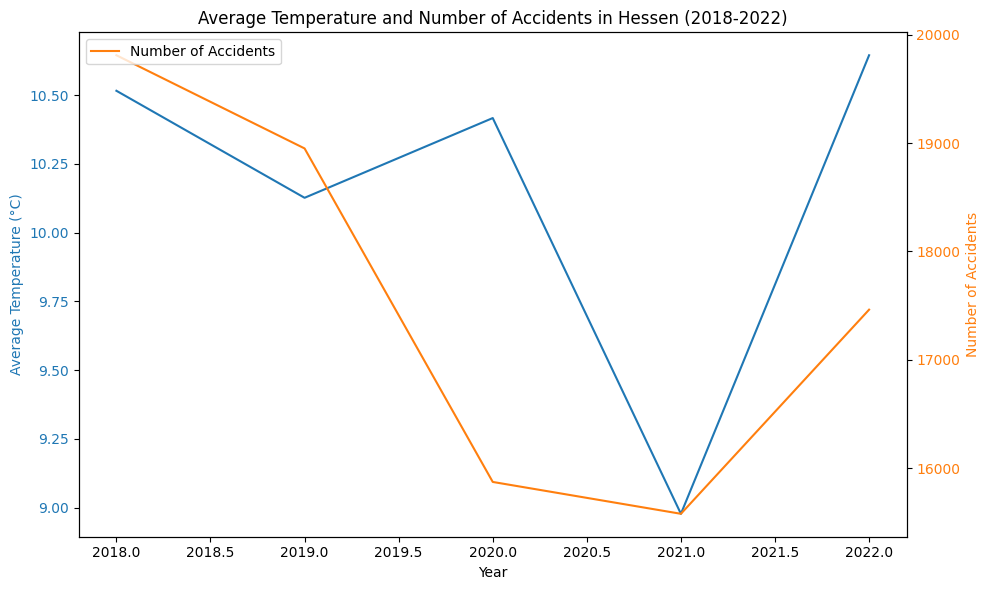

<ipython-input-90-31c86198428a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_weather.rename(columns={region: 'avg_temp'}, inplace=True)


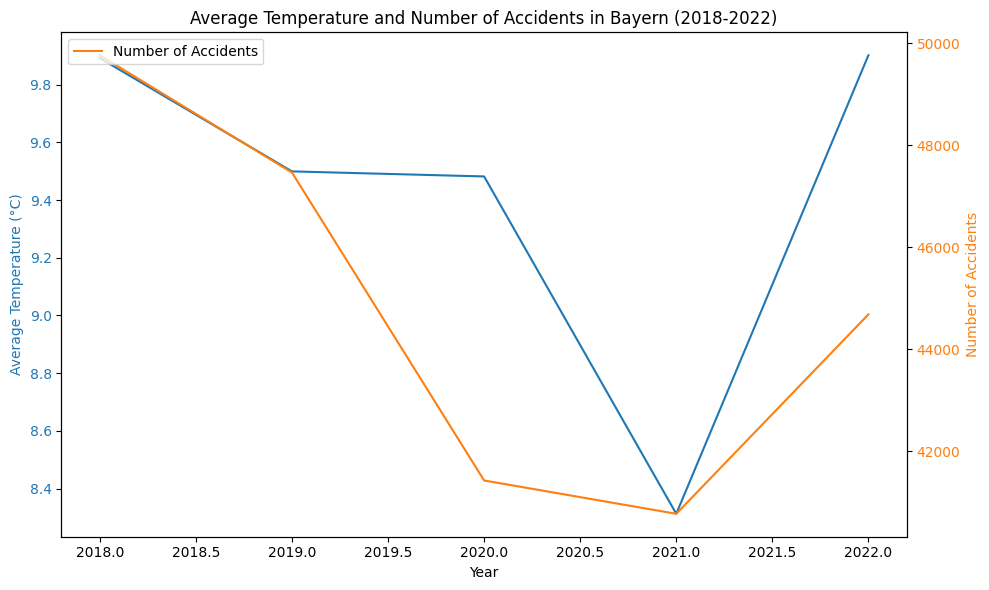

<ipython-input-90-31c86198428a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_weather.rename(columns={region: 'avg_temp'}, inplace=True)


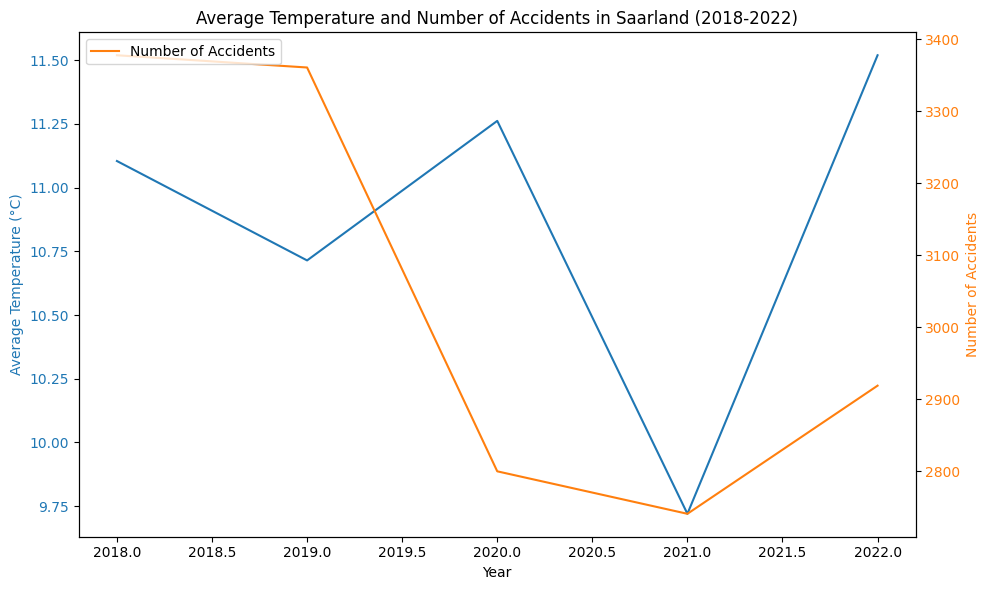

<ipython-input-90-31c86198428a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_weather.rename(columns={region: 'avg_temp'}, inplace=True)


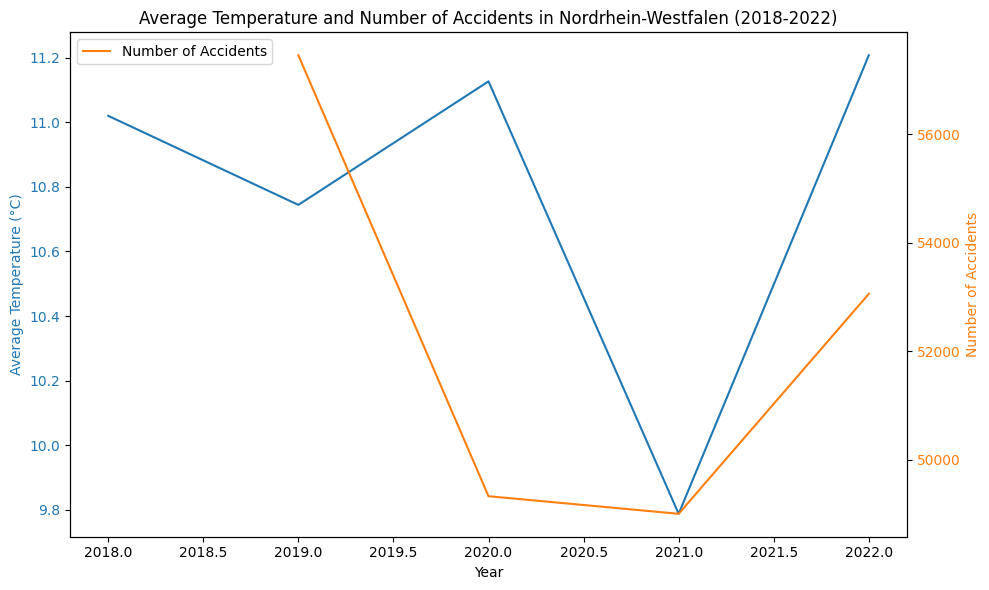

<ipython-input-90-31c86198428a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_weather.rename(columns={region: 'avg_temp'}, inplace=True)


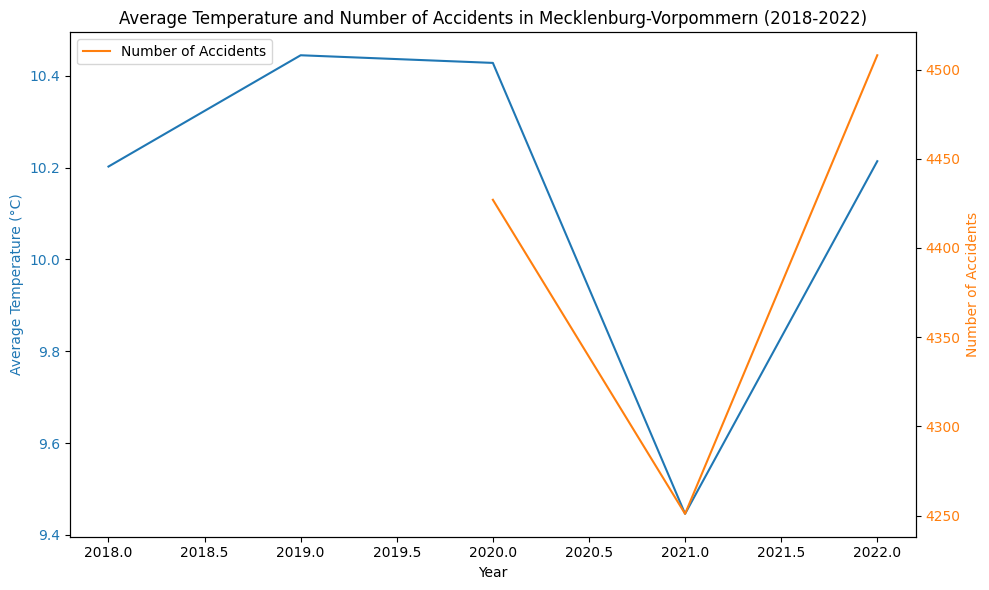

<ipython-input-90-31c86198428a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_weather.rename(columns={region: 'avg_temp'}, inplace=True)


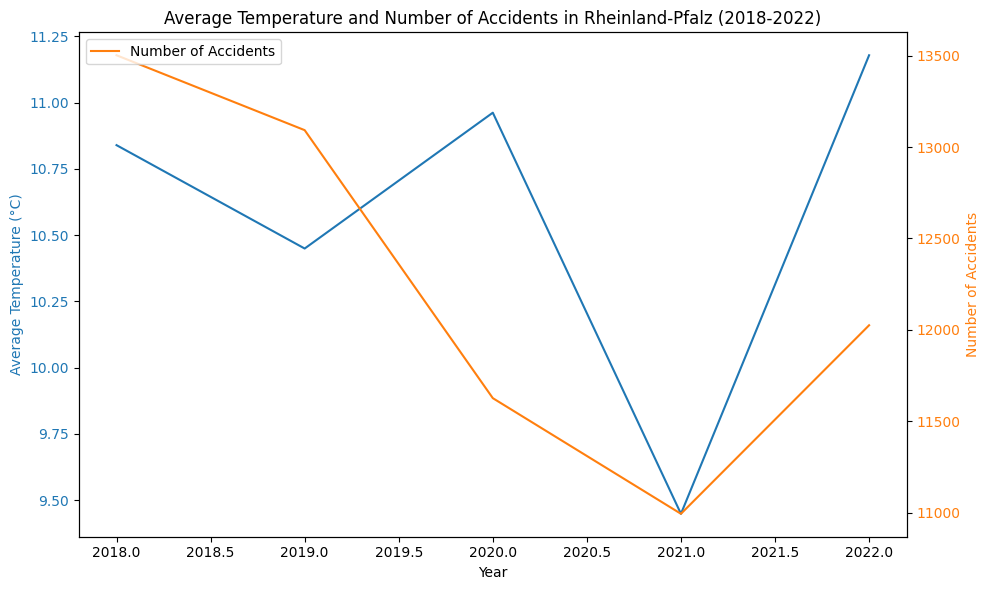

In [90]:
# prompt: Using common elements can you bring out the same graph as above for other regions from common_elements whichever are matching and applicable

import matplotlib.pyplot as plt
regions = list(common_elements)

for region in regions:
  region_weather = weather_18t022df[['year','Monat',region]]
  region_weather.rename(columns={region: 'avg_temp'}, inplace=True)

  # Group the data by year and calculate the average temperature
  grouped_data = region_weather.groupby('year')['avg_temp'].mean()

  # Group the accident data by year and count the number of accidents
  region_accidents = accident_data_ml[accident_data_ml['region'] == region]
  accidents_by_year = region_accidents.groupby('year').size()

  # Create a figure with one subplot
  fig, ax = plt.subplots(figsize=(10, 6))

  # Plot the average temperature data
  grouped_data.plot(kind='line', ax=ax, label='Average Temperature')

  # Set the label for the y-axis of the first plot
  ax.set_ylabel('Average Temperature (°C)', color='tab:blue')

  # Set the y-axis tick labels for the first plot
  ax.tick_params(axis='y', labelcolor='tab:blue')

  # Create a twin y-axis for the number of accidents data
  ax2 = ax.twinx()

  # Plot the number of accidents data
  accidents_by_year.plot(kind='line', ax=ax2, color='tab:orange', label='Number of Accidents')

  # Set the label for the y-axis of the second plot
  ax2.set_ylabel('Number of Accidents', color='tab:orange')

  # Set the y-axis tick labels for the second plot
  ax2.tick_params(axis='y', labelcolor='tab:orange')

  # Set the title and labels for the x-axis
  ax.set_title(f'Average Temperature and Number of Accidents in {region} (2018-2022)')
  ax.set_xlabel('Year')

  # Show the legend
  plt.legend(loc='upper left')

  # Show the plot
  plt.tight_layout()
  plt.show()


In [91]:
accident_data_ml.columns

Index(['country', 'region', 'district', 'municipality', 'year', 'month',
       'hour', 'weekday', 'accident_category', 'accident_type',
       'accident_typology', 'light_conditions', 'road_conditions',
       'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
       'is_motorcycle_involved', 'is_heavy_vehicle_involved',
       'is_other_vehicle_involved', 'x_coordinate', 'y_coordinate',
       'year_column', 'date_time'],
      dtype='object')

In [92]:
accident_data_ml.head()

,country,region,district,municipality,year,month,hour,weekday,accident_category,accident_type,...,is_bicycle_involved,is_car_involved,is_pedestrian_involved,is_motorcycle_involved,is_heavy_vehicle_involved,is_other_vehicle_involved,x_coordinate,y_coordinate,year_column,date_time
0,1,Schleswig-Holstein,3,0,2018,1,8,5,2,0,...,1,0,0,0,0,0,10.703950,53.863081,2018,2018-01-01
1,1,Schleswig-Holstein,62,20,2018,1,15,6,3,5,...,0,1,0,0,0,0,10.394497,53.589906,2018,2018-01-01
2,1,Schleswig-Holstein,56,15,2018,1,19,4,3,2,...,0,1,0,0,0,0,9.714396,53.743907,2018,2018-01-01
3,1,Schleswig-Holstein,59,37,2018,1,10,5,3,5,...,0,1,0,0,0,0,9.528666,54.636949,2018,2018-01-01
4,1,Schleswig-Holstein,58,150,2018,1,13,3,3,5,...,0,1,0,0,0,0,10.115680,54.479588,2018,2018-01-01


In [93]:
before geo plots

SyntaxError: invalid syntax (<ipython-input-93-bb3efbe64de7>, line 1)

In [ ]:
import pandas as pd
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame

df = accident_data_ml.copy()

geometry = [Point(xy) for xy in zip(df['x_coordinate'], df['y_coordinate'])]
gdf = GeoDataFrame(df, geometry=geometry)

#this is a simple map that goes with geopandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15);

In [99]:
accident_data_ml.shape

(1207932, 23)

In [103]:
accident_data_ml.columns

Index(['country', 'region', 'district', 'municipality', 'year', 'month',
       'hour', 'weekday', 'accident_category', 'accident_type',
       'accident_typology', 'light_conditions', 'road_conditions',
       'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
       'is_motorcycle_involved', 'is_heavy_vehicle_involved',
       'is_other_vehicle_involved', 'x_coordinate', 'y_coordinate',
       'year_column', 'date_time'],
      dtype='object')

In [108]:
# prompt: create dataframe with one row for each district with aggregate count as other column and center for the coordinates which mean of x and y coordinates

import pandas as pd

# Create a new DataFrame with the district names as index and the other columns as desired
df_dist = pd.DataFrame({
    'district': accident_data_ml['district'].unique(),
    'aggregate_count': accident_data_ml.groupby('district')['accident_category'].count(),
    'center_x': accident_data_ml.groupby('district')['x_coordinate'].mean(),
    'center_y': accident_data_ml.groupby('district')['y_coordinate'].mean()
})

# Display the DataFrame
df_dist.head()


,district,aggregate_count,center_x,center_y
district,,,,
1,3,20840,11.756638,52.854401
2,62,19399,11.522021,52.905854
3,56,23036,11.267124,53.077079
4,59,16297,11.289804,52.876467
5,58,8683,11.191727,53.113981


In [109]:
df_dist.shape

(87, 4)

In [124]:
import plotly.express as px
import pandas as pd

df = df_dist.copy()

#color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(df,
                        lat=df["center_y"],
                        lon=df["center_x"],
                        hover_name="district",
                        hover_data=["district", "aggregate_count"],
                        color=df["district"],
                        #color_continuous_scale=color_scale,
                        size=df["aggregate_count"],
                        zoom=6,
                        height=900,
                        width=1200,
                        size_max = 40,
                        mapbox_style="carto-positron"
                        )

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
accident_data_ml.columns

In [ ]:
@before machine learning

In [ ]:
# prompt: Generate ML algortihm to predict the accident_category, accident_type, based on 'accident_typology', 'light_conditions', 'road_conditions',
#        'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
#        'is_motorcycle_involved', 'is_heavy_vehicle_involved',
#        'is_other_vehicle_involved' and country

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Load the data
data = accident_data_ml

# Select features and target variable
features = ['accident_typology', 'light_conditions', 'road_conditions',
       'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
       'is_motorcycle_involved', 'is_heavy_vehicle_involved',
       'is_other_vehicle_involved', 'country']
target = 'accident_category'

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.25)

# Create a Random Forest classifier
model = RandomForestClassifier()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
predictions = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, predictions)
print('Accuracy:', accuracy)


In [ ]:
# prompt: now generate using Randomforest model

import pandas as pd
from sklearn.ensemble import RandomForestClassifier

# Load the data
data = accident_data_ml

# Select features and target variable
features = ['accident_typology', 'light_conditions', 'road_conditions',
       'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
       'is_motorcycle_involved', 'is_heavy_vehicle_involved',
       'is_other_vehicle_involved', 'country']
target = 'accident_category'

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.25)

# Create a Random Forest classifier
model = RandomForestClassifier()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
predictions = model.predict(X_test)

# Generate the predictions as a new DataFrame
predictions_df = pd.DataFrame(predictions, columns=['predicted_accident_category'])

# Display the first few rows of the predictions DataFrame
print(predictions_df.head())


In [ ]:
# prompt: generate model using logistic regression model

from sklearn.linear_model import LogisticRegression

# Load the data
data = accident_data_ml

# Select features and target variable
features = ['accident_typology', 'light_conditions', 'road_conditions',
       'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
       'is_motorcycle_involved', 'is_heavy_vehicle_involved',
       'is_other_vehicle_involved', 'country']
target = 'accident_category'

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data[features], data[target], test_size=0.25)

# Create a Logistic Regression model
model = LogisticRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
predictions = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, predictions)
print('Accuracy:', accuracy)

# Generate predictions for the entire dataset
predictions = model.predict(data[features])

# Add the predictions to the DataFrame
data['predicted_category'] = predictions

# Print the DataFrame
print(data)

In [125]:
accident_data_ml.columns

Index(['country', 'region', 'district', 'municipality', 'year', 'month',
       'hour', 'weekday', 'accident_category', 'accident_type',
       'accident_typology', 'light_conditions', 'road_conditions',
       'is_bicycle_involved', 'is_car_involved', 'is_pedestrian_involved',
       'is_motorcycle_involved', 'is_heavy_vehicle_involved',
       'is_other_vehicle_involved', 'x_coordinate', 'y_coordinate',
       'year_column', 'date_time'],
      dtype='object')

In [127]:
accident_data_ml.head(1)

,country,region,district,municipality,year,month,hour,weekday,accident_category,accident_type,...,is_bicycle_involved,is_car_involved,is_pedestrian_involved,is_motorcycle_involved,is_heavy_vehicle_involved,is_other_vehicle_involved,x_coordinate,y_coordinate,year_column,date_time
0,1,Schleswig-Holstein,3,0,2018,1,8,5,2,0,...,1,0,0,0,0,0,10.70395,53.863081,2018,2018-01-01


In [128]:
new_lic = pd.read_excel('New_license.xlsx')

In [129]:
new_lic


,Year,Baden-Württemberg,Bayern,Berlin,Brandenburg,Bremen,Hamburg,Hessen,Mecklenburg-Vorpommern,Niedersachsen,Nordrhein-Westfalen,Rheinland-Pfalz,Saarland,Sachsen,Sachsen-Anhalt,Schleswig-Holstein,Thüringen
0,2018,177617.178,205808.808,38090.946,26745.068,8209.320,20560.420,87190.298,19072.125,135001.530,271837.496,63874.662,14453.208,44753.526,2540.820,45334.266,26152.623
1,2019,176483.340,211449.722,39564.375,27712.667,8198.190,21372.247,87996.906,19155.072,135392.621,272803.464,63119.485,13822.706,46490.990,26331.648,45686.861,26933.472
2,2020,161729.235,187657.627,37128.308,24704.304,7399.652,18136.484,80634.000,16617.991,12270.017,248981.652,57200.817,12695.535,40779.762,23233.611,4066.816,24396.190
3,2021,168397.221,205322.620,33058.243,2902.585,8042.832,19527.200,92284.842,16044.490,134905.047,257282.216,51001.036,12356.820,39824.802,23566.400,41284.529,25497.912
4,2022,176646.252,220369.170,39432.898,28226.088,10826.802,20860.902,87456.190,18870.720,129374.784,267793.152,63457.236,13945.218,47898.940,26355.780,44437.548,29181.075


In [130]:
# prompt: can you create a dataframe which is aggregate of no. of accidents in a year for each region in seperate columns

import pandas as pd

# Create a pivot table with year as index, region as columns, and number of accidents as values
accident_pivot = accident_data_ml.pivot_table(index='year', columns='region', values='accident_category', aggfunc='count')

# Print the pivot table
accident_pivot

region,Baden-Württemberg,Bayern,Berlin,Brandenburg,Bremen,Hamburg,Hessen,Mecklenburg-Vorpommern,Niedersachsen,Nordrhein-Westfalen,Rheinland-Pfalz,Saarland,Sachsen,Sachsen-Anhalt,Schleswig-Holstein,Thüringen
year,,,,,,,,,,,,,,,,
2018,34028.0,49760.0,13652.0,8637.0,3107.0,7176.0,19811.0,NaN,27320.0,NaN,13503.0,3378.0,13101.0,7116.0,11279.0,NaN
2019,32964.0,47461.0,13390.0,8691.0,2940.0,6827.0,18951.0,NaN,26908.0,57454.0,13093.0,3361.0,12625.0,7124.0,11282.0,5299.0
2020,28450.0,41424.0,11810.0,7679.0,2419.0,6096.0,15873.0,4427.0,23622.0,49328.0,11626.0,2800.0,11310.0,6312.0,10200.0,4618.0
2021,27017.0,40771.0,11267.0,7563.0,2300.0,6246.0,15579.0,4251.0,24253.0,49004.0,10993.0,2741.0,10701.0,6029.0,10034.0,4459.0
2022,30494.0,44680.0,12348.0,7942.0,2497.0,7174.0,17463.0,4508.0,26523.0,53057.0,12025.0,2919.0,12471.0,6718.0,10666.0,5007.0


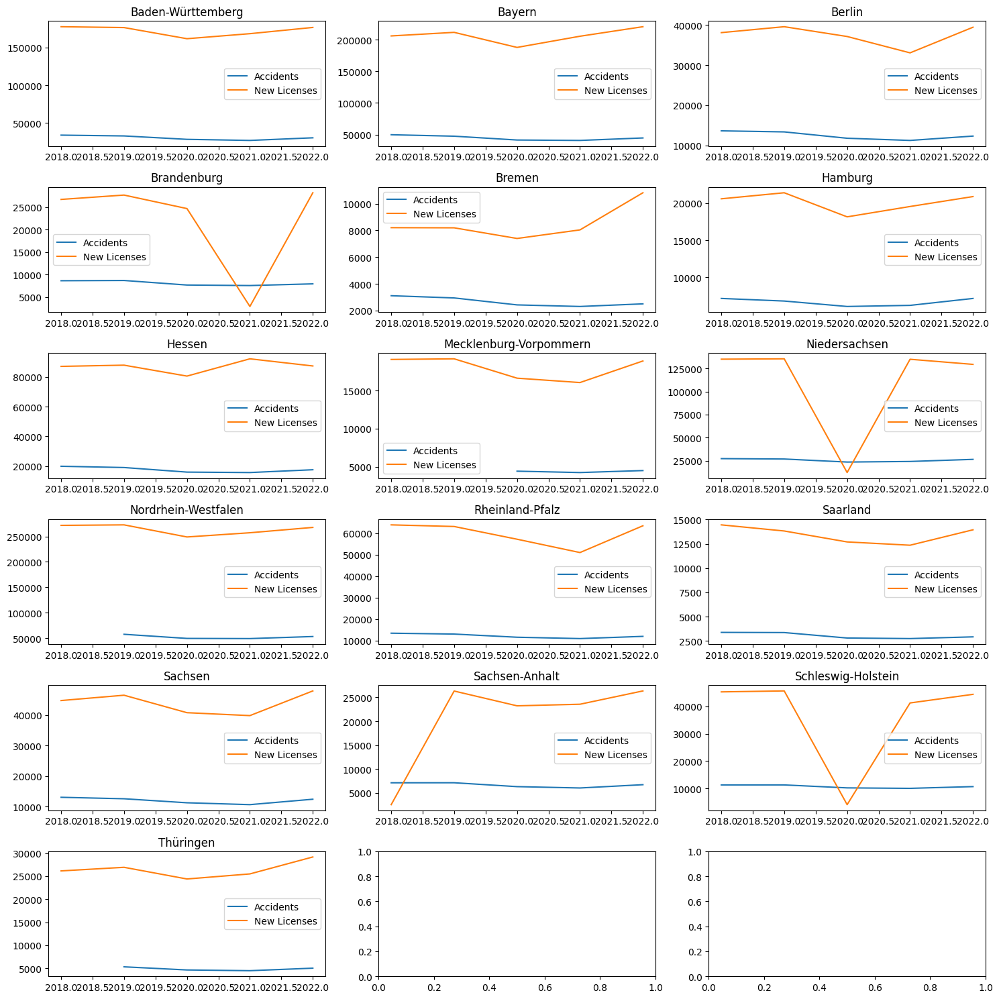

In [131]:
import matplotlib.pyplot as plt

# Calculate the number of rows needed for subplots
num_regions = len(accident_pivot.columns)
num_rows = (num_regions + 2) // 3  # Round up to ensure enough rows

# Create a figure with enough subplots for all regions
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 15))

# Loop through each region and create a timeseries plot
for i, region in enumerate(accident_pivot.columns):
    row = i // 3
    col = i % 3
    ax = axes[row, col]  # Access the correct subplot
    ax.plot(accident_pivot.index, accident_pivot[region], label='Accidents')
    ax.plot(new_lic['Year'], new_lic[region], label='New Licenses')
    ax.set_title(region)
    ax.legend()

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

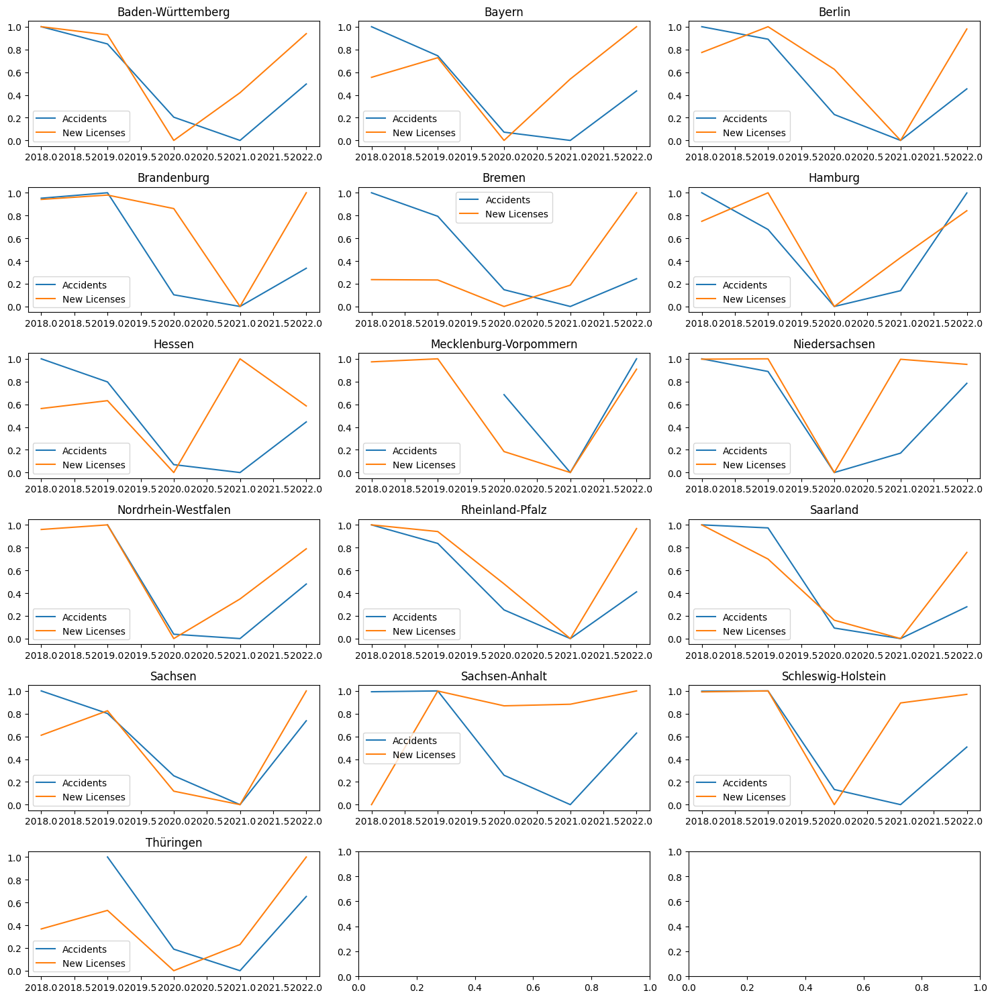

In [132]:
# prompt: can you normalize the values of no. of accidents and new licences and then plot the graphs

import matplotlib.pyplot as plt
# Normalize the number of accidents and new licenses
normalized_accidents = (accident_pivot - accident_pivot.min()) / (accident_pivot.max() - accident_pivot.min())
normalized_licenses = (new_lic - new_lic.min()) / (new_lic.max() - new_lic.min())

# Create a figure with enough subplots for all regions
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 15))

# Loop through each region and create a timeseries plot
for i, region in enumerate(accident_pivot.columns):
    row = i // 3
    col = i % 3
    ax = axes[row, col]  # Access the correct subplot
    ax.plot(accident_pivot.index, normalized_accidents[region], label='Accidents')
    ax.plot(new_lic['Year'], normalized_licenses[region], label='New Licenses')
    ax.set_title(region)
    ax.legend()

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


In [144]:
new_reg = pd.read_excel('New_Reg.xlsx')

In [145]:
new_reg.head(16)

,year,Baden-Württemberg,Bayern,Berlin,Brandenburg,Bremen,Hamburg,Hessen,Mecklenburg-Vorpommern,Niedersachsen,Nordrhein-Westfalen,Rheinland-Pfalz,Saarland,Sachsen,Sachsen-Anhalt,Schleswig-Holstein,Thüringen
0,2018,553133,828662,100087,86115,23737,153881,413668,50838,408616,786348,161038,45524,148938,72527,106712,83398
1,2019,596284,864917,110006,84346,24451,156848,437737,50309,431932,837339,167238,48187,152214,73547,110475,85144
2,2020,502664,707544,87693,77148,20634,117680,347274,46446,357558,720029,144406,42501,131174,65558,98533,73087
3,2021,440699,658182,79527,69781,18477,106926,333045,41711,324987,660354,132837,37625,113724,57594,91801,63700
4,2022,439669,665818,85790,66143,18686,96966,333709,38937,320529,671597,137007,37798,111487,59082,90259,64869


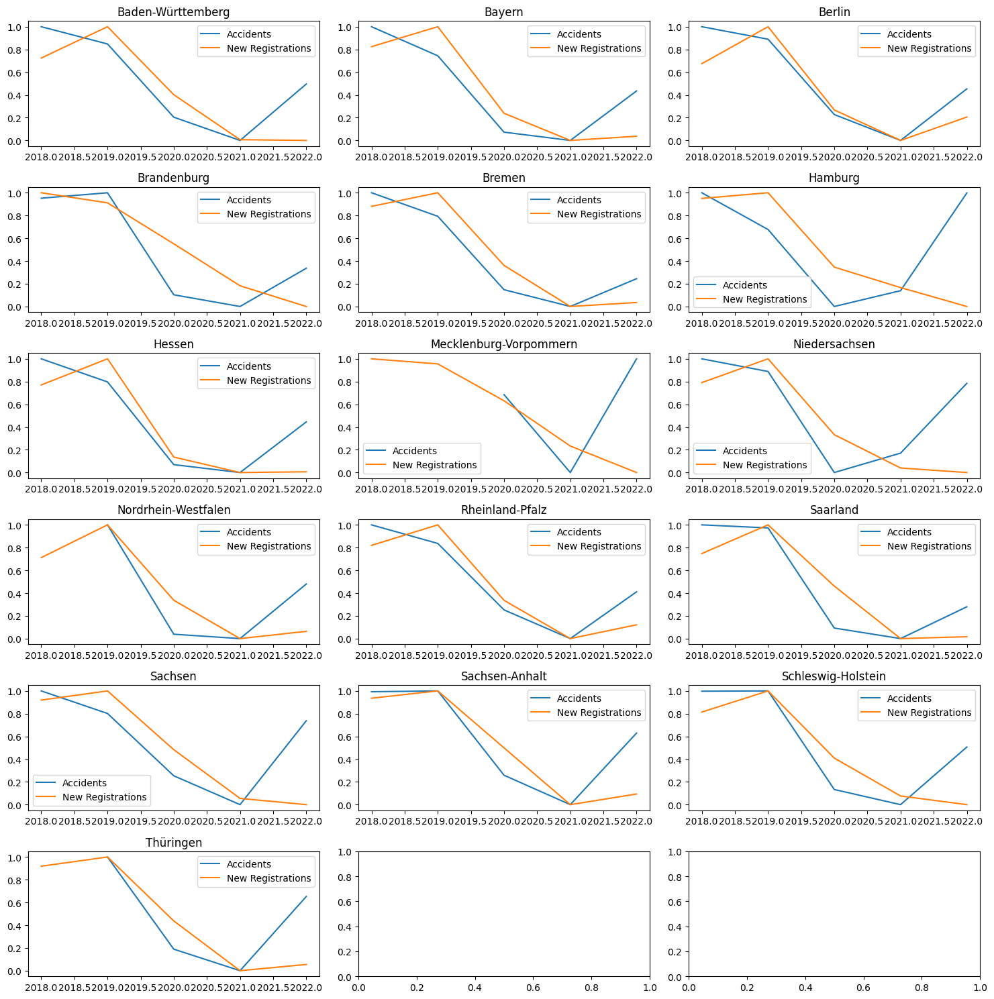

In [146]:
# prompt: create a graph between the accidents_pivot and new_reg data same like above for each region

import matplotlib.pyplot as plt
# Normalize the number of accidents and new registrations
normalized_accidents = (accident_pivot - accident_pivot.min()) / (accident_pivot.max() - accident_pivot.min())
normalized_registrations = (new_reg - new_reg.min()) / (new_reg.max() - new_reg.min())

# Create a figure with enough subplots for all regions
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 15))

# Loop through each region and create a timeseries plot
for i, region in enumerate(accident_pivot.columns):
    row = i // 3
    col = i % 3
    ax = axes[row, col]  # Access the correct subplot
    ax.plot(accident_pivot.index, normalized_accidents[region], label='Accidents')
    ax.plot(new_reg['year'], normalized_registrations[region], label='New Registrations')
    ax.set_title(region)
    ax.legend()

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()
